# Initialzing and loading required libraries and subfunctions

In [ ]:


# System and path setup
import sys
import os
import re
import copy
import pickle
from io import BytesIO
from tqdm import tqdm

# Add project root to path for custom modules
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '../..')))

# Custom modules from src directory
from src.utils import *
from src.detect_pt import *
from src.structure_index import *

# Core libraries
import numpy as np
import pandas as pd
import scipy
from scipy import signal
from scipy.io import loadmat
from scipy.fft import fft
import scipy.fft
import scipy.stats
import scipy.io as sio
from scipy.stats import entropy, pearsonr
from scipy.signal import hilbert, correlate, spectrogram
from scipy.interpolate import griddata, interp1d
from scipy.spatial.distance import euclidean
from scipy.spatial import cKDTree

# Data processing and machine learning
from sklearn.preprocessing import normalize, Normalizer
from sklearn.decomposition import PCA, FastICA
import umap.umap_ as umap
import skdim
import sails
import requests

# Neuro libraries
import yasa
from mne.filter import resample
import pynapple as nap
from neurodsp.sim import sim_combined
from neurodsp.plts import plot_time_series, plot_timefrequency
from neurodsp.utils import create_times
from neurodsp.timefrequency.wavelets import compute_wavelet_transform
from neurodsp.filt import filter_signal, filter_signal_fir, design_fir_filter
import emd
import emd.sift as sift
import emd.spectra as spectra

# Visualization libraries
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker
from matplotlib.cm import ScalarMappable
import seaborn as sns
import plotly.express as px

# Set visualization style
sns.set(style='white', context='notebook')

In [2]:
path_to_hpc = '/Users/amir/Desktop/for Abdel/OS Basic/11/Rat-OS-Ephys_Rat11_SD4_OR_03-11-2018/2018-11-05_14-15-28_Post_Trial5/HPC_100_CH32_0.continuous.mat'
path_to_states = '/Users/amir/Desktop/for Abdel/OS Basic/11/Rat-OS-Ephys_Rat11_SD4_OR_03-11-2018/2018-11-05_14-15-28_Post_Trial5/2018-11-05_14-15-28_post_trial5-states.mat'

In [3]:
lfpHPC, hypno, fs = get_data(path_to_hpc, path_to_states)

There was 0 in the dataset


In [4]:
config = emd.sift.SiftConfig.from_yaml_file('/Users/amir/Desktop/for Abdel/emd_masksift_CA1_config_2500.yml')

In [5]:
phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)

Number of detected Tonic intrevals:54
Number of detected Tonic intrevals after threshold:54


In [6]:
phasic_interval

           start     end
0         1129.82  1130.91
1         1145.02  1146.33
2         1146.71  1149.98
3         1851.8   1852.99
4         1868.71  1869.62
5         1875.49  1876.49
6         1878.44  1881.17
          ...
28        6932.14  6935.35
29        7386.54  7389.06
30        7408.16  7409.17
31        7722.59  7724.31
32         7744    7746.17
33        7747.37  7748.31
34        7823.86  7825.15
shape: (35, 2), time unit: sec.

# Example for Cycle-by-Cycle explroation of gamma components in one phasic and tonic rem epoch.

## Extracting Intrinisic Mode Function(IMF)s.

In [7]:
phasic_imfs, phasic_imfs_freqs, rem_lpf = extract_imfs_by_pt_intervals(lfp, fs, phasic_interval, config, return_imfs_freqs=True)

In [21]:
tonic_imfs, tonic_imfs_freqs, tonic_rem_lpf = extract_imfs_by_pt_intervals(lfp, fs, tonic_interval, config, return_imfs_freqs=True)

In [8]:
all_phasic_cycle_ctrls, all_phasic_cycles_se, all_phasic_FPPs = extract_cycle_info(phasic_imfs, phasic_imfs_freqs)
all_tonic_cycle_ctrls, all_tonic_cycles_se, all_tonic_FPPs = extract_cycle_info(tonic_imfs, tonic_imfs_freqs)

 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs 

NameError: name 'tonic_imfs' is not defined

In [6]:
frequencies = np.arange(15, 141, 1)
angles = np.linspace(-180, 180, 19)

In [18]:
FPP = all_phasic_FPPs[1]
all_cycles_inds = all_phasic_cycles_se[0]
all_cycles_ctrl = all_phasic_cycle_ctrls[0]
imf = phasic_imfs[0]
firstRemLFP = rem_lpf[0]

In [32]:
len(imf[:, 5])

8550

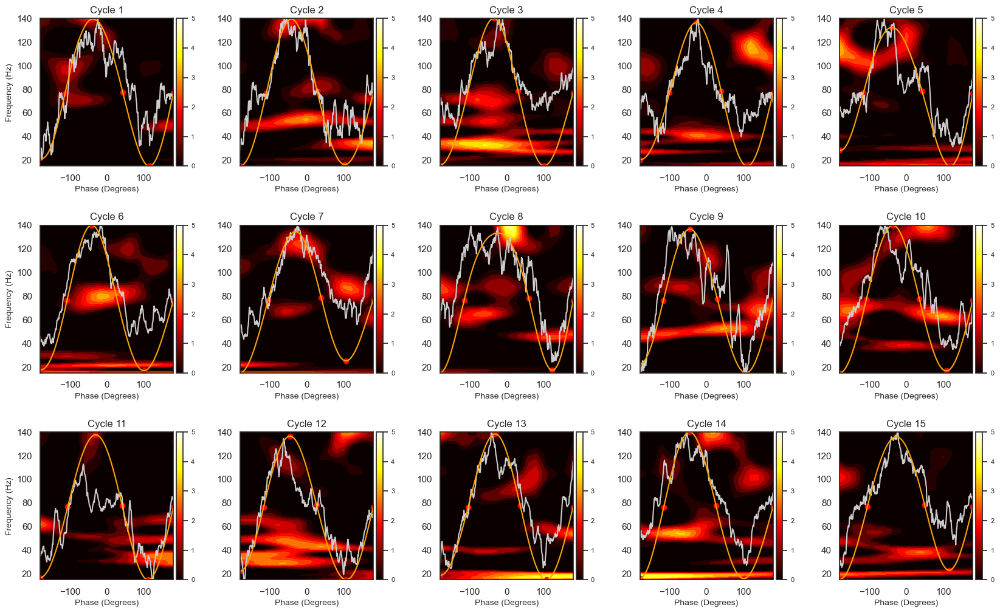

In [53]:
n_rows, n_cols = 3, 5
max_plots = n_rows * n_cols

vmin = 0
vmax = 5

n_levels = 20
levels = np.linspace(np.min(FPP), np.max(FPP), n_levels)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 12))
plt.subplots_adjust(wspace=0.4, hspace=0.4)

for ii in range(min(len(FPP), max_plots)):
    ax = axes[ii // n_cols, ii % n_cols]

    # Create contourf plot with specified levels and normalization
    im = ax.contourf(angles, frequencies, FPP[ii], levels=levels, cmap='hot', vmin=vmin, vmax=vmax)

    ax.set_xlabel(r'Phase (Degrees)', fontsize=10)
    if ii % n_cols == 0:
        ax.set_ylabel(r'Frequency (Hz)', fontsize=10)

    ax.set_title(f"Cycle {ii+1}", fontsize=12)
    
    xinds = np.arange(len(all_cycles_inds[ii]))
    raw_lfp = firstRemLFP[all_cycles_inds[ii]]
    theta_part = imf[all_cycles_inds[ii], 5]

    phase_scaled_xinds = np.linspace(angles.min(), angles.max(), len(xinds))
    lfp_scaled_y = (raw_lfp / np.max(np.abs(raw_lfp))) * (frequencies.max() - frequencies.min()) / 2 + frequencies.mean()
    theta_scaled_y = (theta_part / np.max(np.abs(theta_part))) * (frequencies.max() - frequencies.min()) / 2 + frequencies.mean()

    # Plot raw LFP and IMF-6 on the current axis
    ax.plot(phase_scaled_xinds, lfp_scaled_y, color=[0.8, 0.8, 0.8], label='Raw LFP')
    ax.plot(phase_scaled_xinds, theta_scaled_y, color='orange', label='IMF-6')

    # Plot control points
    ctrl_points_x = np.interp(all_cycles_ctrl[ii], np.arange(len(xinds)), phase_scaled_xinds)
    ctrl_points_y = (theta_part[all_cycles_ctrl[ii]] / np.max(np.abs(theta_part))) * (frequencies.max() - frequencies.min()) / 2 + frequencies.mean()
    ax.scatter(ctrl_points_x, ctrl_points_y, color='red', marker='o', label='Control Points')

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)

    cbar = fig.colorbar(ScalarMappable(norm=im.norm, cmap=im.cmap), cax=cax, ticks=range(vmin, vmax+5, 5))
    im.set_clim(vmin, vmax)
    cbar.set_ticks(np.linspace(vmin, vmax, 6))
    cbar.ax.tick_params(labelsize=8)
plt.show()

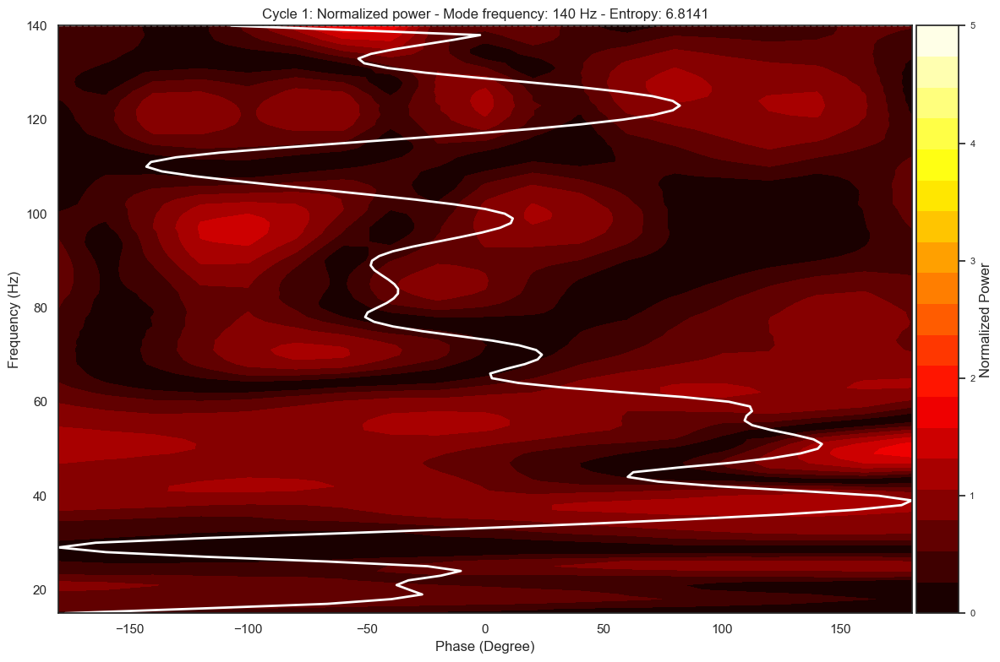

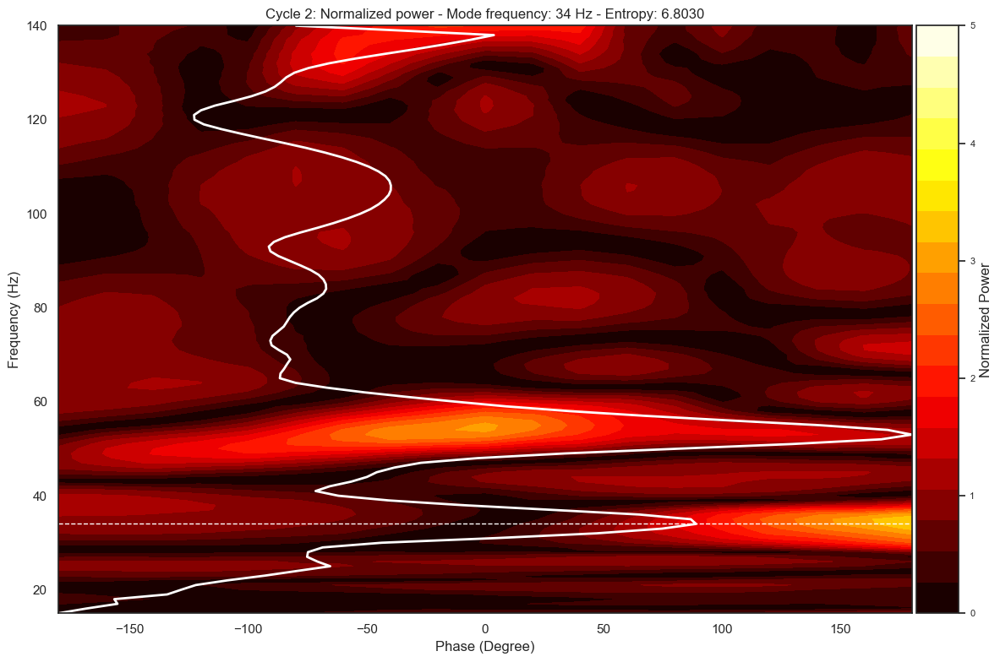

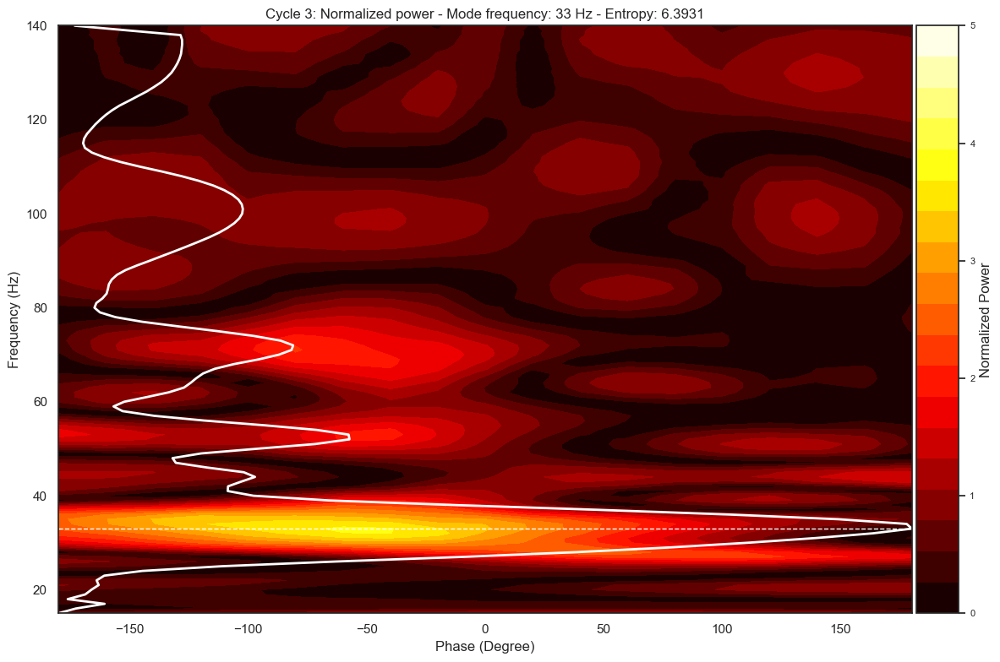

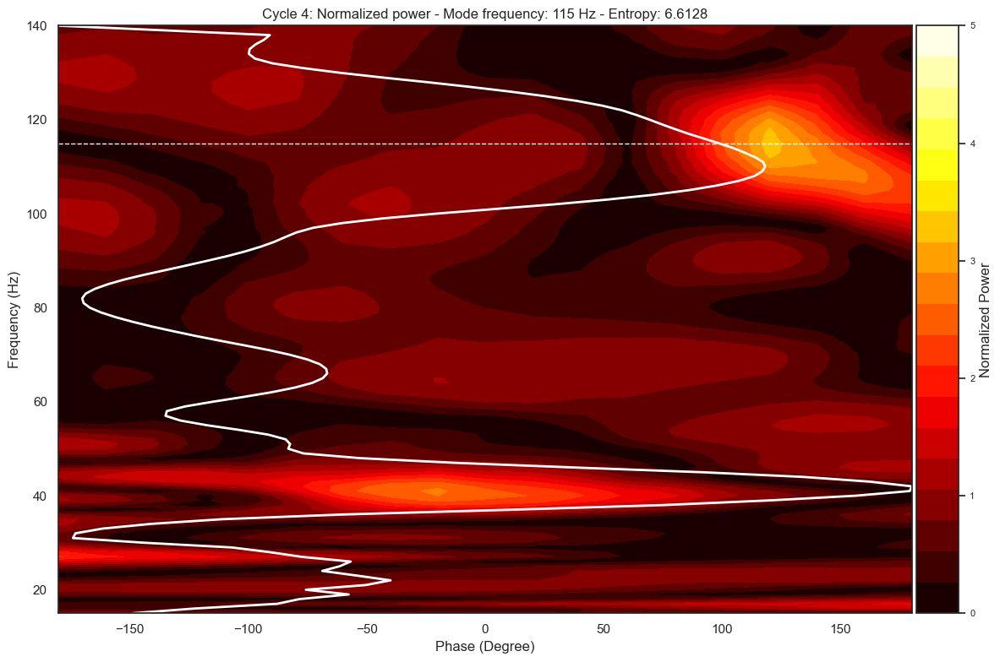

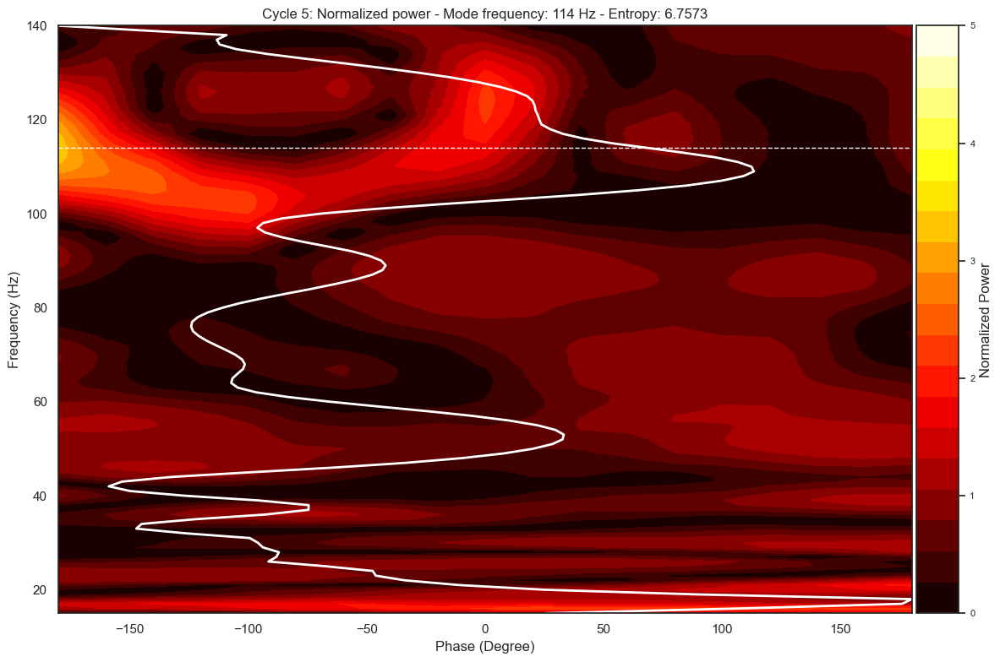

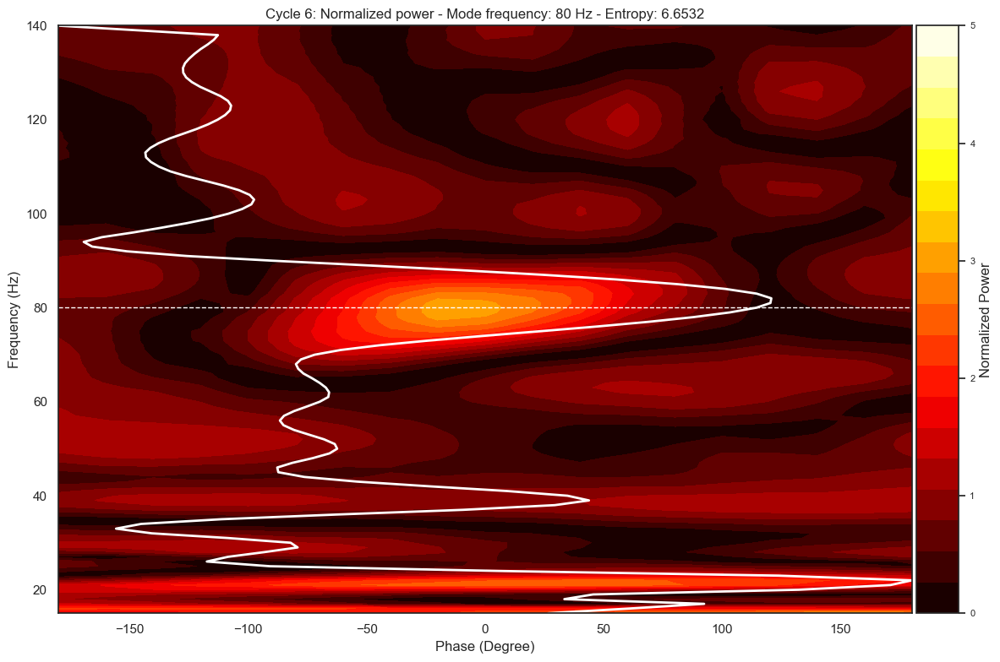

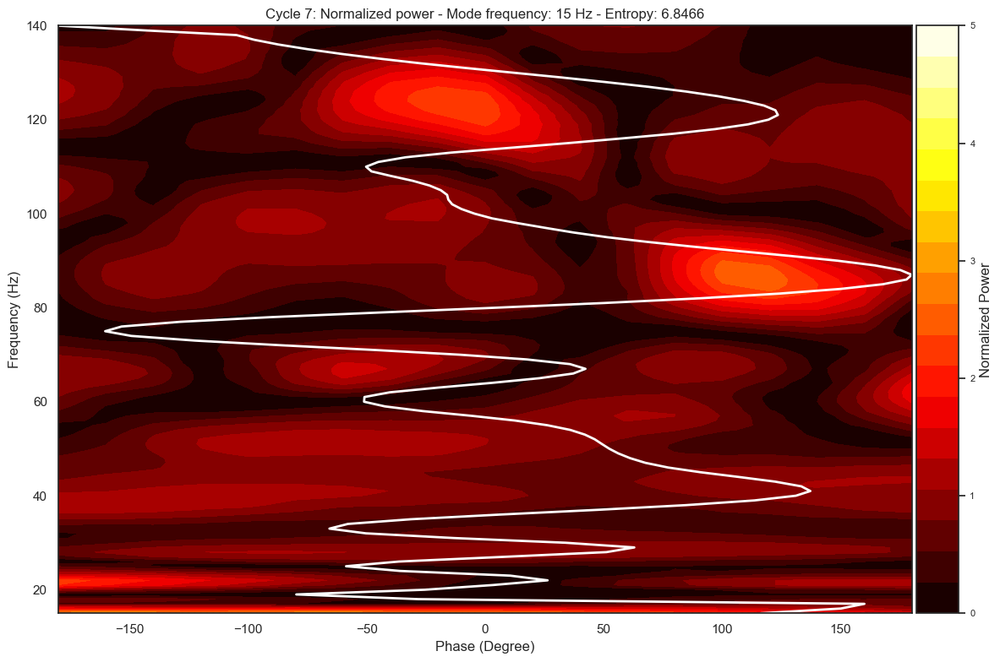

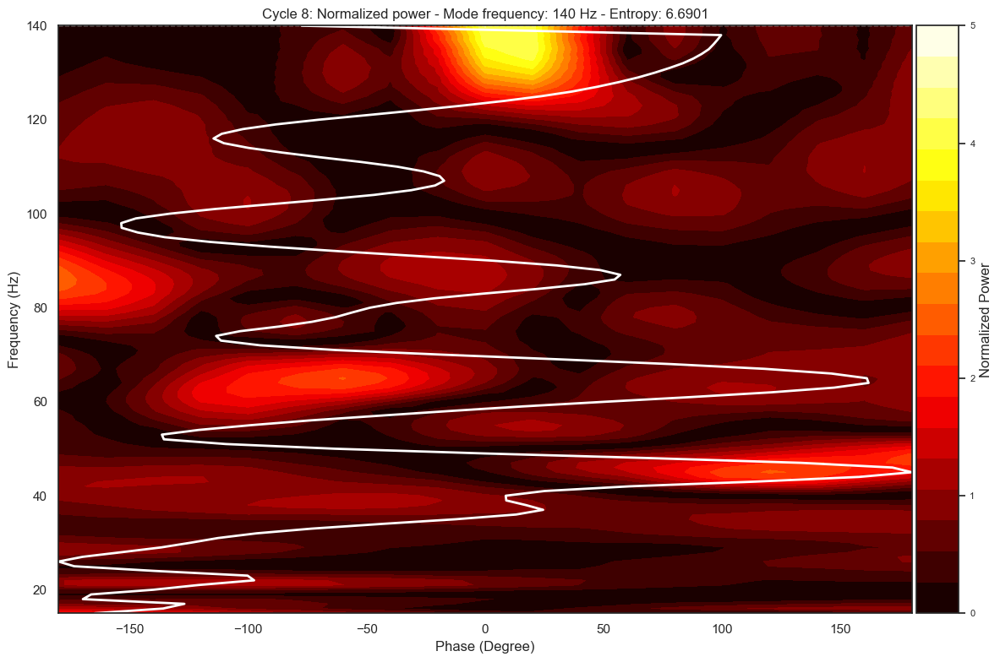

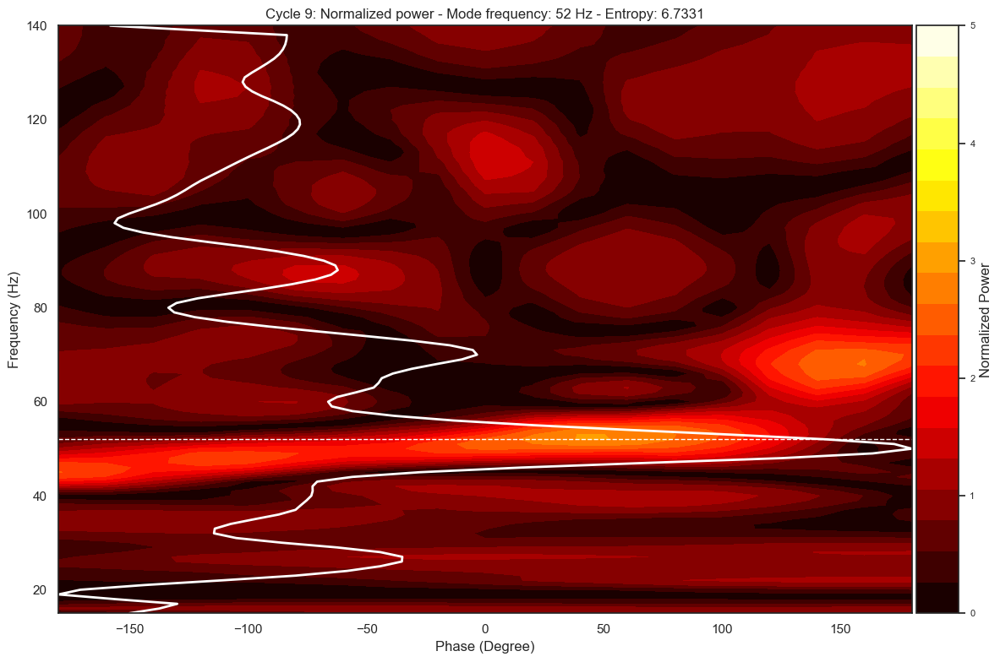

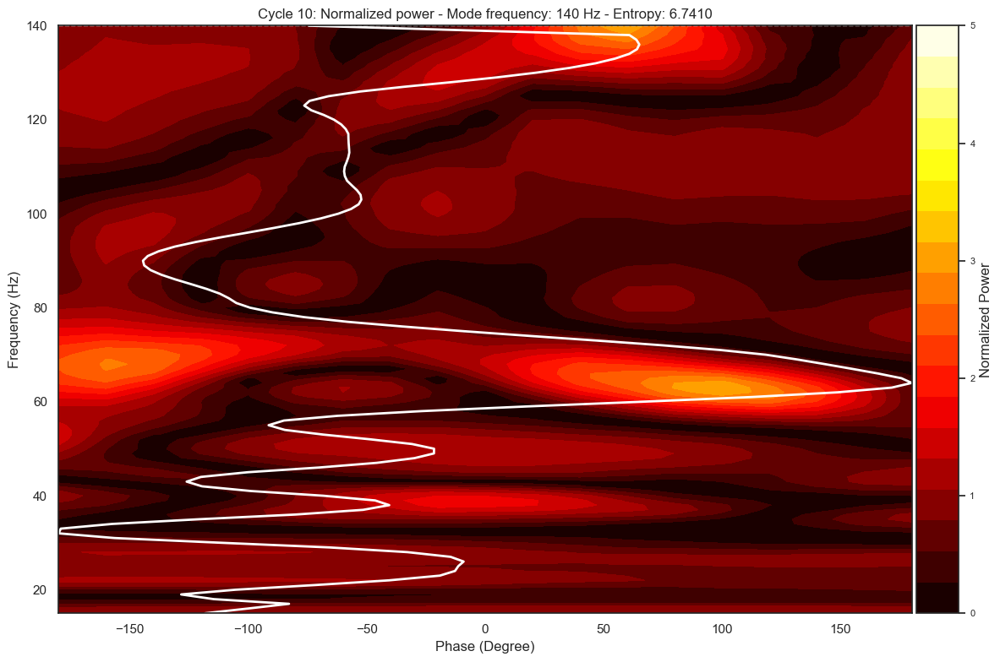

In [19]:
vmin = 0
vmax = 5

for i in range(10):  
    angles = np.linspace(-180, 180, 19)
    fpp2 = FPP[i]  
    fpp2 = np.abs(fpp2)

    normalized_fpp2 = fpp2 / np.sum(fpp2)

    n_levels = 20
    levels = np.linspace(vmin, vmax, n_levels) 

    avg_fpp2 = np.sum(fpp2, axis=1)

    window_size = 5  
    smoothed_avg_fpp = np.convolve(avg_fpp2, np.ones(window_size)/window_size, mode='same')
    dist_smoothed_avg_fpp = smoothed_avg_fpp / np.sum(smoothed_avg_fpp)

    smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / (np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp))

    max_index = np.unravel_index(np.argmax(normalized_fpp2, axis=None), normalized_fpp2.shape)
    mode_frequency = frequencies[max_index[0]]
    mode_angle = angles[max_index[1]]

    shannon_entropy = entropy(smoothed_avg_fpp_norm.flatten(), base=2)

    # Plotting
    fig, ax = plt.subplots(figsize=(12, 8))

    contour = ax.contourf(angles, frequencies, fpp2, levels=levels, cmap='hot', vmin=vmin, vmax=vmax)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)

    cbar = fig.colorbar(contour, cax=cax)

    cbar.set_ticks(np.linspace(vmin, vmax, 6))  

    cbar.set_label('Normalized Power')
    cbar.ax.tick_params(labelsize=8)

    scaled_profile = smoothed_avg_fpp_norm * (angles[-1] - angles[0]) + angles[0]
    ax.plot(scaled_profile, frequencies, color='white', linewidth=2)

    ax.axhline(mode_frequency, color='white', linestyle='--', linewidth=1)

    ax.set_xlabel('Phase (Degree)')
    ax.set_ylabel('Frequency (Hz)')
    ax.set_xlim(angles[0], angles[-1])
    ax.set_ylim(frequencies[0], frequencies[-1])

    ax.set_title(f"Cycle {i+1}: Normalized power - Mode frequency: {int(mode_frequency)} Hz - Entropy: {shannon_entropy:.4f}")

    plt.tight_layout()
    plt.savefig(f"cycle_{i+1}_avg_spectrogram_plot.svg", format='svg')
    plt.show()

In [54]:
avg_FPP = np.mean(FPP, axis=0)

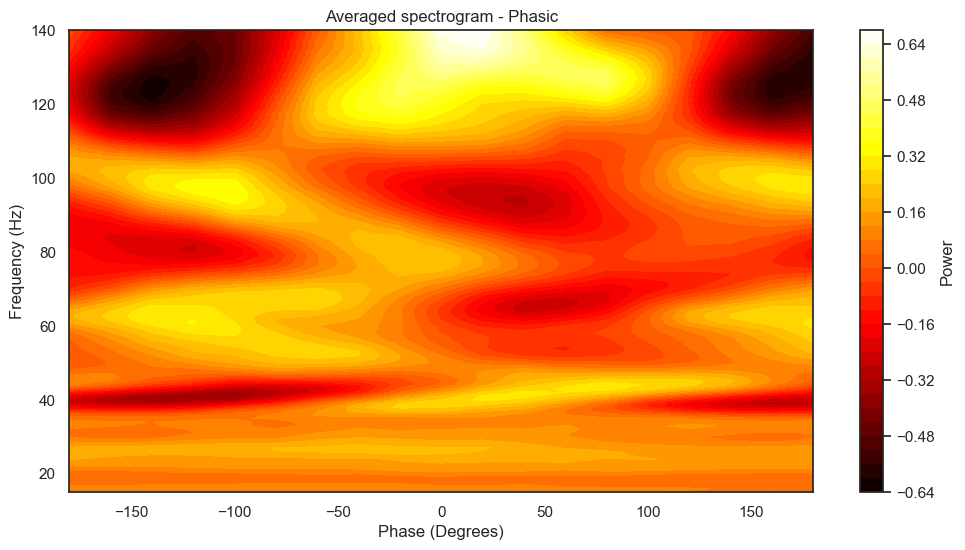

In [ ]:
plt.figure(figsize=(12, 6))

plt.contourf(angles, frequencies, avg_FPP, 40, cmap='hot')

plt.xlabel('Phase (Degrees)')
plt.ylabel('Frequency (Hz)')
plt.title('Averaged spectrogram - Phasic')

plt.colorbar(label='Power')

# Show the plot
plt.savefig("Averaged_spectrogram_Phasic.svg", format='svg')
plt.show()

# ICA/PCA

In [7]:
# def extract_spectural_signiture(FPP):
#   smoothed_avg_fpp_all = []

#   # Process each cycle to extract its normalized smoothed average FPP
#   for fpp in FPP:
#       fpp = np.abs(fpp)
#       fpp_sum = np.sum(fpp)
#       normalized_fpp = fpp / fpp_sum if fpp_sum != 0 else fpp
#       avg_fpp = np.sum(normalized_fpp, axis=1)

#       # Smooth and normalize the avg_fpp
#       window_size = 5  # 5 Hz window
#       smoothed_avg_fpp = np.convolve(avg_fpp, np.ones(window_size)/window_size, mode='same')
#       smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / (np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp))

#       smoothed_avg_fpp_all.append(smoothed_avg_fpp_norm)

#   return smoothed_avg_fpp_all

In [8]:
random_state = 42
frequencies = np.arange(15, 141, 5)

In [19]:
all_phasic_spectural_signitures = []
for ii in range(len(all_phasic_FPPs)):
  FPP = all_phasic_FPPs[ii]
  spectural_phasic_signiture = extract_spectural_signiture(FPP)
  all_phasic_spectural_signitures.append(spectural_phasic_signiture)

In [20]:
all_phasic_sss = []

for ll in all_phasic_spectural_signitures:
  for ss in ll:
    all_phasic_sss.append(ss)

all_phasic_sss = np.array(all_phasic_sss)

In [21]:
all_tonic_spectural_signitures = []
for ii in range(len(all_tonic_FPPs)):
  FPP = all_tonic_FPPs[ii]
  spectural_tonic_signiture = extract_spectural_signiture(FPP)
  all_tonic_spectural_signitures.append(spectural_tonic_signiture)

In [22]:
all_tonic_sss = []

for ll in all_tonic_spectural_signitures:
  for ss in ll:
    all_tonic_sss.append(ss)

all_tonic_sss = np.array(all_tonic_sss)

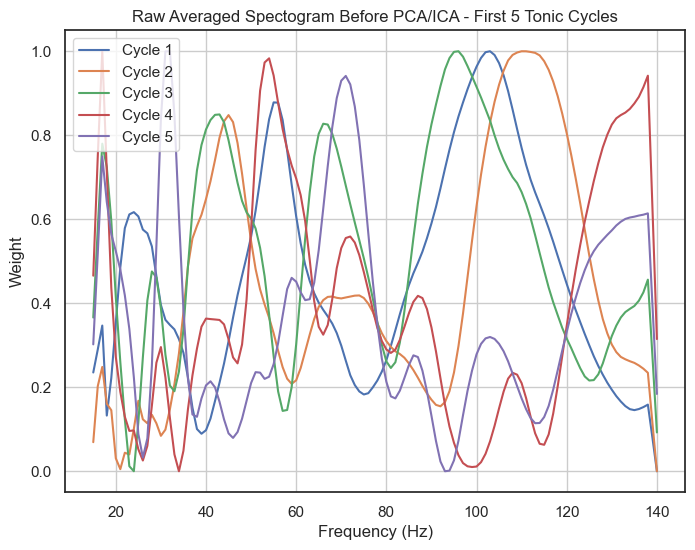

In [23]:
plt.figure(figsize=(8, 6))
for i in range(5): 
    plt.plot(frequencies, all_tonic_sss[i, :], label=f'Cycle {i+1}')
plt.title("Raw Averaged Spectogram Before PCA/ICA - First 5 Tonic Cycles")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Weight")
plt.legend()
plt.grid(True)
plt.savefig('raw_avg_spectogram_before_pca_ica_tonic.svg')
plt.show()


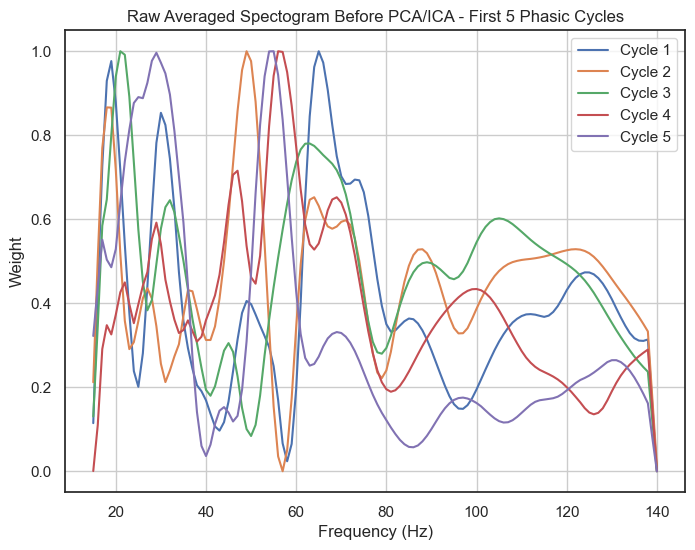

In [64]:
plt.figure(figsize=(8, 6))
for i in range(5):
    plt.plot(frequencies, all_phasic_sss[i, :], label=f'Cycle {i+1}')
plt.title("Raw Averaged Spectogram Before PCA/ICA - First 5 Phasic Cycles")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Weight")
plt.legend()
plt.grid(True)
plt.savefig('raw_avg_spectogram_before_pca_ica_phasic.svg')
plt.show()


Peak frequency of tSC1: 33 Hz
Peak frequency of tSC2: 63 Hz
Peak frequency of tSC3: 71 Hz
Peak frequency of tSC4: 47 Hz
Peak frequency of tSC5: 77 Hz


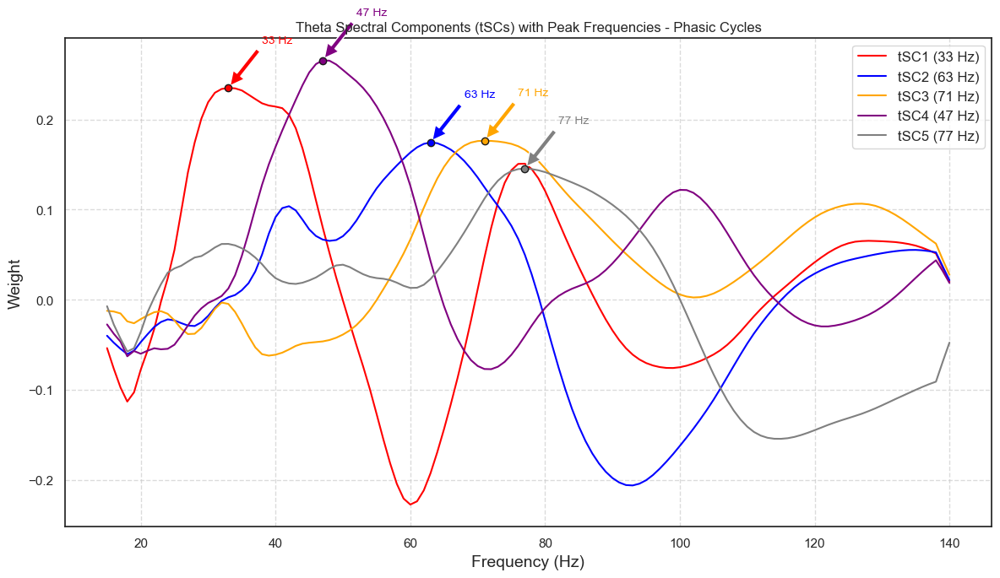

In [65]:
n_components_pca = 5
pca = PCA(n_components=n_components_pca, random_state=0)
pca_result = pca.fit_transform(all_phasic_sss) 

ica = FastICA(n_components=n_components_pca, random_state=0)
tSCs = ica.fit_transform(pca_result)  
ica_components = ica.components_   

tSCs_weights_original = np.dot(ica_components, pca.components_)  

mean_projections = np.dot(tSCs_weights_original, all_phasic_sss.T).mean(axis=1)
for i in range(n_components_pca):
    if mean_projections[i] < 0:
        tSCs_weights_original[i, :] *= -1

peak_frequencies = []
for i in range(n_components_pca):
    idx_peak = np.argmax(tSCs_weights_original[i, :])
    peak_freq = frequencies[idx_peak]
    peak_frequencies.append(peak_freq)
    print(f"Peak frequency of tSC{i+1}: {peak_freq} Hz")

colors = ['red', 'blue', 'orange', 'purple', 'gray']
labels = ['tSC1', 'tSC2', 'tSC3', 'tSC4', 'tSC5']

plt.figure(figsize=(12, 7))

for i in range(n_components_pca):

    plt.plot(frequencies, tSCs_weights_original[i, :], color=colors[i], label=f'{labels[i]} ({peak_frequencies[i]} Hz)')

    plt.scatter(peak_frequencies[i], tSCs_weights_original[i, peak_frequencies[i]-15], color=colors[i], edgecolor='k', zorder=5)

    plt.annotate(f'{peak_frequencies[i]} Hz',
                 xy=(peak_frequencies[i], tSCs_weights_original[i, peak_frequencies[i]-15]),
                 xytext=(peak_frequencies[i]+5, tSCs_weights_original[i, peak_frequencies[i]-15]+0.05),
                 arrowprops=dict(facecolor=colors[i], shrink=0.05),
                 fontsize=10,
                 color=colors[i])

plt.xlabel('Frequency (Hz)', fontsize=14)
plt.ylabel('Weight', fontsize=14)
plt.title('Theta Spectral Components (tSCs) with Peak Frequencies - Phasic Cycles', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('spectral_components_phasic_cycle.svg')
plt.show()



Peak frequency of tSC1: 84 Hz
Peak frequency of tSC2: 78 Hz
Peak frequency of tSC3: 127 Hz
Peak frequency of tSC4: 46 Hz
Peak frequency of tSC5: 64 Hz


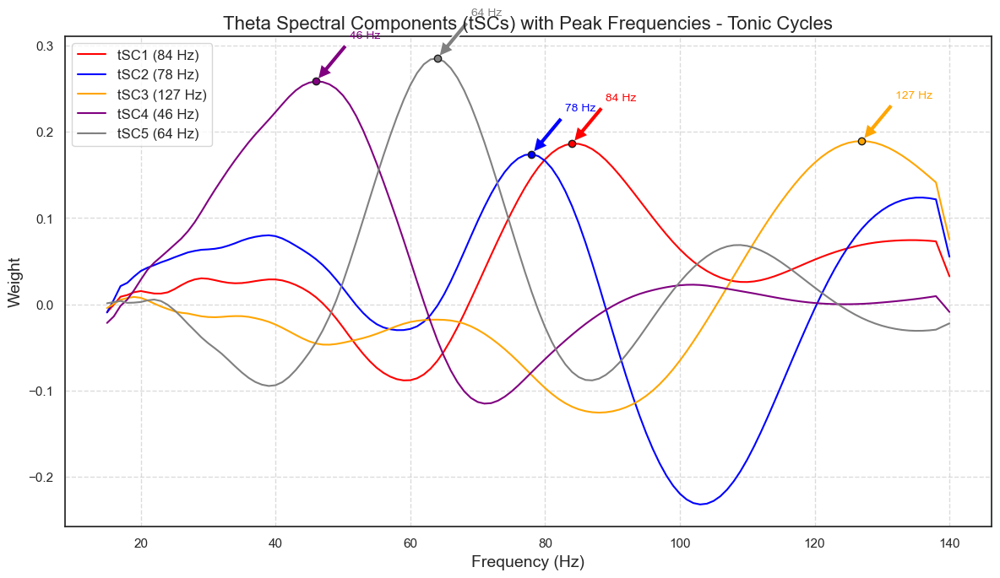

In [66]:
n_components_pca = 5
pca = PCA(n_components=n_components_pca, random_state=0)
pca_result = pca.fit_transform(all_tonic_sss) 

ica = FastICA(n_components=n_components_pca, random_state=0)
tSCs = ica.fit_transform(pca_result) 
ica_components = ica.components_      

tSCs_weights_original = np.dot(ica_components, pca.components_)  

mean_projections = np.dot(tSCs_weights_original, all_phasic_sss.T).mean(axis=1)
for i in range(n_components_pca):
    if mean_projections[i] < 0:
        tSCs_weights_original[i, :] *= -1

peak_frequencies = []
for i in range(n_components_pca):
    idx_peak = np.argmax(tSCs_weights_original[i, :])
    peak_freq = frequencies[idx_peak]
    peak_frequencies.append(peak_freq)
    print(f"Peak frequency of tSC{i+1}: {peak_freq} Hz")

colors = ['red', 'blue', 'orange', 'purple', 'gray']
labels = ['tSC1', 'tSC2', 'tSC3', 'tSC4', 'tSC5']

plt.figure(figsize=(12, 7))

for i in range(n_components_pca):

    plt.plot(frequencies, tSCs_weights_original[i, :], color=colors[i], label=f'{labels[i]} ({peak_frequencies[i]} Hz)')

    plt.scatter(peak_frequencies[i], tSCs_weights_original[i, peak_frequencies[i]-15], color=colors[i], edgecolor='k', zorder=5)

    plt.annotate(f'{peak_frequencies[i]} Hz',
                 xy=(peak_frequencies[i], tSCs_weights_original[i, peak_frequencies[i]-15]),
                 xytext=(peak_frequencies[i]+5, tSCs_weights_original[i, peak_frequencies[i]-15]+0.05),
                 arrowprops=dict(facecolor=colors[i], shrink=0.05),
                 fontsize=10,
                 color=colors[i])

plt.xlabel('Frequency (Hz)', fontsize=14)
plt.ylabel('Weight', fontsize=14)
plt.title('Theta Spectral Components (tSCs) with Peak Frequencies - Tonic Cycles', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('spectral_components_tonic_cycle.svg')
plt.show()

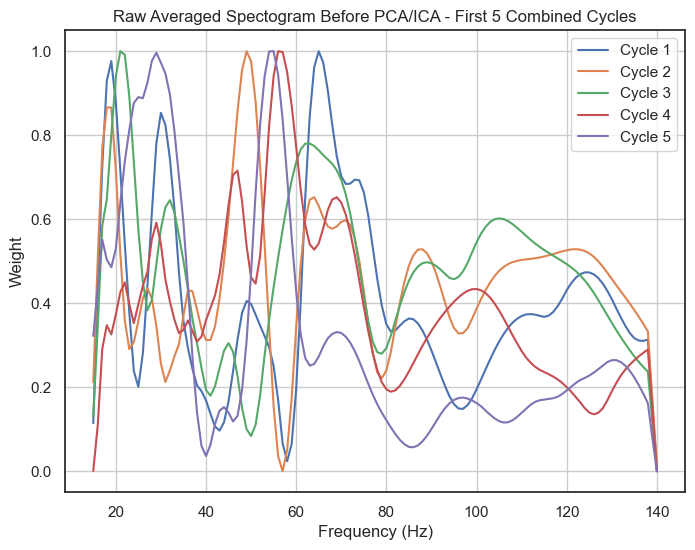

In [ ]:
# Concatenate phasic and tonic FPPs
all_FPPs_combined = all_phasic_FPPs + all_tonic_FPPs

# Extract spectral signatures for the combined FPPs
all_combined_spectral_signatures = []
for FPP in all_FPPs_combined:
    combined_spectral_signature = extract_spectural_signiture(FPP)
    all_combined_spectral_signatures.append(combined_spectral_signature)

# Flatten the spectral signatures
all_combined_sss = []
for ll in all_combined_spectral_signatures:
    for ss in ll:
        all_combined_sss.append(ss)

all_combined_sss = np.array(all_combined_sss)

# Plot the combined spectral signatures for the first 5 cycles
plt.figure(figsize=(8, 6))
for i in range(5): 
    plt.plot(frequencies, all_combined_sss[i, :], label=f'Cycle {i+1}')
plt.title("Raw Averaged Spectogram Before PCA/ICA - First 5 Combined Cycles")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Weight")
plt.legend()
plt.grid(True)
plt.savefig('raw_avg_spectogram_before_pca_ica_combined.svg')
plt.show()

Peak frequency of tSC1: 45 Hz
Peak frequency of tSC2: 129 Hz
Peak frequency of tSC3: 79 Hz
Peak frequency of tSC4: 64 Hz
Peak frequency of tSC5: 86 Hz


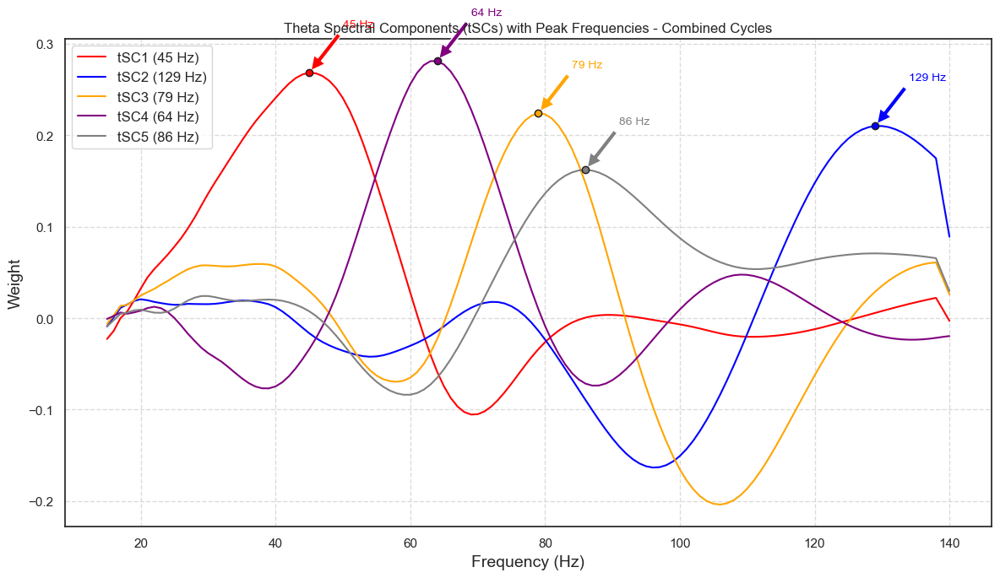

In [29]:
n_components_pca = 5
pca = PCA(n_components=n_components_pca, random_state=42)
pca_result = pca.fit_transform(all_combined_sss) 

ica = FastICA(n_components=n_components_pca, random_state=42)
tSCs = ica.fit_transform(pca_result)  
ica_components = ica.components_   

tSCs_weights_original = np.dot(ica_components, pca.components_)  

mean_projections = np.dot(tSCs_weights_original, all_combined_sss.T).mean(axis=1)
for i in range(n_components_pca):
    if mean_projections[i] < 0:
        tSCs_weights_original[i, :] *= -1

peak_frequencies = []
for i in range(n_components_pca):
    idx_peak = np.argmax(tSCs_weights_original[i, :])
    peak_freq = frequencies[idx_peak]
    peak_frequencies.append(peak_freq)
    print(f"Peak frequency of tSC{i+1}: {peak_freq} Hz")

colors = ['red', 'blue', 'orange', 'purple', 'gray']
labels = ['tSC1', 'tSC2', 'tSC3', 'tSC4', 'tSC5']

plt.figure(figsize=(12, 7))

for i in range(n_components_pca):

    plt.plot(frequencies, tSCs_weights_original[i, :], color=colors[i], label=f'{labels[i]} ({peak_frequencies[i]} Hz)')

    plt.scatter(peak_frequencies[i], tSCs_weights_original[i, peak_frequencies[i]-15], color=colors[i], edgecolor='k', zorder=5)

    plt.annotate(f'{peak_frequencies[i]} Hz',
                 xy=(peak_frequencies[i], tSCs_weights_original[i, peak_frequencies[i]-15]),
                 xytext=(peak_frequencies[i]+5, tSCs_weights_original[i, peak_frequencies[i]-15]+0.05),
                 arrowprops=dict(facecolor=colors[i], shrink=0.05),
                 fontsize=10,
                 color=colors[i])

plt.xlabel('Frequency (Hz)', fontsize=14)
plt.ylabel('Weight', fontsize=14)
plt.title('Theta Spectral Components (tSCs) with Peak Frequencies - Combined Cycles', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('spectral_components_phasic_cycle.svg')
plt.show()

# utils

In [11]:
# version 1

def prepare_data_for_sa(imfs, imf_frequencies):

  all_FPPs = []

  theta_range = [5, 12]
  frequencies = np.arange(15, 141, 1)
  angles=np.linspace(-180,180,19)
  fs = 2500

  for idx, imf in enumerate(imfs):
    cycle_data = get_cycle_data(imf[:, 5], fs=2500)

    amp_thresh = np.percentile(cycle_data['IA'], 25) # higher than 25th percentile of the data
    lo_freq_duration = fs/5  # restrict the analysis to 5-12 Hz
    hi_freq_duration = fs/12

    conditions = ['is_good==1',
                        f'duration_samples<{lo_freq_duration}',
                        f'duration_samples>{hi_freq_duration}',
                        f'max_amp>{amp_thresh}']
    print(len(cycle_data['theta_imf']))
    all_cycles = get_cycles_with_conditions(cycle_data['cycles'], conditions)
    if all_cycles is None or all_cycles.chain_vect.size == 0:
        print(f"No valid cycles found for the current interval. Skipping...")
        continue
    
    # Check if any cycles satisfy the conditions - HERE CAN BE CHANGED
    if all_cycles is None or all_cycles.chain_vect.size == 0:
        print("No cycles satisfy the conditions.")
        return pd.DataFrame(), pd.DataFrame(), []
    
    subset_cycles_df = all_cycles.get_metric_dataframe(subset=True)
    subset_indices = subset_cycles_df['index'].values

    all_cycles_inds = get_cycle_inds(all_cycles, subset_indices)
    cycles_inds = arrange_cycle_inds(all_cycles_inds)

    freqs = imf_frequencies[idx]
    _, _, supra_theta = tg_split(freqs, theta_range)
    supra_theta_sig = np.sum(imf.T[supra_theta], axis=0)

    # # Corrected Wavelet Transform Computation
    raw_data=sails.wavelet.morlet(supra_theta_sig, freqs=frequencies, sample_rate=fs, ncycles=5,ret_mode='power', normalise=None)
    supraPlot = scipy.stats.zscore(raw_data, axis=1)
    FPP = bin_tf_to_fpp(cycles_inds, supraPlot, bin_count=19)
    all_FPPs.append(FPP)

  return all_FPPs

In [11]:
# import os
# import numpy as np
# import pandas as pd

# def extract_spectral_signature(FPP):
#     smoothed_avg_fpp_all = []

#     # Process each cycle to extract its normalized smoothed average FPP
#     for fpp in FPP:
#         fpp = np.abs(fpp)
#         fpp_sum = np.sum(fpp)
#         normalized_fpp = fpp / fpp_sum if fpp_sum != 0 else fpp
#         avg_fpp = np.sum(normalized_fpp, axis=1)

#         # Smooth and normalize the avg_fpp
#         window_size = 5  # 5 Hz window
#         smoothed_avg_fpp = np.convolve(avg_fpp, np.ones(window_size)/window_size, mode='same')
#         smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / (np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp))

#         smoothed_avg_fpp_all.append(smoothed_avg_fpp_norm)

#     return smoothed_avg_fpp_all

# def extract_spectral_signatures_for_rat(rat_id):
#     import os
#     import numpy as np

#     # Define the base path to OS Basic datasets
#     base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
#     treatments = ['CN', 'HC', 'OD', 'OR']
#     fs = 2500  # Sample frequency

#     # Initialize lists to collect all FPPs
#     all_phasic_FPPs = []
#     all_tonic_FPPs = []

#     rat_path = os.path.join(base_path, str(rat_id))

#     # Check if the specified rat folder exists
#     if not os.path.isdir(rat_path):
#         print(f"Rat folder {rat_id} does not exist.")
#         return None, None, None

#     # Loop over each treatment for the specified rat
#     counts = 0
#     for treatment in treatments:
#         treatment_path = os.path.join(rat_path, treatment)

#         # Check if the treatment folder exists
#         if not os.path.isdir(treatment_path):
#             print(f"Treatment folder '{treatment}' for Rat {rat_id} does not exist. Skipping...")
#             continue

#         # Detect all trial folders in the treatment directory and filter for Post_Trial2 to Post_Trial5
#         trial_folders = [
#             f for f in os.listdir(treatment_path)
#             if os.path.isdir(os.path.join(treatment_path, f)) and
#             any(f"Post_Trial{num}" in f for num in range(2, 6))
#         ]

#         for trial_folder in trial_folders:
#             trial_path = os.path.join(treatment_path, trial_folder)

#             # Search for LFP and state files in the trial folder
#             lfp_file = None
#             state_file = None

#             for file_name in os.listdir(trial_path):
#                 if 'HPC' in file_name and file_name.endswith('.mat'):
#                     lfp_file = os.path.join(trial_path, file_name)
#                 elif 'states' in file_name and file_name.endswith('.mat'):
#                     state_file = os.path.join(trial_path, file_name)

#             # Ensure both LFP and state files were found
#             if not lfp_file or not state_file:
#                 print(f"Missing LFP or state file in {trial_path}. Skipping...")
#                 continue

#             # Extract trial number from folder name (assuming format "Post_TrialX")
#             trial_number = int(trial_folder.split('Trial')[-1])

#             # Load data using your custom functions
#             try:
#                 lfpHPC, hypno, _ = get_data(lfp_file, state_file)

#                 # Extract phasic and tonic intervals, handling cases with no REM sleep
#                 try:
#                     phasic_interval, tonic_interval, lfp_processed = extract_pt_intervals(lfpHPC, hypno, fs)
                    
#                 except ValueError as e:
#                     print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Treatment {treatment}. Filling with empty intervals.")
#                     phasic_interval, tonic_interval, lfp_processed = [[], [], []]

#                 # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
#                 if phasic_interval and tonic_interval:
#                     # Ensure 'config' is defined
#                     tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
#                         lfp_processed, fs, tonic_interval, config, return_imfs_freqs=True)
#                     phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
#                         lfp_processed, fs, phasic_interval, config, return_imfs_freqs=True)

#                     # Prepare FPP data for both phasic and tonic
#                     phasic_fpps = prepare_data_for_sa(
#                         phasic_imfs, phasic_freqs)
#                     tonic_fpps = prepare_data_for_sa(
#                         tonic_imfs, tonic_freqs)

#                     # Collect FPPs
#                     if phasic_fpps is not None:
#                         all_phasic_FPPs.extend(phasic_fpps)
#                     if tonic_fpps is not None:
#                         all_tonic_FPPs.extend(tonic_fpps)
#                 else:
#                     print(f"No phasic or tonic intervals found in {trial_folder}. Skipping...")

#             except FileNotFoundError:
#                 print(f"Data not found in {trial_path}. Skipping...")

#     # Now extract spectral signatures

#     return all_phasic_FPPs, all_tonic_FPPs


In [15]:
def extract_and_flatten_signatures(fpps):
    """Extracts and flattens spectral signatures from a list of FPPs."""
    spectral_signatures = [extract_spectural_signiture(fpp) for fpp in fpps]
    # Flatten the nested list of spectral signatures
    flattened_signatures = np.array([ss for sublist in spectral_signatures for ss in sublist])
    return flattened_signatures

In [16]:
from sklearn.decomposition import PCA, FastICA

def process_and_plot_spectral_components(data, n_components, frequencies, title_suffix, save_path):
    """Processes the spectral data and plots the theta spectral components with peak frequencies."""
    
    # Step 1: PCA
    pca = PCA(n_components=n_components, random_state=42)
    pca_result = pca.fit_transform(data)
    
    # Step 2: ICA
    ica = FastICA(n_components=n_components, random_state=42)
    tSCs = ica.fit_transform(pca_result)
    ica_components = ica.components_
    
    # Step 3: Calculate original weights
    tSCs_weights_original = np.dot(ica_components, pca.components_)
    
    # Step 4: Adjust sign of components
    mean_projections = np.dot(tSCs_weights_original, data.T).mean(axis=1)
    for i in range(n_components):
        if mean_projections[i] < 0:
            tSCs_weights_original[i, :] *= -1
    
    # Step 5: Determine peak frequencies
    peak_frequencies = []
    for i in range(n_components):
        idx_peak = np.argmax(tSCs_weights_original[i, :])
        peak_freq = frequencies[idx_peak]
        peak_frequencies.append(peak_freq)
        print(f"Peak frequency of tSC{i+1}: {peak_freq} Hz")
    
    # Step 6: Plotting
    colors = ['red', 'blue', 'orange', 'purple', 'gray']
    labels = [f'tSC{i+1}' for i in range(n_components)]
    plt.figure(figsize=(12, 7))
    
    for i in range(n_components):
        plt.plot(frequencies, tSCs_weights_original[i, :], color=colors[i], label=f'{labels[i]} ({peak_frequencies[i]} Hz)')
        plt.scatter(peak_frequencies[i], tSCs_weights_original[i, frequencies == peak_frequencies[i]], color=colors[i], edgecolor='k', zorder=5)
        plt.annotate(f'{peak_frequencies[i]} Hz',
                     xy=(peak_frequencies[i], tSCs_weights_original[i, frequencies == peak_frequencies[i]]),
                     xytext=(peak_frequencies[i]+5, tSCs_weights_original[i, frequencies == peak_frequencies[i]]+0.05),
                     arrowprops=dict(facecolor=colors[i], shrink=0.05),
                     fontsize=10,
                     color=colors[i])
    
    plt.xlabel('Frequency (Hz)', fontsize=14)
    plt.ylabel('Weight', fontsize=14)
    plt.title(f'Theta Spectral Components (tSCs) with Peak Frequencies - {title_suffix}', fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

In [13]:
# Run the pipeline for each dataset (phasic, tonic, combined)
n_components_pca = 5
frequencies = np.arange(15, 141, 1)  # Replace this with the actual frequency array


In [ ]:
# import os
# import pandas as pd

# def extract_data_for_rat(rat_id):
#     # Define the base path to OS Basic datasets
#     base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
#     fs = 2500  # Sample frequency

#     # Initialize empty DataFrames for concatenation across all recordings and trials for the specified rat
#     all_phasic_FPPs = []
#     all_tonic_FPPs = []

#     rat_path = os.path.join(base_path, str(rat_id))

#     # Check if the specified rat folder exists
#     if not os.path.isdir(rat_path):
#         print(f"Rat folder {rat_id} does not exist.")
#         return None, None

#     # List all recording folders in the rat directory
#     recording_folders = [
#         f for f in os.listdir(rat_path)
#         if os.path.isdir(os.path.join(rat_path, f))
#     ]

#     # Loop over each recording folder
#     for recording_folder in recording_folders:
#         recording_path = os.path.join(rat_path, recording_folder)

#         # Parse the recording folder name to extract metadata
#         parts = recording_folder.split('_')
#         if len(parts) < 5:
#             print(f"Unexpected folder name format: {recording_folder}. Skipping...")
#             continue

#         rat_id_part = parts[1]       # e.g., 'Rat1'
#         sd_part = parts[2]           # e.g., 'SD3'
#         condition_part = parts[3]    # e.g., 'HC'
#         date_part = parts[4]         # e.g., '27-09-2017'

#         rat_id_from_folder = rat_id_part.replace('Rat', '')
#         sd_number = sd_part.replace('SD', '')
#         condition = condition_part

#         # Check if rat_id_from_folder matches rat_id
#         if rat_id_from_folder != str(rat_id):
#             print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
#             continue

#         # Detect all trial folders and filter for post_trial2 to post_trial5
#         trial_folders = [
#             f for f in os.listdir(recording_path)
#             if os.path.isdir(os.path.join(recording_path, f)) and
#             any(f.startswith(f'post_trial{num}') for num in range(2, 6))
#         ]

#         for trial_folder in trial_folders:
#             trial_path = os.path.join(recording_path, trial_folder)

#             # Search for LFP and state files in the trial folder
#             lfp_file = None
#             state_file = None

#             for file_name in os.listdir(trial_path):
#                 if 'HPC' in file_name and file_name.endswith('.mat'):
#                     lfp_file = os.path.join(trial_path, file_name)
#                 elif 'states' in file_name and file_name.endswith('.mat'):
#                     state_file = os.path.join(trial_path, file_name)

#             # Ensure both LFP and state files were found
#             if not lfp_file or not state_file:
#                 print(f"Missing LFP or state file in {trial_path}. Skipping...")
#                 continue

#             # Extract trial number from folder name (assuming format "post_trialX")
#             trial_number = int(trial_folder.split('trial')[-1].split('_')[0])

#             # Load data using custom functions
#             try:
#                 lfpHPC, hypno, _ = get_data(lfp_file, state_file)

#                 # Extract phasic and tonic intervals, handling cases with no REM sleep
#                 try:
#                     phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
#                 except ValueError as e:
#                     print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
#                     phasic_interval, tonic_interval, lfp = [[], [], []]

#                 # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
#                 if phasic_interval and tonic_interval:
#                     tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(lfp, fs, tonic_interval, config, return_imfs_freqs=True)
#                     phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(lfp, fs, phasic_interval, config, return_imfs_freqs=True)

#                     # Prepare UMAP data for both phasic and tonic
#                     phasic_FPPs = prepare_data_for_sa(phasic_imfs, phasic_freqs)
#                     tonic_FPPs = prepare_data_for_sa(tonic_imfs, tonic_freqs)

#                     # Concatenate into combined DataFrames
#                     all_phasic_FPPs.extend(phasic_FPPs)
#                     all_tonic_FPPs.extend(tonic_FPPs)

#             except FileNotFoundError:
#                 print(f"Data not found in {trial_path}. Skipping...")

#     return all_phasic_FPPs, all_tonic_FPPs

In [9]:
def extract_data_for_rat(rat_id):
    # Define the base path to OS Basic datasets
    base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
    fs = 2500  # Sample frequency

    # Initialize empty DataFrames for concatenation across all recordings and trials for the specified rat
    all_phasic_FPPs = []
    all_tonic_FPPs = []

    rat_path = os.path.join(base_path, str(rat_id))

    # Check if the specified rat folder exists
    if not os.path.isdir(rat_path):
        print(f"Rat folder {rat_id} does not exist.")
        return None, None

    # List all recording folders in the rat directory
    recording_folders = [
        f for f in os.listdir(rat_path)
        if os.path.isdir(os.path.join(rat_path, f))
    ]

    if not recording_folders:
        print(f"No recording folders found for Rat {rat_id}.")
        return None, None

    # Loop over each recording folder
    for recording_folder in recording_folders:
        print(f"Processing recording folder: {recording_folder}")
        recording_path = os.path.join(rat_path, recording_folder)

        # Use regular expressions to parse the folder name
        match = re.match(r'^Rat-OS-Ephys_(Rat\d+)_SD(\d+)_([\w-]+)_([\d-]+)$', recording_folder)
        if not match:
            print(f"Unexpected folder name format: {recording_folder}. Skipping...")
            continue

        rat_id_part = match.group(1)       # e.g., 'Rat6'
        sd_number = match.group(2)         # e.g., '4'
        condition = match.group(3)         # e.g., 'CON'
        date_part = match.group(4)         # e.g., '22-02-2018'

        rat_id_from_folder = ''.join(filter(str.isdigit, rat_id_part))

        # Check if rat_id_from_folder matches rat_id
        if rat_id_from_folder != str(rat_id):
            print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
            continue

        # Detect all trial folders and filter for post_trial2 to post_trial5, considering various folder name formats
        trial_folders = [
            f for f in os.listdir(recording_path)
            if os.path.isdir(os.path.join(recording_path, f)) and
            re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', f)
        ]

        if not trial_folders:
            print(f"No trial folders found in {recording_folder}.")
            continue

        for trial_folder in trial_folders:
            print(f"Processing trial folder: {trial_folder}")
            trial_path = os.path.join(recording_path, trial_folder)

            # Search for LFP and state files in the trial folder
            lfp_file = None
            state_file = None

            for file_name in os.listdir(trial_path):
                if 'HPC' in file_name and file_name.endswith('.mat'):
                    lfp_file = os.path.join(trial_path, file_name)
                elif 'states' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)
                elif 'States' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)

            # Ensure both LFP and state files were found
            if not lfp_file or not state_file:
                print(f"Missing LFP or state file in {trial_path}. Skipping...")
                continue

            # Extract trial number from folder name
            trial_number_match = re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', trial_folder)
            if trial_number_match:
                trial_number = int(trial_number_match.group(1))
            else:
                print(f"Unable to extract trial number from folder name: {trial_folder}. Skipping...")
                continue

            # Load data using custom functions
            try:
                lfpHPC, hypno, _ = get_data(lfp_file, state_file)

                # Extract phasic and tonic intervals, handling cases with no REM sleep
                try:
                    phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
                except ValueError as e:
                    print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
                    phasic_interval, tonic_interval, lfp = [[], [], []]

                # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
                if phasic_interval and tonic_interval:
                    # Assume 'config' is defined elsewhere in your code
                    tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, tonic_interval, config, return_imfs_freqs=True)
                    phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, phasic_interval, config, return_imfs_freqs=True)

                    # Prepare UMAP data for both phasic and tonic
                    phasic_FPPs = prepare_data_for_sa(phasic_imfs, phasic_freqs)
                    tonic_FPPs = prepare_data_for_sa(tonic_imfs, tonic_freqs)

                    # Concatenate into combined DataFrames
                    all_phasic_FPPs.extend(phasic_FPPs)
                    all_tonic_FPPs.extend(tonic_FPPs)

            except FileNotFoundError:
                print(f"Data not found in {trial_path}. Skipping...")

    return all_phasic_FPPs, all_tonic_FPPs

In [79]:
rat_id = '13'  # Replace with your actual rat ID
all_phasic_FPPs, all_tonic_FPPs = extract_data_for_rat(rat_id, config=config)

Processing recording folder: Rat-OS-Ephys_Rat13_SD2_HC_15-05-2019
Processing trial folder: 2019-05-15_14-08-14_post_trial5
There was 0 in the dataset
Number of detected Tonic intrevals:16
Number of detected Tonic intrevals after threshold:16
 Checking Cycles inputs - trimming singleton from input 'IP'
3969
 Checking Cycles inputs - trimming singleton from input 'IP'
8456
 Checking Cycles inputs - trimming singleton from input 'IP'
7830
 Checking Cycles inputs - trimming singleton from input 'IP'
3365
 Checking Cycles inputs - trimming singleton from input 'IP'
7655
 Checking Cycles inputs - trimming singleton from input 'IP'
3040
 Checking Cycles inputs - trimming singleton from input 'IP'
4590
 Checking Cycles inputs - trimming singleton from input 'IP'
3045
 Checking Cycles inputs - trimming singleton from input 'IP'
3186
 Checking Cycles inputs - trimming singleton from input 'IP'
222500
 Checking Cycles inputs - trimming singleton from input 'IP'
23935
 Checking Cycles inputs - tri

In [84]:
# Process phasic and tonic FPPs separately
all_phasic_sss = extract_and_flatten_signatures(all_phasic_FPPs)
all_tonic_sss = extract_and_flatten_signatures(all_tonic_FPPs)

# Concatenate phasic and tonic FPPs for combined processing
all_FPPs_combined = all_phasic_FPPs + all_tonic_FPPs
all_combined_sss = extract_and_flatten_signatures(all_FPPs_combined)

Peak frequency of tSC1: 130 Hz
Peak frequency of tSC2: 57 Hz
Peak frequency of tSC3: 41 Hz
Peak frequency of tSC4: 106 Hz
Peak frequency of tSC5: 79 Hz


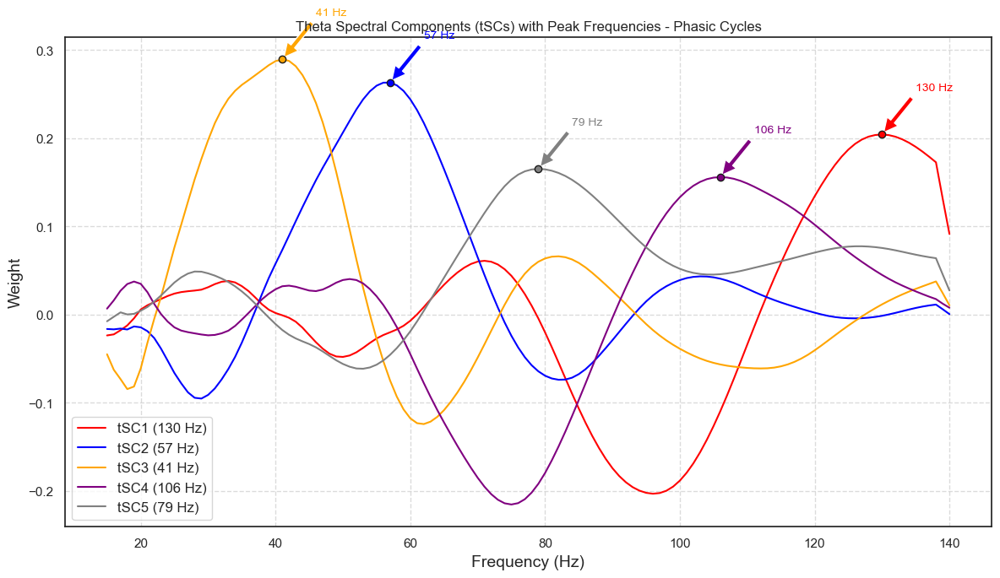

In [85]:
# Phasic data
process_and_plot_spectral_components(all_phasic_sss, n_components_pca, frequencies, "Phasic Cycles", f"spectral_components_phasic_cycle_rat{rat_id}.svg")

Peak frequency of tSC1: 75 Hz
Peak frequency of tSC2: 58 Hz
Peak frequency of tSC3: 94 Hz
Peak frequency of tSC4: 41 Hz
Peak frequency of tSC5: 83 Hz


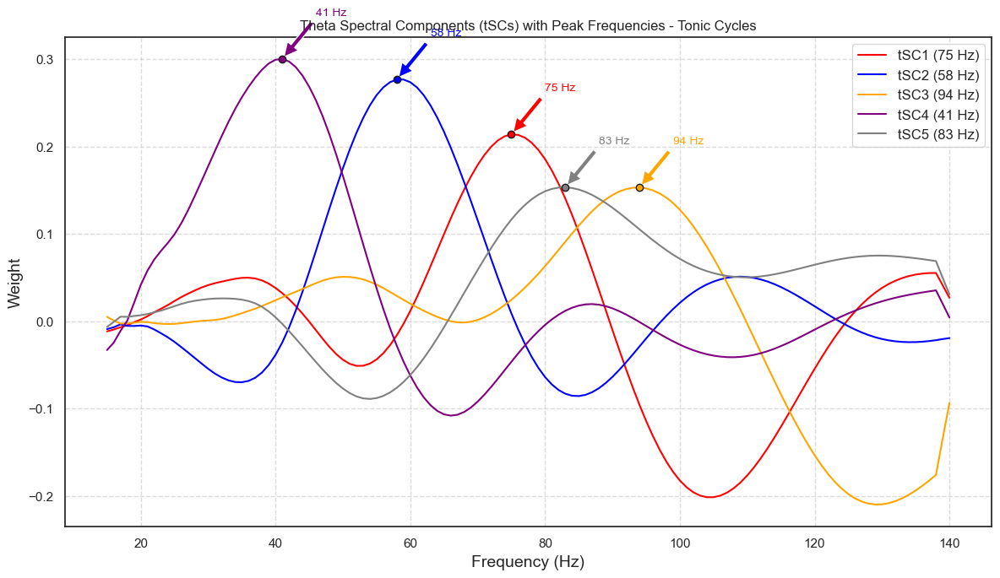

In [86]:
# Tonic data
process_and_plot_spectral_components(all_tonic_sss, n_components_pca, frequencies, "Tonic Cycles", f"spectral_components_tonic_cycle_rat{rat_id}.svg")

Peak frequency of tSC1: 75 Hz
Peak frequency of tSC2: 58 Hz
Peak frequency of tSC3: 94 Hz
Peak frequency of tSC4: 41 Hz
Peak frequency of tSC5: 83 Hz


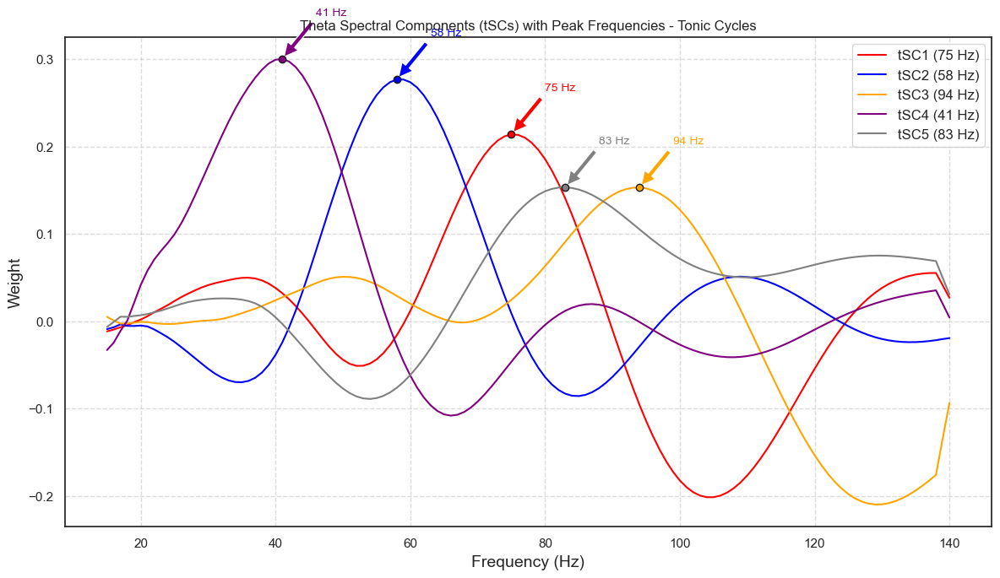

In [87]:
# Tonic data
process_and_plot_spectral_components(all_tonic_sss, n_components_pca, frequencies, "Tonic Cycles", f"spectral_components_tonic_cycle_rat{rat_id}.svg")

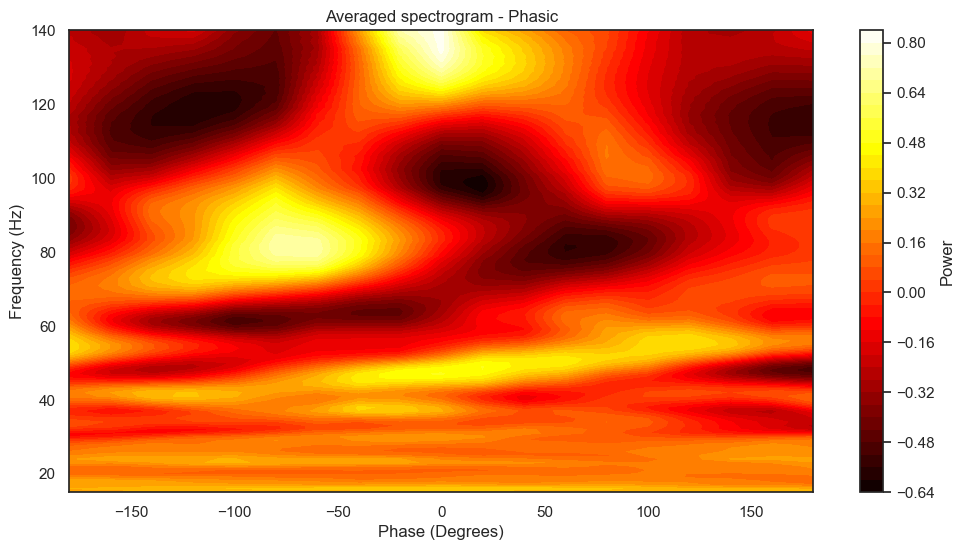

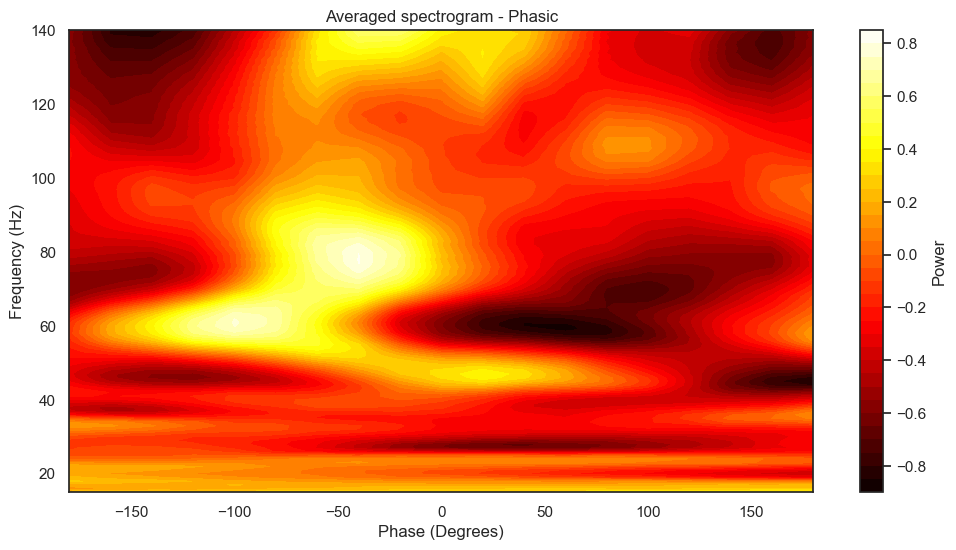

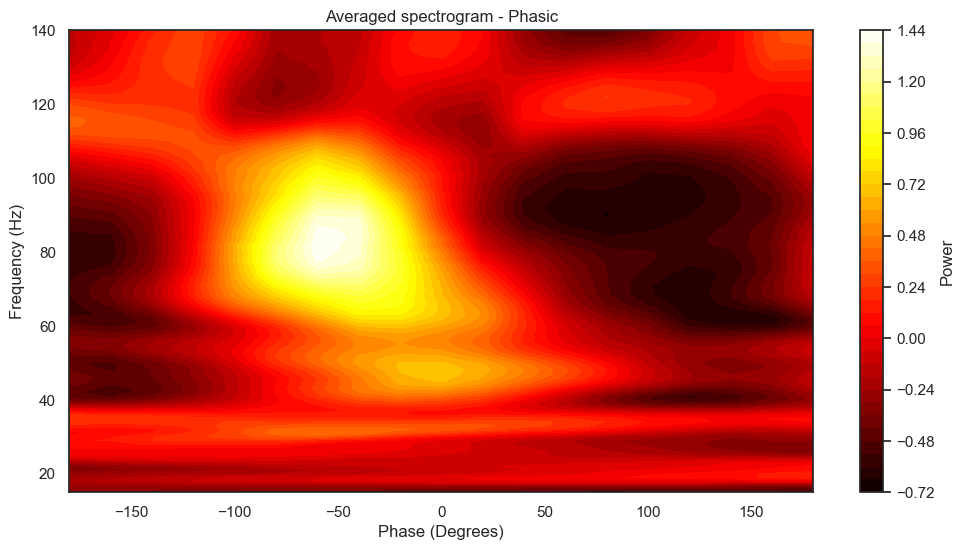

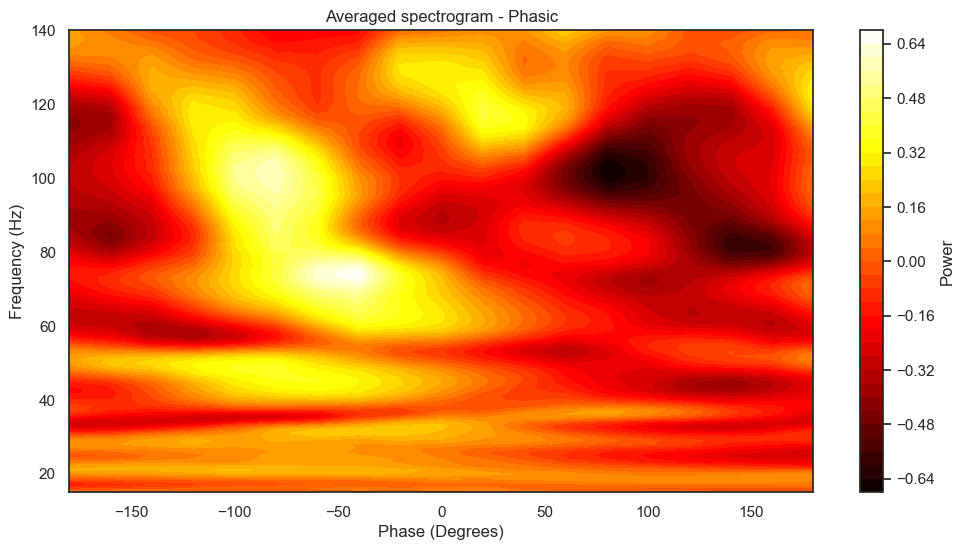

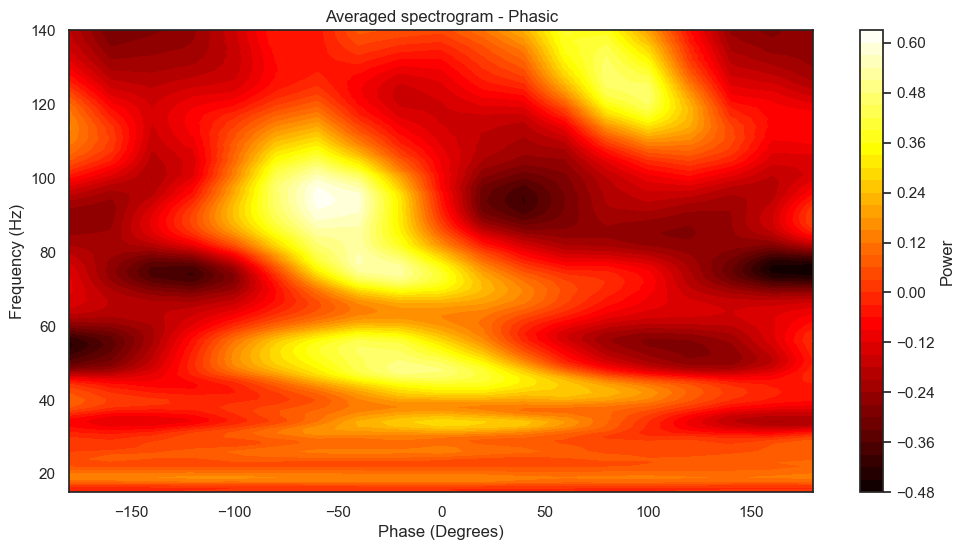

In [59]:
for ii in range(5):
    avg_FPP = np.mean(all_phasic_FPPs[ii], axis=0)
    angles=np.linspace(-180,180,19)
    plt.figure(figsize=(12, 6))

    plt.contourf(angles, frequencies, avg_FPP, 40, cmap='hot')

    plt.xlabel('Phase (Degrees)')
    plt.ylabel('Frequency (Hz)')
    plt.title('Averaged spectrogram - Phasic')

    plt.colorbar(label='Power')

    # Show the plot
    plt.savefig("Averaged_spectrogram_Phasic.svg", format='svg')
    plt.show()

Number of valid entries: 119
Shape of valid entry 0: (548, 126, 19)
Shape of valid entry 1: (63, 126, 19)
Shape of valid entry 2: (318, 126, 19)
Shape of valid entry 3: (22, 126, 19)
Shape of valid entry 4: (435, 126, 19)
Shape of valid entry 5: (139, 126, 19)
Shape of valid entry 6: (554, 126, 19)
Shape of valid entry 7: (21, 126, 19)
Shape of valid entry 8: (162, 126, 19)
Shape of valid entry 9: (42, 126, 19)
Shape of valid entry 10: (86, 126, 19)
Shape of valid entry 11: (112, 126, 19)
Shape of valid entry 12: (48, 126, 19)
Shape of valid entry 13: (220, 126, 19)
Shape of valid entry 14: (131, 126, 19)
Shape of valid entry 15: (239, 126, 19)
Shape of valid entry 16: (316, 126, 19)
Shape of valid entry 17: (131, 126, 19)
Shape of valid entry 18: (42, 126, 19)
Shape of valid entry 19: (356, 126, 19)
Shape of valid entry 20: (245, 126, 19)
Shape of valid entry 21: (178, 126, 19)
Shape of valid entry 22: (273, 126, 19)
Shape of valid entry 23: (15, 126, 19)
Shape of valid entry 24: (314

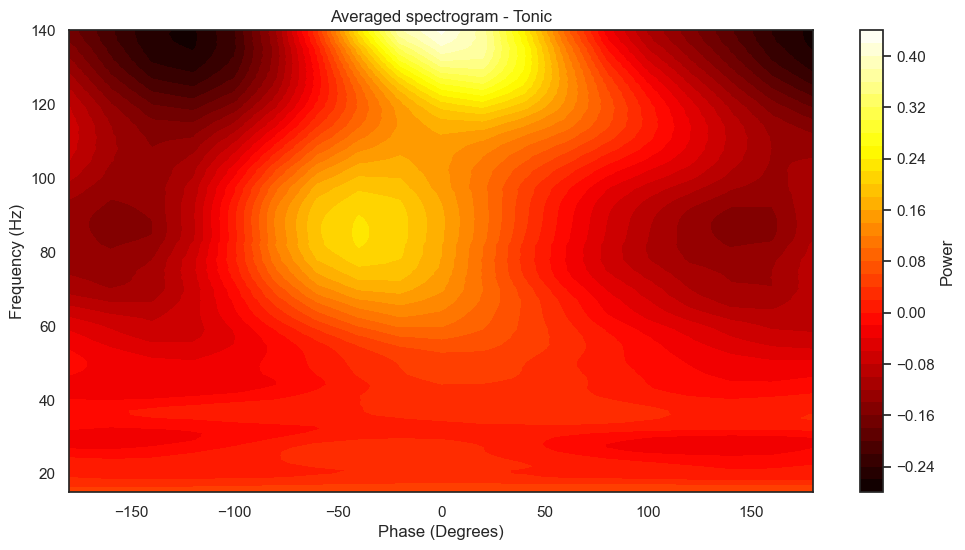

In [95]:
# Filter out entries with incorrect shapes (only keep numpy arrays with shape (x, 126, 19))
filtered_FPPs = [inner_list for inner_list in all_tonic_FPPs if isinstance(inner_list, np.ndarray) and inner_list.shape[1:] == (126, 19)]

# Verify that all remaining elements have the desired shape
print(f"Number of valid entries: {len(filtered_FPPs)}")
for i, inner_list in enumerate(filtered_FPPs):
    print(f"Shape of valid entry {i}: {np.shape(inner_list)}")

# Now calculate the mean across the filtered list
avg_FPP = np.mean([np.mean(inner_list, axis=0) for inner_list in filtered_FPPs], axis=0)

# Define angles and plot once
angles = np.linspace(-180, 180, 19)
plt.figure(figsize=(12, 6))
plt.contourf(angles, frequencies, avg_FPP, 40, cmap='hot')
plt.xlabel('Phase (Degrees)')
plt.ylabel('Frequency (Hz)')
plt.title('Averaged spectrogram - Tonic')
plt.colorbar(label='Power')
plt.show()

In [90]:
for i, inner_list in enumerate(all_tonic_FPPs):
    print(f"Shape of all_tonic_FPPs[{i}]: {np.shape(inner_list)}")

Shape of all_tonic_FPPs[0]: (548, 126, 19)
Shape of all_tonic_FPPs[1]: (63, 126, 19)
Shape of all_tonic_FPPs[2]: (318, 126, 19)
Shape of all_tonic_FPPs[3]: (22, 126, 19)
Shape of all_tonic_FPPs[4]: (435, 126, 19)
Shape of all_tonic_FPPs[5]: (139, 126, 19)
Shape of all_tonic_FPPs[6]: (554, 126, 19)
Shape of all_tonic_FPPs[7]: (21, 126, 19)
Shape of all_tonic_FPPs[8]: (162, 126, 19)
Shape of all_tonic_FPPs[9]: (42, 126, 19)
Shape of all_tonic_FPPs[10]: (86, 126, 19)
Shape of all_tonic_FPPs[11]: (112, 126, 19)
Shape of all_tonic_FPPs[12]: (48, 126, 19)
Shape of all_tonic_FPPs[13]: (220, 126, 19)
Shape of all_tonic_FPPs[14]: (131, 126, 19)
Shape of all_tonic_FPPs[15]: (239, 126, 19)
Shape of all_tonic_FPPs[16]: (316, 126, 19)
Shape of all_tonic_FPPs[17]: (131, 126, 19)
Shape of all_tonic_FPPs[18]: (42, 126, 19)
Shape of all_tonic_FPPs[19]: (356, 126, 19)
Shape of all_tonic_FPPs[20]: (245, 126, 19)
Shape of all_tonic_FPPs[21]: (178, 126, 19)
Shape of all_tonic_FPPs[22]: (273, 126, 19)
Shape

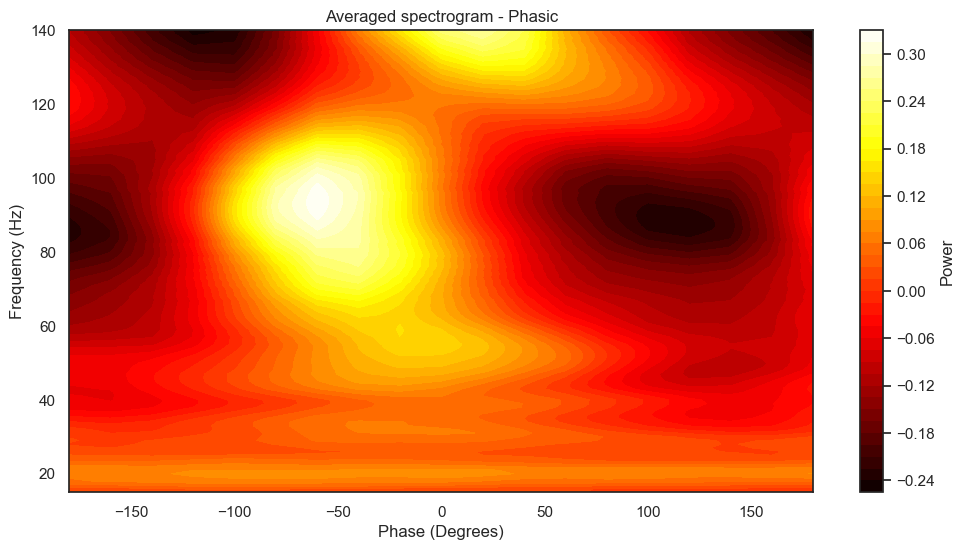

In [96]:
# Calculate the mean across all lists in all_tonic_FPPs
avg_FPP = np.mean([np.mean(inner_list, axis=0) for inner_list in all_phasic_FPPs], axis=0)

# Define angles and plot once
angles = np.linspace(-180, 180, 19)
plt.figure(figsize=(12, 6))

plt.contourf(angles, frequencies, avg_FPP, 40, cmap='hot')

plt.xlabel('Phase (Degrees)')
plt.ylabel('Frequency (Hz)')
plt.title('Averaged spectrogram - Phasic')

plt.colorbar(label='Power')
plt.show()

# for all rats

In [12]:
# List of rat IDs to process
rat_ids = [3, 4, 6, 9, 11, 13]

# Initialize lists to hold combined data across all rats
combined_phasic_FPPs = []
combined_tonic_FPPs = []

# Loop through each rat ID and process their data
for rat_id in rat_ids:
    print(f"Processing data for Rat {rat_id}...")
    all_phasic_FPPs, all_tonic_FPPs = extract_data_for_rat(rat_id, config=config)
    
    # If data is returned (not None), add it to the combined lists
    if all_phasic_FPPs is not None and all_tonic_FPPs is not None:
        combined_phasic_FPPs.extend(all_phasic_FPPs)
        combined_tonic_FPPs.extend(all_tonic_FPPs)
    else:
        print(f"No data for Rat {rat_id}, skipping...")

Processing data for Rat 3...
Processing recording folder: Rat-OS-Ephys_Rat3_SD1_OR_08-11-2017
Processing trial folder: post_trial5_2017-11-08_16-18-24
There was 0 in the dataset
Number of detected Tonic intrevals:28
Number of detected Tonic intrevals after threshold:28
 Checking Cycles inputs - trimming singleton from input 'IP'
12995
 Checking Cycles inputs - trimming singleton from input 'IP'
5910
 Checking Cycles inputs - trimming singleton from input 'IP'
3370
 Checking Cycles inputs - trimming singleton from input 'IP'
3070
 Checking Cycles inputs - trimming singleton from input 'IP'
6230
 Checking Cycles inputs - trimming singleton from input 'IP'
3455
 Checking Cycles inputs - trimming singleton from input 'IP'
2350
 Checking Cycles inputs - trimming singleton from input 'IP'
3970
 Checking Cycles inputs - trimming singleton from input 'IP'
3680
 Checking Cycles inputs - trimming singleton from input 'IP'
3660
 Checking Cycles inputs - trimming singleton from input 'IP'
2695
 Ch

In [23]:
combined_phasic_FPPs

(43, 126, 19)

In [17]:
# Now process combined data for spectral analysis
# Extract phasic and tonic signatures separately
combined_phasic_sss = extract_and_flatten_signatures(combined_phasic_FPPs)
combined_tonic_sss = extract_and_flatten_signatures(combined_tonic_FPPs)

# Concatenate phasic and tonic FPPs for combined processing
all_FPPs_combined = combined_phasic_FPPs + combined_tonic_FPPs
combined_all_sss = extract_and_flatten_signatures(all_FPPs_combined)

# At this point, you have:
# - `combined_phasic_sss`: signatures for all phasic FPPs across all rats
# - `combined_tonic_sss`: signatures for all tonic FPPs across all rats
# - `combined_all_sss`: combined signatures for all FPPs across all rats

In [50]:
combined_tonic_sss.shape

(346571, 126)

Peak frequency of tSC1 (Phasic Cycles - All rats): 130.00 Hz
Peak frequency of tSC2 (Phasic Cycles - All rats): 56.00 Hz
Peak frequency of tSC3 (Phasic Cycles - All rats): 41.00 Hz
Peak frequency of tSC4 (Phasic Cycles - All rats): 107.00 Hz
Peak frequency of tSC5 (Phasic Cycles - All rats): 77.00 Hz


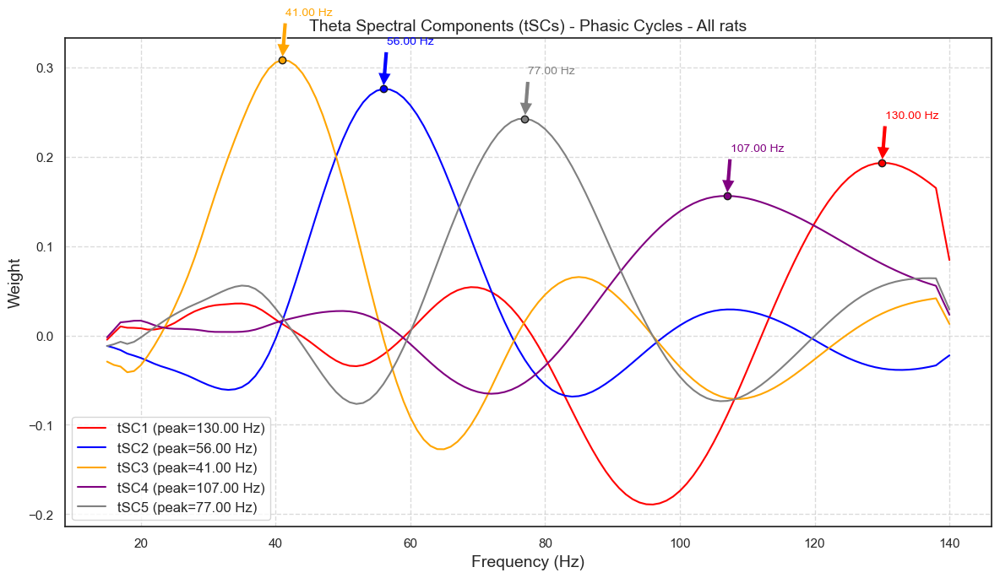

Peak frequency of tSC1 (Tonic Cycles - All rats): 73.00 Hz
Peak frequency of tSC2 (Tonic Cycles - All rats): 56.00 Hz
Peak frequency of tSC3 (Tonic Cycles - All rats): 38.00 Hz
Peak frequency of tSC4 (Tonic Cycles - All rats): 92.00 Hz
Peak frequency of tSC5 (Tonic Cycles - All rats): 81.00 Hz


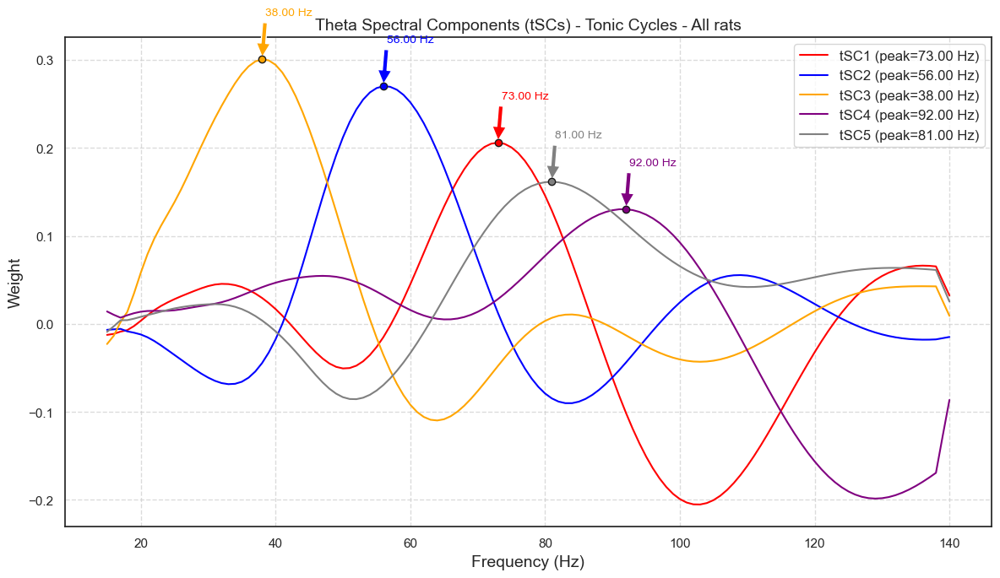


Phasic cycles grouped by component:
  Component 1: 4050 cycles -> indices [0, 2, 3, 9, 16, 17, 24, 27, 29, 30, 32, 35, 39, 48, 55, 56, 67, 72, 78, 79, 85, 86, 87, 88, 89, 91, 95, 100, 117, 144, 150, 151, 152, 161, 171, 176, 182, 186, 187, 188, 191, 197, 202, 204, 205, 207, 209, 211, 213, 214, 221, 250, 256, 260, 270, 271, 275, 278, 280, 281, 284, 285, 287, 288, 290, 291, 298, 299, 307, 308, 324, 326, 327, 337, 341, 342, 347, 349, 353, 355, 358, 359, 360, 365, 369, 374, 376, 379, 383, 385, 390, 395, 401, 405, 407, 409, 411, 419, 420, 423, 432, 441, 446, 449, 455, 456, 458, 465, 468, 470, 478, 485, 499, 500, 501, 509, 540, 549, 553, 555, 557, 571, 582, 588, 596, 597, 600, 601, 606, 609, 615, 616, 621, 626, 627, 633, 639, 640, 641, 642, 646, 648, 657, 660, 669, 690, 691, 696, 700, 701, 704, 707, 710, 716, 719, 724, 726, 737, 747, 751, 753, 754, 762, 763, 766, 769, 779, 780, 783, 785, 787, 793, 802, 806, 808, 812, 813, 824, 829, 833, 836, 840, 842, 844, 846, 850, 854, 863, 864, 865, 868, 

In [24]:
from collections import defaultdict
def process_and_plot_spectral_components(data, n_components, frequencies, title_suffix, save_path):
    """
    Processes the spectral data and plots the theta spectral components with peak frequencies.
    Returns:
        tSCs (np.ndarray): 2D array of shape (n_samples, n_components),
                           the ICA time courses in the reduced PCA space.
        tSCs_weights_original (np.ndarray): 2D array of shape (n_components, n_freqs),
                                            the ICA components projected back into the original space.
    """
    if data.size == 0:
        print(f"[Warning] Empty data for {title_suffix}. Skipping.")
        return None, None
    
    # Step 1: PCA
    pca = PCA(n_components=n_components, random_state=42)
    pca_result = pca.fit_transform(data)
    
    # Step 2: ICA (on the PCA-reduced data)
    ica = FastICA(n_components=n_components, random_state=42)
    tSCs = ica.fit_transform(pca_result)  # shape: (n_samples, n_components)
    ica_components = ica.components_      # shape: (n_components, n_components) in PCA space
    
    # Step 3: Calculate original weights by projecting ICA components back to original space
    #         We do: ICA components * PCA components
    tSCs_weights_original = np.dot(ica_components, pca.components_)  # shape: (n_components, n_freqs)
    
    # Step 4: Adjust sign of components so that the average projection is positive
    mean_projections = np.dot(tSCs_weights_original, data.T).mean(axis=1)
    for i in range(n_components):
        if mean_projections[i] < 0:
            tSCs_weights_original[i, :] *= -1
            tSCs[:, i] *= -1  # also flip the sign in the time courses if desired
    
    # Step 5: Determine peak frequencies
    peak_frequencies = []
    for i in range(n_components):
        idx_peak = np.argmax(tSCs_weights_original[i, :])
        peak_freq = frequencies[idx_peak]
        peak_frequencies.append(peak_freq)
        print(f"Peak frequency of tSC{i+1} ({title_suffix}): {peak_freq:.2f} Hz")
    
    # Step 6: Plotting
    colors = ['red', 'blue', 'orange', 'purple', 'gray', 'green', 'brown']
    labels = [f'tSC{i+1}' for i in range(n_components)]
    plt.figure(figsize=(12, 7))
    
    for i in range(n_components):
        plt.plot(frequencies, tSCs_weights_original[i, :], 
                 color=colors[i % len(colors)], 
                 label=f'{labels[i]} (peak={peak_frequencies[i]:.2f} Hz)')
        # Mark the peak
        peak_idx = np.where(frequencies == peak_frequencies[i])[0]
        if len(peak_idx) > 0:
            idxp = peak_idx[0]
            plt.scatter(peak_frequencies[i], tSCs_weights_original[i, idxp],
                        color=colors[i % len(colors)], edgecolor='k', zorder=5)
            plt.annotate(f'{peak_frequencies[i]:.2f} Hz',
                         xy=(peak_frequencies[i], tSCs_weights_original[i, idxp]),
                         xytext=(peak_frequencies[i]+0.5, tSCs_weights_original[i, idxp]+0.05),
                         arrowprops=dict(facecolor=colors[i % len(colors)], shrink=0.05),
                         fontsize=10,
                         color=colors[i % len(colors)])
    
    plt.xlabel('Frequency (Hz)', fontsize=14)
    plt.ylabel('Weight', fontsize=14)
    plt.title(f'Theta Spectral Components (tSCs) - {title_suffix}', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

    return tSCs, tSCs_weights_original

###########################################
# 3. Run analysis on phasic and tonic
###########################################

# Define how many components you want
n_components_pca = 5

# Suppose you have a frequency array:
# For example, from 0 to 25 Hz in 0.5 Hz steps:
frequencies = np.arange(15, 141, 1)

# Process phasic data
phasic_tSCs, phasic_weights = process_and_plot_spectral_components(
    combined_phasic_sss,
    n_components_pca,
    frequencies,
    "Phasic Cycles - All rats",
    "spectral_components_phasic_cycle_all_rats.svg"
)

# Process tonic data
tonic_tSCs, tonic_weights = process_and_plot_spectral_components(
    combined_tonic_sss,
    n_components_pca,
    frequencies,
    "Tonic Cycles - All rats",
    "spectral_components_tonic_cycle_all_rats.svg"
)

###########################################
# 4. Assign cycles to ICA components
###########################################

def group_cycles_by_component(assigned_components):
    """
    Given an array of component assignments (one per cycle),
    return a dict listing the cycle indices for each component.
    """
    cycles_by_comp = defaultdict(list)
    for cycle_idx, comp_idx in enumerate(assigned_components):
        cycles_by_comp[comp_idx].append(cycle_idx)
    return cycles_by_comp

# -- Phasic --
if phasic_tSCs is not None:
    # Take absolute value of the time courses to ignore sign
    phasic_tSCs_abs = np.abs(phasic_tSCs)  # shape: (n_phasic_cycles, n_components)
    # Assign each cycle to the component with the largest absolute activation
    assigned_components_phasic = np.argmax(phasic_tSCs_abs, axis=1)
    # Group phasic cycle indices by component
    phasic_cycles_by_comp = group_cycles_by_component(assigned_components_phasic)

    print("\nPhasic cycles grouped by component:")
    for comp_idx, cycle_indices in phasic_cycles_by_comp.items():
        print(f"  Component {comp_idx}: {len(cycle_indices)} cycles -> indices {cycle_indices}")

# -- Tonic --
if tonic_tSCs is not None:
    tonic_tSCs_abs = np.abs(tonic_tSCs)
    assigned_components_tonic = np.argmax(tonic_tSCs_abs, axis=1)
    tonic_cycles_by_comp = group_cycles_by_component(assigned_components_tonic)

    print("\nTonic cycles grouped by component:")
    for comp_idx, cycle_indices in tonic_cycles_by_comp.items():
        print(f"  Component {comp_idx}: {len(cycle_indices)} cycles -> indices {cycle_indices}")


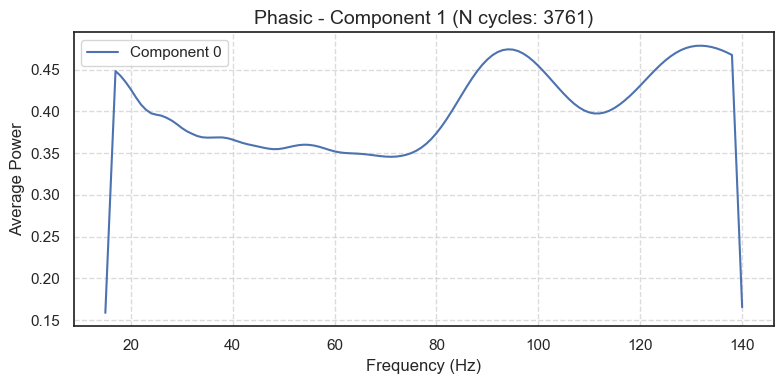

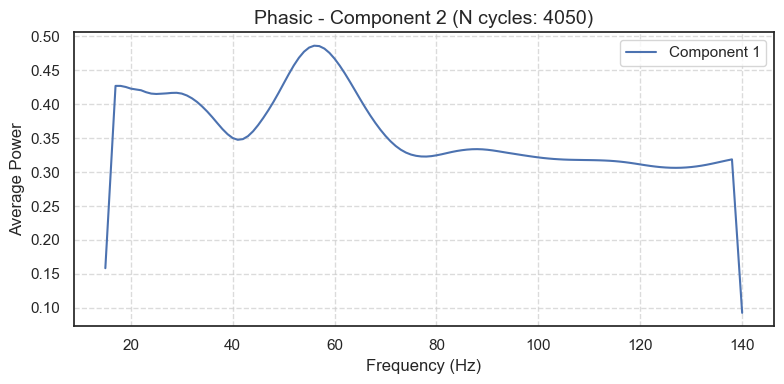

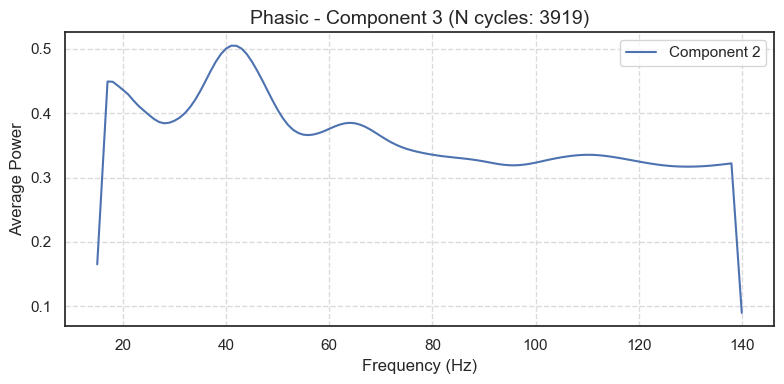

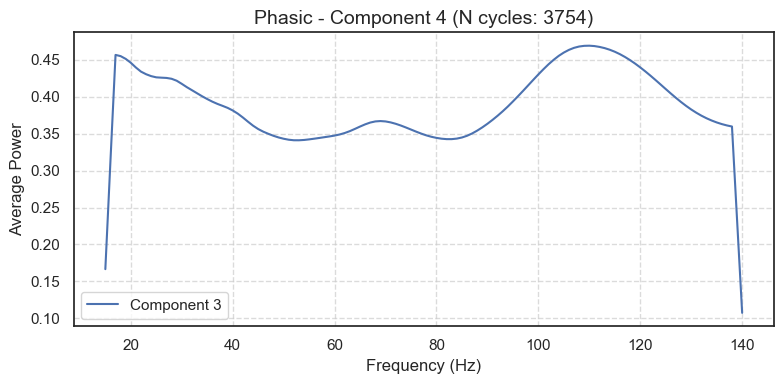

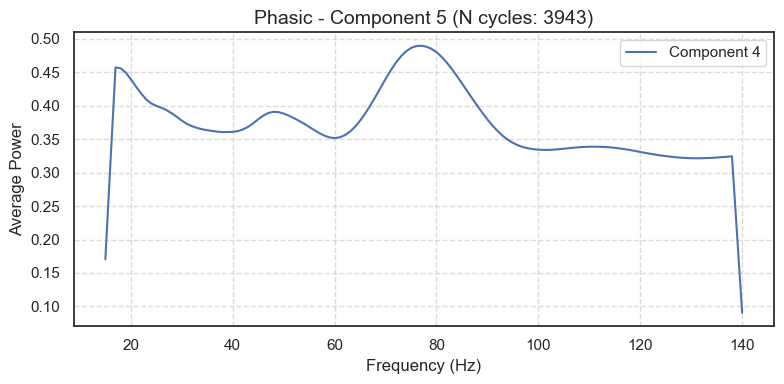

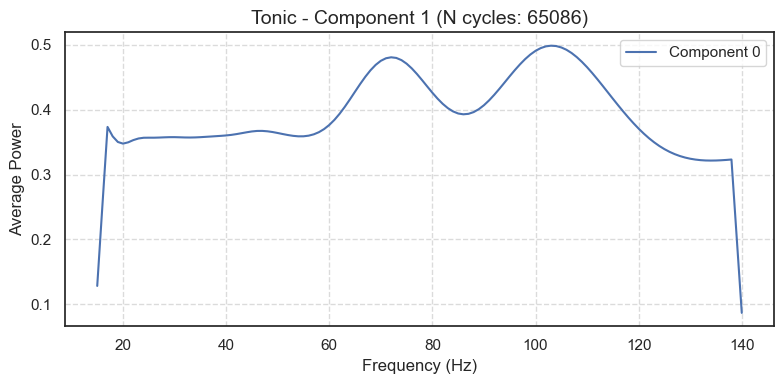

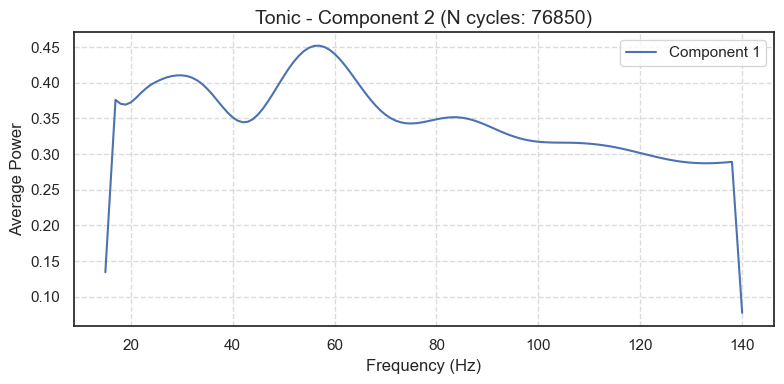

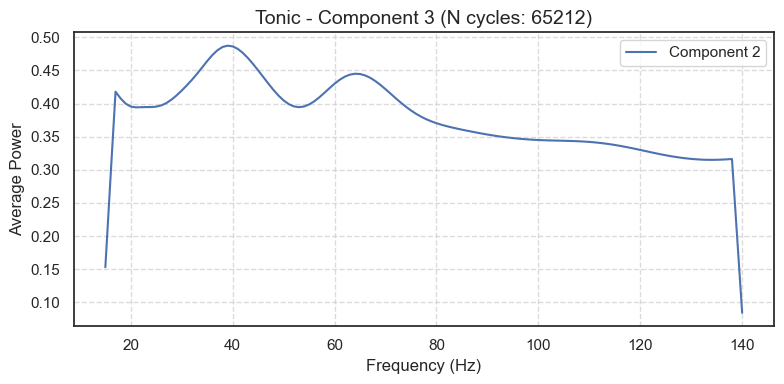

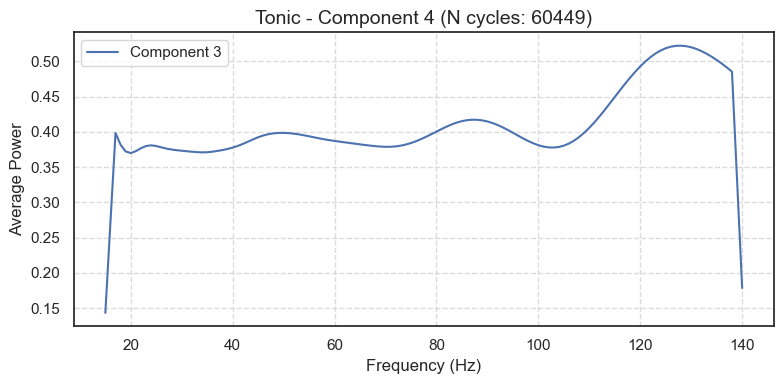

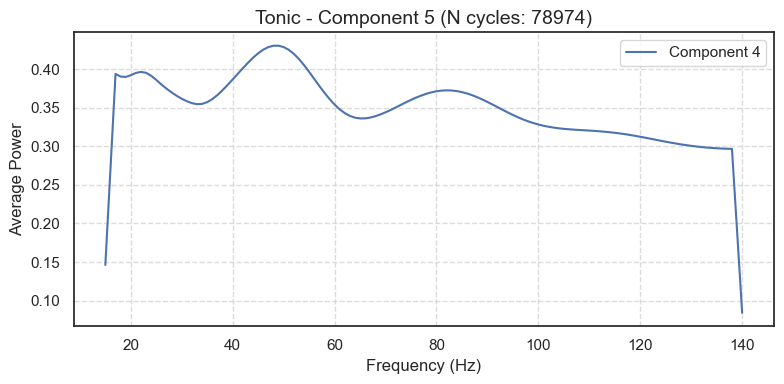

In [25]:
import matplotlib.pyplot as plt
import numpy as np

def plot_average_spectrum_by_component(data, cycles_by_comp, frequencies, title_prefix="Phasic"):
    """
    Plot the average frequency spectrum for each component, on separate figures.

    Parameters
    ----------
    data : np.ndarray
        2D array of shape (n_cycles, n_freq_bins).
    cycles_by_comp : dict
        Dictionary mapping component_index -> list_of_cycle_indices.
    frequencies : np.ndarray
        1D array of frequency values, length must match data.shape[1].
    title_prefix : str
        Label prefix for figure titles (e.g. "Phasic" or "Tonic").
    """

    # Sort the components so we always plot in ascending order
    for comp_idx in sorted(cycles_by_comp.keys()):
        cycle_indices = cycles_by_comp[comp_idx]
        if len(cycle_indices) == 0:
            continue  # skip if no cycles for this component

        # Extract the rows for all cycles assigned to comp_idx
        comp_data = data[cycle_indices, :]  # shape = (n_assigned_cycles, n_freq_bins)

        # Compute the average across cycles
        avg_spectrum = comp_data.mean(axis=0)

        # Plot in a new figure
        plt.figure(figsize=(8, 4))
        plt.plot(frequencies, avg_spectrum, color='b', label=f'Component {comp_idx}')
        plt.title(f"{title_prefix} - Component {comp_idx + 1} (N cycles: {len(cycle_indices)})", fontsize=14)
        plt.xlabel("Frequency (Hz)", fontsize=12)
        plt.ylabel("Average Power", fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Example usage for phasic
if phasic_tSCs is not None:
    plot_average_spectrum_by_component(
        data=combined_phasic_sss,
        cycles_by_comp=phasic_cycles_by_comp,
        frequencies=frequencies,
        title_prefix="Phasic"
    )

# Example usage for tonic
if tonic_tSCs is not None:
    plot_average_spectrum_by_component(
        data=combined_tonic_sss,
        cycles_by_comp=tonic_cycles_by_comp,
        frequencies=frequencies,
        title_prefix="Tonic"
    )

Peak frequency of tSC1: 130 Hz
Peak frequency of tSC2: 56 Hz
Peak frequency of tSC3: 40 Hz
Peak frequency of tSC4: 107 Hz
Peak frequency of tSC5: 77 Hz


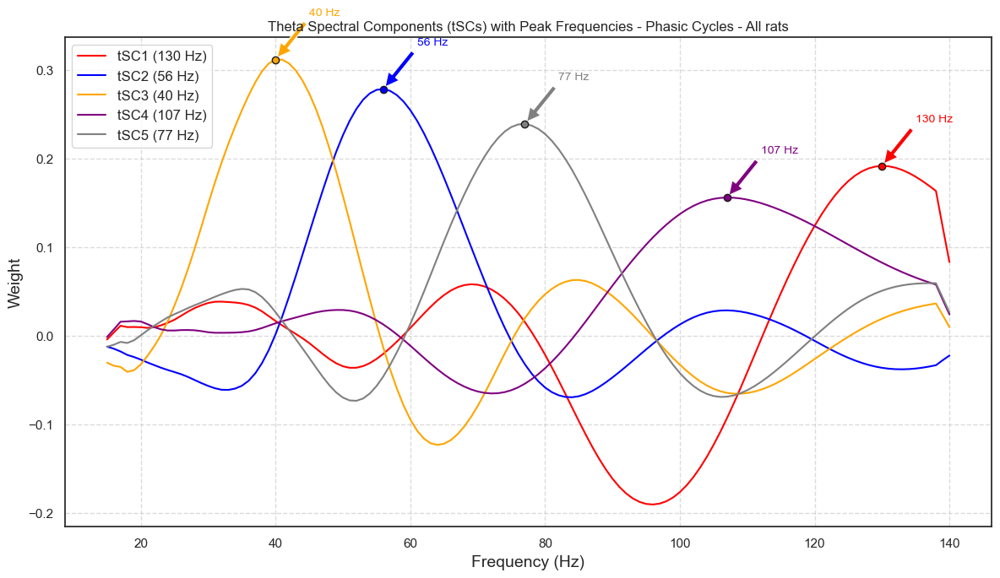

In [19]:
# Phasic data
process_and_plot_spectral_components(combined_phasic_sss, n_components_pca, frequencies, "Phasic Cycles - All rats", f"spectral_components_phasic_cycle_all_rats.svg")

Peak frequency of tSC1: 73 Hz
Peak frequency of tSC2: 56 Hz
Peak frequency of tSC3: 38 Hz
Peak frequency of tSC4: 92 Hz
Peak frequency of tSC5: 81 Hz


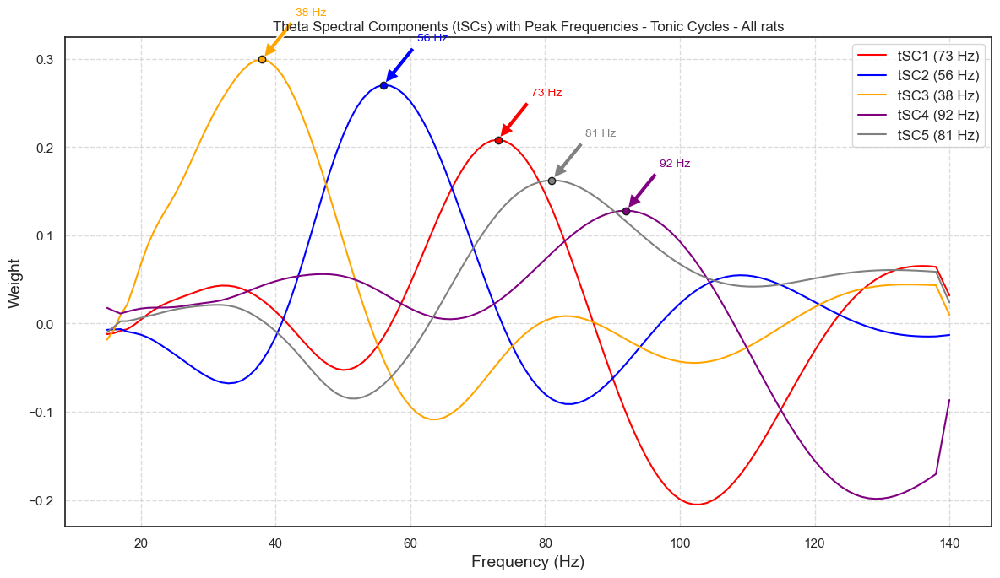

In [20]:
# Phasic data
process_and_plot_spectral_components(combined_tonic_sss, n_components_pca, frequencies, "Tonic Cycles - All rats", f"spectral_components_tonic_cycle_all_rats.svg")

Peak frequency of tSC1: 73 Hz
Peak frequency of tSC2: 92 Hz
Peak frequency of tSC3: 38 Hz
Peak frequency of tSC4: 56 Hz
Peak frequency of tSC5: 81 Hz


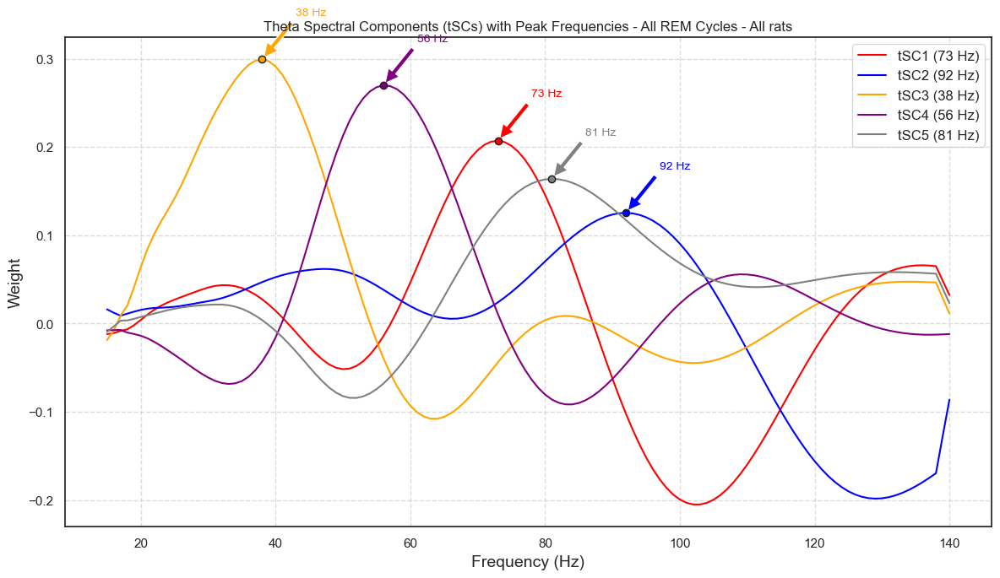

In [21]:
# Phasic data
process_and_plot_spectral_components(combined_all_sss, n_components_pca, frequencies, "All REM Cycles - All rats", f"spectral_components_rem_cycle_all_rats.svg")

In [26]:
combined_tonic_sss2 = np.array(combined_tonic_sss)

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import entropy
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Assuming `avg_FPP` is already calculated, with dimensions (frequencies, phases)

# Filter out entries with incorrect shapes (only keep numpy arrays with shape (x, 126, 19))
filtered_FPPs = [inner_list for inner_list in combined_tonic_FPPs if isinstance(inner_list, np.ndarray) and inner_list.shape[1:] == (26, 19)]

# # Verify that all remaining elements have the desired shape
# print(f"Number of valid entries: {len(filtered_FPPs)}")
# for i, inner_list in enumerate(filtered_FPPs):
#     print(f"Shape of valid entry {i}: {np.shape(inner_list)}")

# Now calculate the mean across the filtered list
avg_FPP = np.mean([np.mean(inner_list, axis=0) for inner_list in filtered_FPPs], axis=0)

frequencies = np.arange(15, 142, 5)  # Frequency range: 15 to 141 with step 5
angles = np.linspace(-180, 180, 19)  # Phase angles in degrees

# Normalizing the averaged FPP
fpp2 = np.abs(avg_FPP)
normalized_fpp2 = fpp2 / np.sum(fpp2)

# Define levels for the contour plot
n_levels = 20

# Calculate the average spectrum over frequency
avg_fpp2 = np.sum(fpp2, axis=1)

# Smooth the average spectrum
window_size = 5
smoothed_avg_fpp = np.convolve(avg_fpp2, np.ones(window_size) / window_size, mode='same')

# Normalize the smoothed average spectrum
smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / (np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp))

# Calculate Shannon entropy
shannon_entropy = entropy(smoothed_avg_fpp_norm.flatten(), base=2)

# Find mode frequency
max_index = np.unravel_index(np.argmax(normalized_fpp2, axis=None), normalized_fpp2.shape)
mode_frequency = frequencies[max_index[0]]

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Contour plot for normalized FPP
contour = ax.contourf(angles, frequencies, fpp2, levels=n_levels, cmap='hot')

# Add colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(contour, cax=cax)
cbar.set_label('Normalized Power')
cbar.ax.tick_params(labelsize=8)

# Add scaled profile of the smoothed average spectrum
scaled_profile = smoothed_avg_fpp_norm * (angles[-1] - angles[0]) + angles[0]
ax.plot(scaled_profile, frequencies, color='white', linewidth=2, label='Smoothed Avg Spectrum (Scaled)')

# Add a dashed line at the mode frequency
ax.axhline(mode_frequency, color='white', linestyle='--', linewidth=1, label='Mode Frequency')

# Labeling and limits
ax.set_xlabel('Phase (Degree)')
ax.set_ylabel('Frequency (Hz)')
ax.set_xlim(angles[0], angles[-1])
ax.set_ylim(frequencies[0], frequencies[-1])

# Add a title
ax.set_title(f"Normalized power - Mode frequency: {int(mode_frequency)} Hz - Entropy: {shannon_entropy:.4f}")

# Legend and layout
ax.legend(loc='upper right')
plt.tight_layout()

# Save and show the plot
plt.savefig("avg_spectrogram_with_spectrum_no_limits.svg", format='svg')
plt.show()


AxisError: axis 1 is out of bounds for array of dimension 0

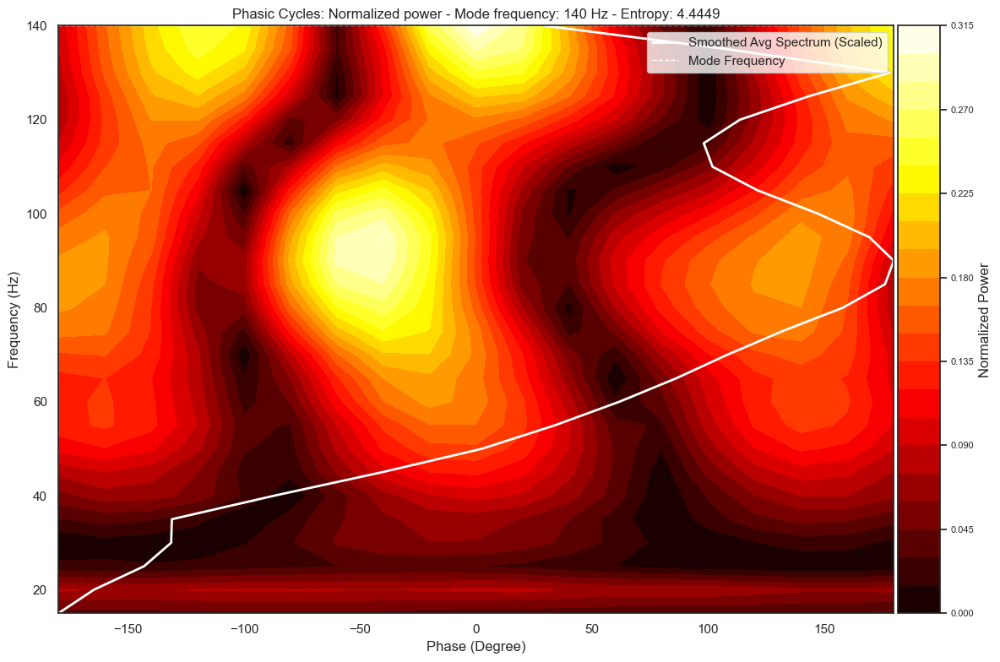

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import entropy
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Assuming `combined_phasic_FPPs` is available and contains the phasic data

# Calculate the mean across all phasic FPP lists
avg_FPP_phasic = np.mean([np.mean(inner_list, axis=0) for inner_list in combined_phasic_FPPs], axis=0)

# Define frequency and phase ranges
frequencies = np.arange(15, 142, 5)  # Frequency range: 15 to 141 with step 5
angles = np.linspace(-180, 180, 19)  # Phase angles in degrees

# Normalizing the averaged FPP
fpp2_phasic = np.abs(avg_FPP_phasic)
normalized_fpp2_phasic = fpp2_phasic / np.sum(fpp2_phasic)

# Define levels for the contour plot
n_levels = 20

# Calculate the average spectrum over frequency
avg_fpp2_phasic = np.sum(fpp2_phasic, axis=1)

# Smooth the average spectrum
window_size = 5
smoothed_avg_fpp_phasic = np.convolve(avg_fpp2_phasic, np.ones(window_size) / window_size, mode='same')

# Normalize the smoothed average spectrum
smoothed_avg_fpp_norm_phasic = (smoothed_avg_fpp_phasic - np.min(smoothed_avg_fpp_phasic)) / (np.max(smoothed_avg_fpp_phasic) - np.min(smoothed_avg_fpp_phasic))

# Calculate Shannon entropy
shannon_entropy_phasic = entropy(smoothed_avg_fpp_norm_phasic.flatten(), base=2)

# Find mode frequency
max_index_phasic = np.unravel_index(np.argmax(normalized_fpp2_phasic, axis=None), normalized_fpp2_phasic.shape)
mode_frequency_phasic = frequencies[max_index_phasic[0]]

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Contour plot for normalized FPP
contour = ax.contourf(angles, frequencies, fpp2_phasic, levels=n_levels, cmap='hot')

# Add colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(contour, cax=cax)
cbar.set_label('Normalized Power')
cbar.ax.tick_params(labelsize=8)

# Add scaled profile of the smoothed average spectrum
scaled_profile_phasic = smoothed_avg_fpp_norm_phasic * (angles[-1] - angles[0]) + angles[0]
ax.plot(scaled_profile_phasic, frequencies, color='white', linewidth=2, label='Smoothed Avg Spectrum (Scaled)')

# Add a dashed line at the mode frequency
ax.axhline(mode_frequency_phasic, color='white', linestyle='--', linewidth=1, label='Mode Frequency')

# Labeling and limits
ax.set_xlabel('Phase (Degree)')
ax.set_ylabel('Frequency (Hz)')
ax.set_xlim(angles[0], angles[-1])
ax.set_ylim(frequencies[0], frequencies[-1])

# Add a title
ax.set_title(f"Phasic Cycles: Normalized power - Mode frequency: {int(mode_frequency_phasic)} Hz - Entropy: {shannon_entropy_phasic:.4f}")

# Legend and layout
ax.legend(loc='upper right')
plt.tight_layout()

# Save and show the plot
plt.savefig("avg_spectrogram_phasic_with_spectrum.svg", format='svg')
plt.show()


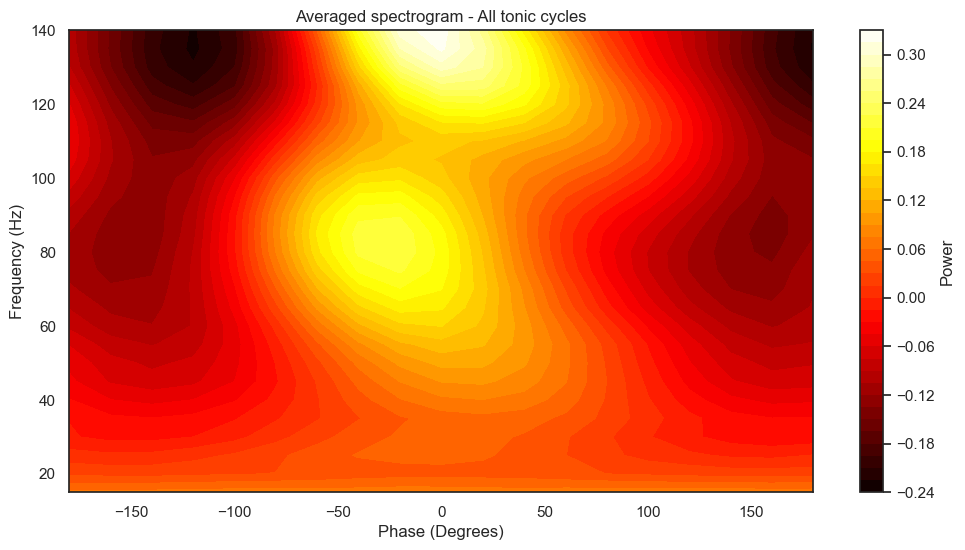

In [41]:
# Filter out entries with incorrect shapes (only keep numpy arrays with shape (x, 126, 19))
filtered_FPPs = [inner_list for inner_list in combined_tonic_FPPs if isinstance(inner_list, np.ndarray) and inner_list.shape[1:] == (26, 19)]

# # Verify that all remaining elements have the desired shape
# print(f"Number of valid entries: {len(filtered_FPPs)}")
# for i, inner_list in enumerate(filtered_FPPs):
#     print(f"Shape of valid entry {i}: {np.shape(inner_list)}")

# Now calculate the mean across the filtered list
avg_FPP = np.mean([np.mean(inner_list, axis=0) for inner_list in filtered_FPPs], axis=0)

# Define angles and plot once
angles = np.linspace(-180, 180, 19)
plt.figure(figsize=(12, 6))
plt.contourf(angles, frequencies, avg_FPP, 40, cmap='hot')
plt.xlabel('Phase (Degrees)')
plt.ylabel('Frequency (Hz)')
plt.title('Averaged spectrogram - All tonic cycles')
plt.colorbar(label='Power')
plt.show()

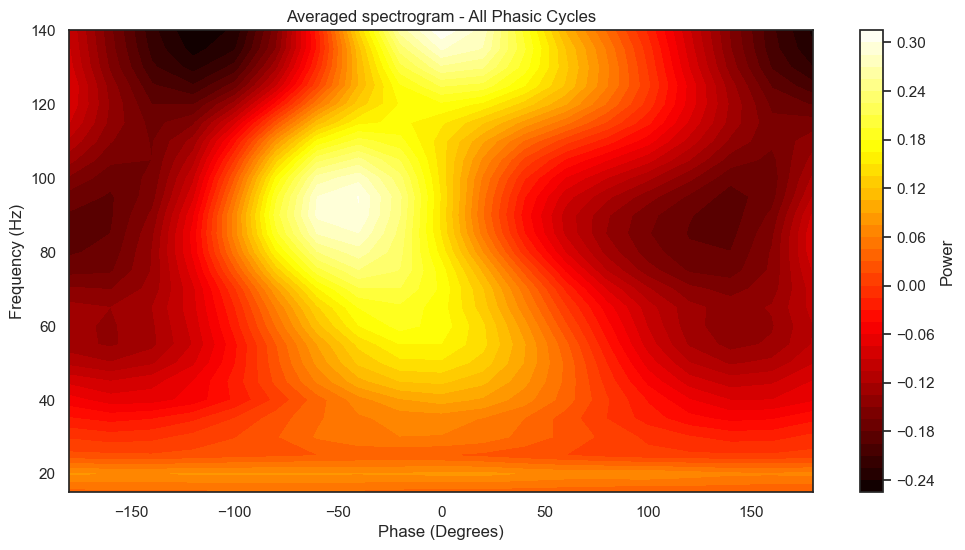

In [42]:
# Calculate the mean across all lists in all_tonic_FPPs
avg_FPP = np.mean([np.mean(inner_list, axis=0) for inner_list in combined_phasic_FPPs], axis=0)

# Define angles and plot once
angles = np.linspace(-180, 180, 19)
plt.figure(figsize=(12, 6))

plt.contourf(angles, frequencies, avg_FPP, 40, cmap='hot')

plt.xlabel('Phase (Degrees)')
plt.ylabel('Frequency (Hz)')
plt.title('Averaged spectrogram - All Phasic Cycles')

plt.colorbar(label='Power')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

filtered_tonic = [
    arr for arr in combined_tonic_FPPs 
    if isinstance(arr, np.ndarray) and arr.shape[1:] == (126, 19)
]
filtered_phasic = [
    arr for arr in combined_phasic_FPPs 
    if isinstance(arr, np.ndarray) and arr.shape[1:] == (126, 19)
]

# ---------------------------------------------------------
# 2. Compute the average spectrogram for each condition
# ---------------------------------------------------------
# Average over the cycle dimension (axis 0) for each trial,
# then average across all trials.
avg_FPP_tonic = np.mean([np.mean(arr, axis=0) for arr in filtered_tonic], axis=0)   # shape: (126, 19)
avg_FPP_phasic = np.mean([np.mean(arr, axis=0) for arr in filtered_phasic], axis=0)   # shape: (126, 19)

# --------------------------------------------------
# 3. Define the axes for phase and frequency
# --------------------------------------------------
angles = np.linspace(-180, 180, 19)         # 19 phase bins
frequencies = np.linspace(15, 140, 126)       # 126 frequency bins from 15 Hz to 140 Hz

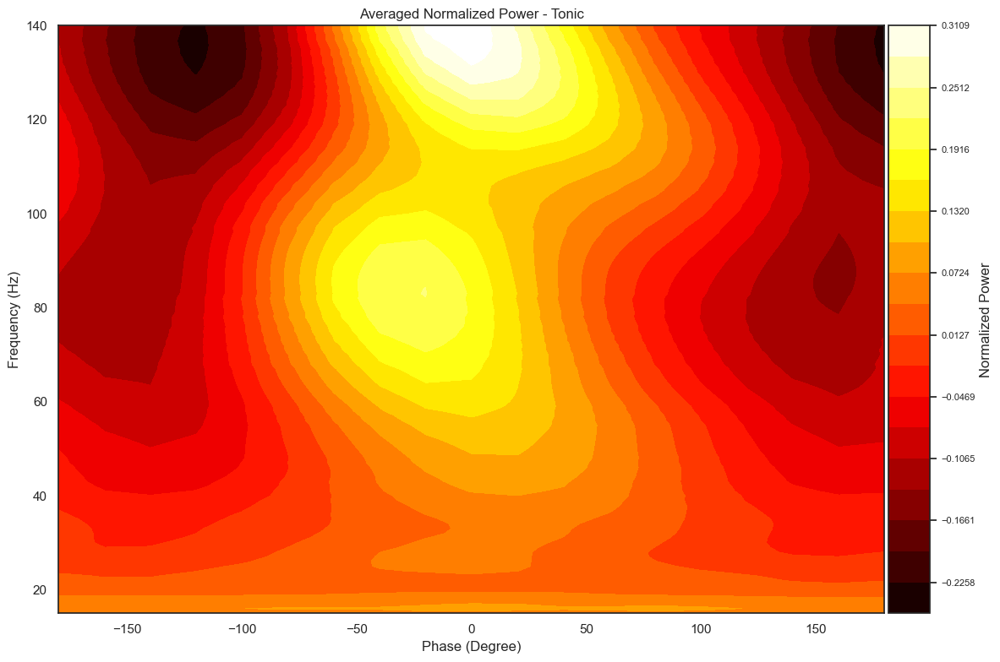

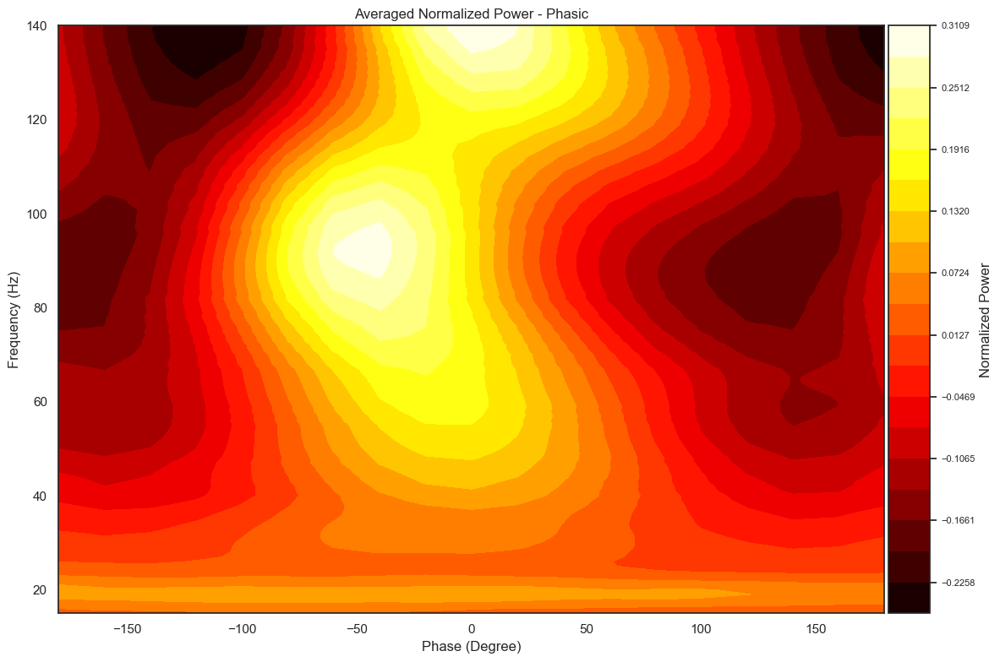

In [46]:
# -----------------------------
n_levels = 20
levels = np.linspace(np.min(avg_FPP_phasic), np.max(avg_FPP_phasic), n_levels)

# -----------------------------
# 3. Tonic Plot with Common Color Levels
# -----------------------------
fig_tonic, ax_tonic = plt.subplots(figsize=(12, 8))
contour_tonic = ax_tonic.contourf(angles, frequencies, avg_FPP_tonic, levels=levels, cmap='hot')

# Add a colorbar (using a divider for proper alignment)
divider_tonic = make_axes_locatable(ax_tonic)
cax_tonic = divider_tonic.append_axes("right", size="5%", pad=0.05)
cbar_tonic = fig_tonic.colorbar(contour_tonic, cax=cax_tonic)
cbar_tonic.set_label('Normalized Power')
cbar_tonic.ax.tick_params(labelsize=8)

# Set labels, limits, and title for the tonic plot
ax_tonic.set_xlabel('Phase (Degree)')
ax_tonic.set_ylabel('Frequency (Hz)')
ax_tonic.set_xlim(angles[0], angles[-1])
ax_tonic.set_ylim(frequencies[0], frequencies[-1])
ax_tonic.set_title("Averaged Normalized Power - Tonic")

plt.tight_layout()
plt.savefig("average_tonic_FPP_spectrogram_with_limit.svg", format='svg')
plt.show()


# -----------------------------
# 4. Phasic Plot with the Same Color Levels
# -----------------------------
fig_phasic, ax_phasic = plt.subplots(figsize=(12, 8))
contour_phasic = ax_phasic.contourf(angles, frequencies, avg_FPP_phasic, levels=levels, cmap='hot')

# Add a colorbar using a divider for the phasic plot
divider_phasic = make_axes_locatable(ax_phasic)
cax_phasic = divider_phasic.append_axes("right", size="5%", pad=0.05)
cbar_phasic = fig_phasic.colorbar(contour_phasic, cax=cax_phasic)
cbar_phasic.set_label('Normalized Power')
cbar_phasic.ax.tick_params(labelsize=8)

# Set labels, limits, and title for the phasic plot
ax_phasic.set_xlabel('Phase (Degree)')
ax_phasic.set_ylabel('Frequency (Hz)')
ax_phasic.set_xlim(angles[0], angles[-1])
ax_phasic.set_ylim(frequencies[0], frequencies[-1])
ax_phasic.set_title("Averaged Normalized Power - Phasic")

plt.tight_layout()
plt.savefig("average_phasic_FPP_spectrogram_with_limit.svg", format='svg')
plt.show()

Peak frequency of tSC1 (Combined Cycles - All rats): 38.00 Hz
Peak frequency of tSC2 (Combined Cycles - All rats): 130.00 Hz
Peak frequency of tSC3 (Combined Cycles - All rats): 74.00 Hz
Peak frequency of tSC4 (Combined Cycles - All rats): 57.00 Hz
Peak frequency of tSC5 (Combined Cycles - All rats): 82.00 Hz


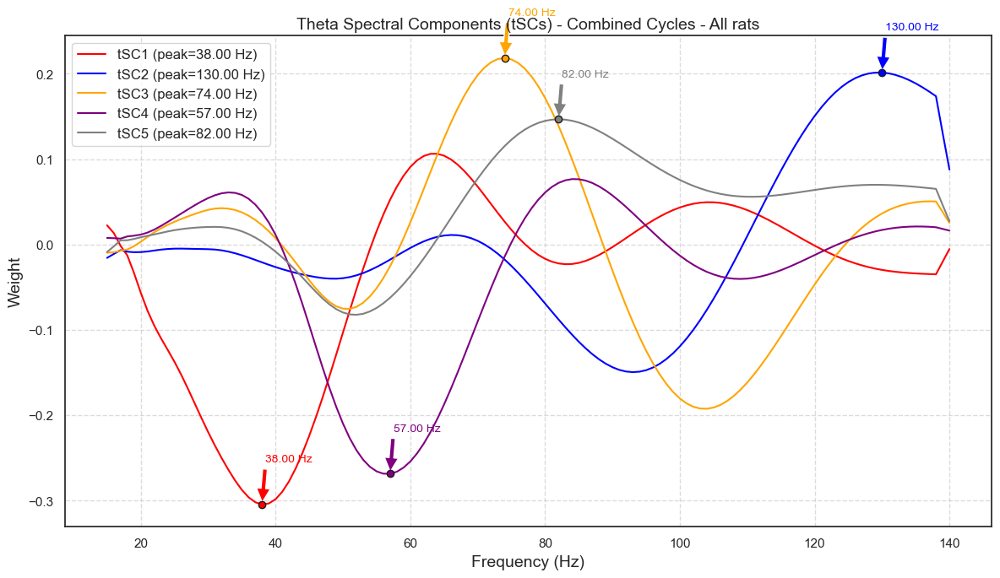

Component 3: 4281 phasic cycles, 75775 tonic cycles
Component 2: 4104 phasic cycles, 66065 tonic cycles
Component 4: 3795 phasic cycles, 78555 tonic cycles
Component 1: 3605 phasic cycles, 61888 tonic cycles
Component 0: 3642 phasic cycles, 64288 tonic cycles


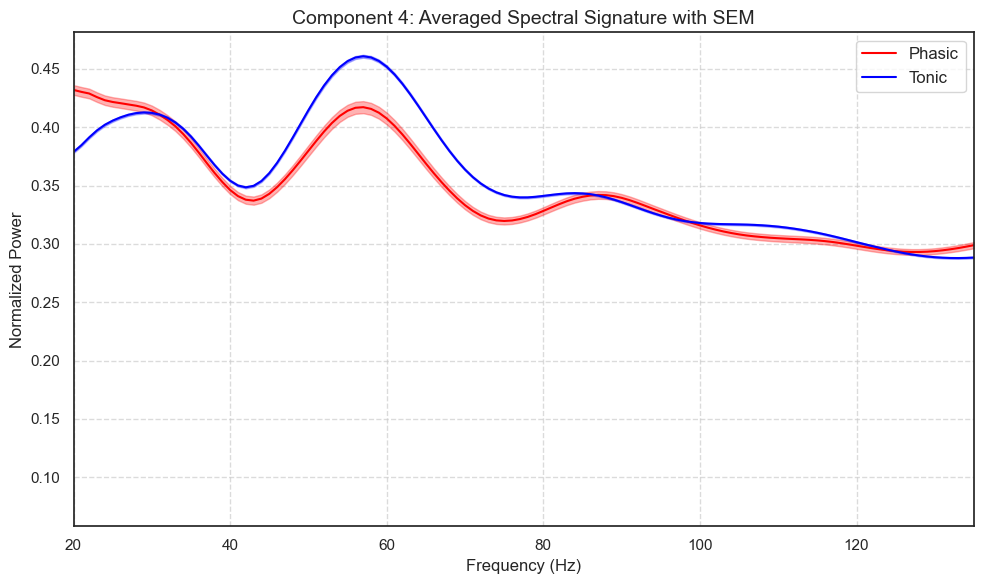

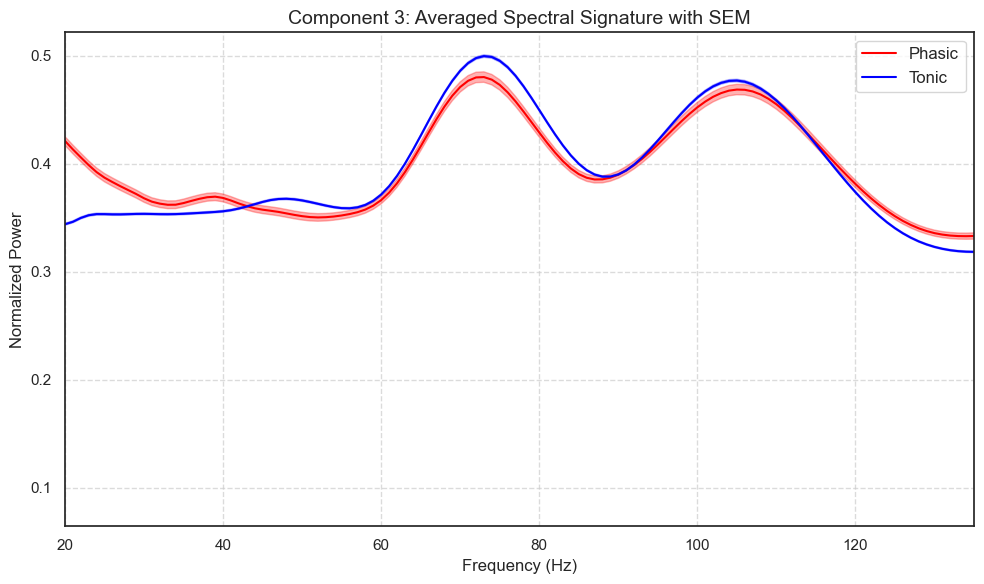

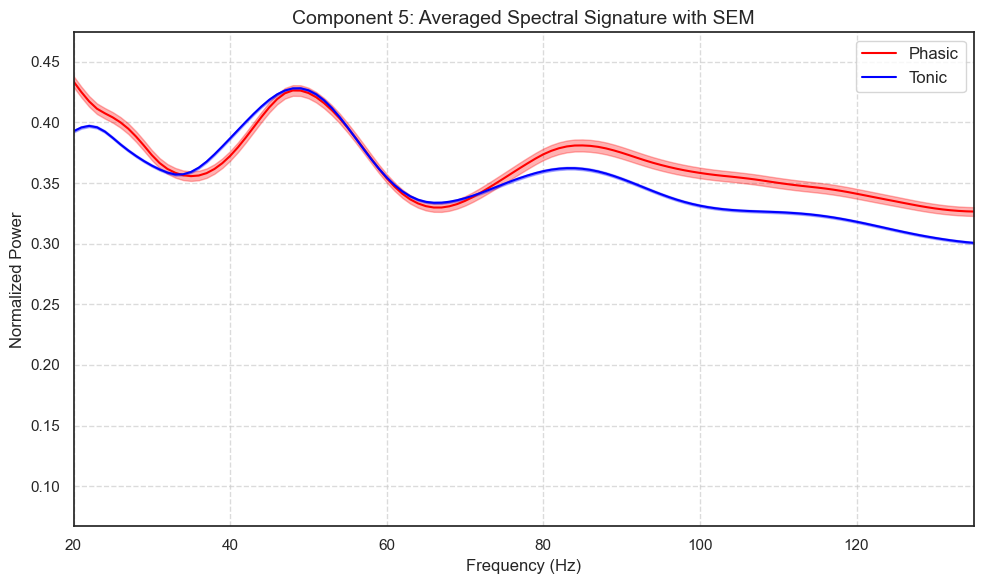

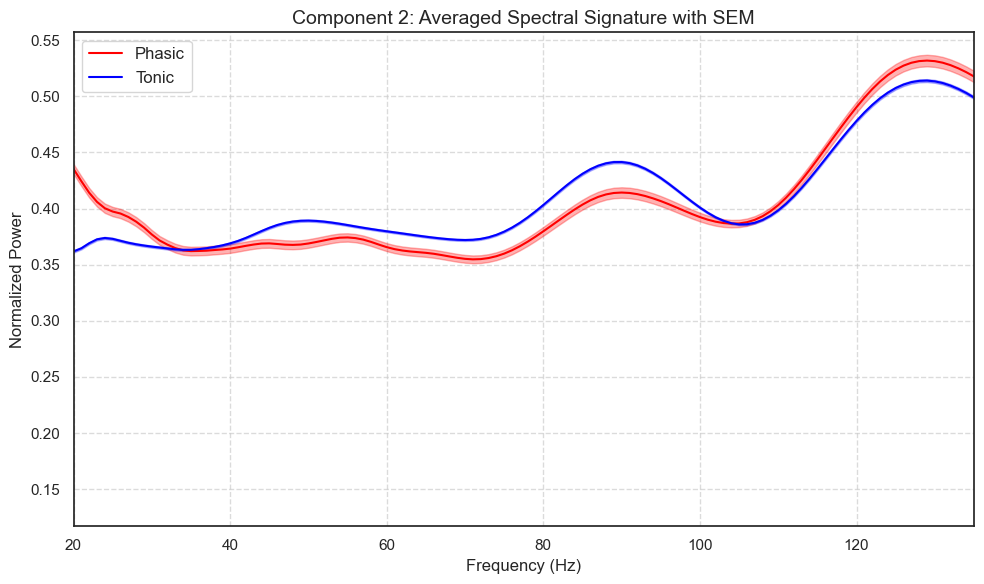

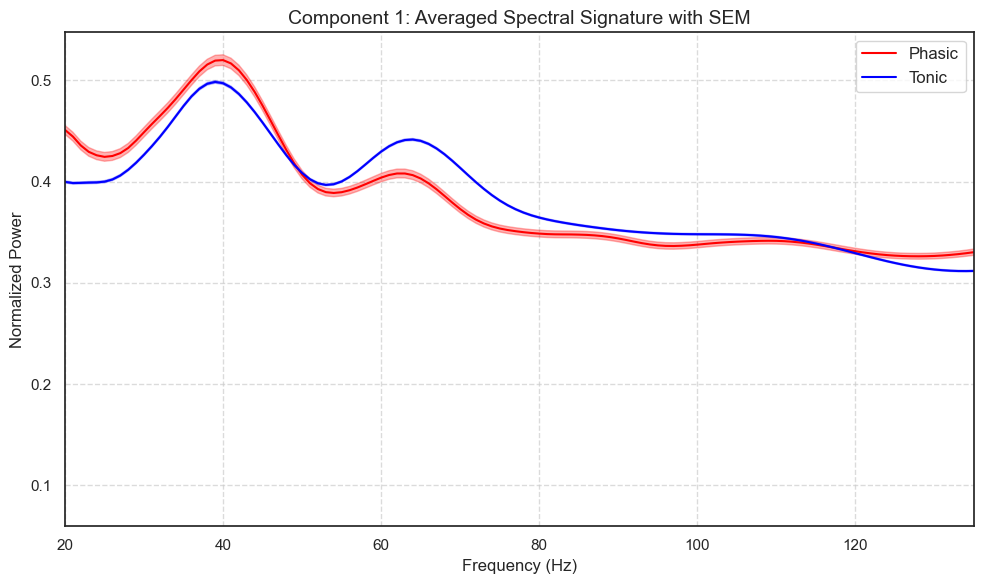

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.decomposition import PCA, FastICA

###########################################
# 1. Define the PCA/ICA processing function
###########################################
def process_and_plot_spectral_components(data, n_components, frequencies, title_suffix, save_path):
    """
    Processes the spectral data via PCA and ICA, then plots the ICA component weights.
    Returns:
        tSCs (np.ndarray): 2D array (n_samples x n_components), the ICA time courses.
        tSCs_weights_original (np.ndarray): 2D array (n_components x n_freqs), the ICA components in original space.
    Note:
        This version does not flip the sign of components.
        For peak detection we use the index of the maximum absolute weight.
    """
    if data.size == 0:
        print(f"[Warning] Empty data for {title_suffix}. Skipping.")
        return None, None

    # Step 1: PCA
    pca = PCA(n_components=n_components, random_state=42)
    pca_result = pca.fit_transform(data)
    
    # Step 2: ICA (on PCA-reduced data)
    ica = FastICA(n_components=n_components, random_state=42)
    tSCs = ica.fit_transform(pca_result)  # shape: (n_samples, n_components)
    ica_components = ica.components_
    
    # Step 3: Project ICA components back to original space
    tSCs_weights_original = np.dot(ica_components, pca.components_)  # shape: (n_components, n_freqs)
    
    # (Step 4: Do NOT adjust the sign; keep original weights)
    
    # Step 5: Determine peak frequencies using maximum absolute weight
    peak_frequencies = []
    for i in range(n_components):
        # Use the index of the maximum of absolute values so that a strong negative peak is captured.
        idx_peak = np.argmax(np.abs(tSCs_weights_original[i, :]))
        peak_freq = frequencies[idx_peak]
        peak_frequencies.append(peak_freq)
        print(f"Peak frequency of tSC{i+1} ({title_suffix}): {peak_freq:.2f} Hz")
    
    # Step 6: Plot the ICA component weights
    colors = ['red', 'blue', 'orange', 'purple', 'gray', 'green', 'brown']
    labels = [f'tSC{i+1}' for i in range(n_components)]
    plt.figure(figsize=(12, 7))
    for i in range(n_components):
        plt.plot(frequencies, tSCs_weights_original[i, :],
                 color=colors[i % len(colors)],
                 label=f'{labels[i]} (peak={peak_frequencies[i]:.2f} Hz)')
        # Mark the peak (using exact frequency match)
        peak_idx = np.where(frequencies == peak_frequencies[i])[0]
        if len(peak_idx) > 0:
            idxp = peak_idx[0]
            plt.scatter(peak_frequencies[i], tSCs_weights_original[i, idxp],
                        color=colors[i % len(colors)], edgecolor='k', zorder=5)
            plt.annotate(f'{peak_frequencies[i]:.2f} Hz',
                         xy=(peak_frequencies[i], tSCs_weights_original[i, idxp]),
                         xytext=(peak_frequencies[i]+0.5, tSCs_weights_original[i, idxp]+0.05),
                         arrowprops=dict(facecolor=colors[i % len(colors)], shrink=0.05),
                         fontsize=10,
                         color=colors[i % len(colors)])
    
    plt.xlabel('Frequency (Hz)', fontsize=14)
    plt.ylabel('Weight', fontsize=14)
    plt.title(f'Theta Spectral Components (tSCs) - {title_suffix}', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

    return tSCs, tSCs_weights_original

###########################################
# 2. Define a helper to group cycles by component
###########################################
def group_cycles_by_component(assigned_components):
    """
    Given an array of component assignments (one per cycle),
    returns a dict mapping each component to the list of cycle indices.
    """
    cycles_by_comp = defaultdict(list)
    for cycle_idx, comp_idx in enumerate(assigned_components):
        cycles_by_comp[comp_idx].append(cycle_idx)
    return cycles_by_comp

###########################################
# 3. Prepare combined spectral signatures and labels
###########################################
# Assume you have already extracted:
#   - combined_phasic_sss: shape (n_phasic, 126)
#   - combined_tonic_sss: shape (n_tonic, 126)
# For example, using your extract_and_flatten_signatures() function.
# Here we combine them:
combined_all_sss = np.concatenate([combined_phasic_sss, combined_tonic_sss], axis=0)
n_phasic = combined_phasic_sss.shape[0]
n_total = combined_all_sss.shape[0]

# Create a label vector: first n_phasic are 'phasic', the rest are 'tonic'
cycle_labels = np.array(['phasic'] * n_phasic + ['tonic'] * (n_total - n_phasic))

# Define frequency axis (15 Hz to 140 Hz -> 126 bins)
frequencies = np.arange(15, 141, 1)

###########################################
# 4. Run PCA/ICA on the combined spectral signatures
###########################################
n_components_pca = 5
combined_title = "Combined Cycles - All rats"
combined_save_path = "spectral_components_combined.svg"

combined_tSCs, combined_weights = process_and_plot_spectral_components(
    combined_all_sss,
    n_components_pca,
    frequencies,
    combined_title,
    combined_save_path
)

###########################################
# 5. Assign cycles to components based on ICA time courses
###########################################
if combined_tSCs is not None:
    # Use the absolute value so that strong negative activations are considered
    combined_tSCs_abs = np.abs(combined_tSCs)
    assigned_components = np.argmax(combined_tSCs_abs, axis=1)
    cycles_by_comp = group_cycles_by_component(assigned_components)
    
    for comp_idx, indices in cycles_by_comp.items():
        phasic_idx = [i for i in indices if cycle_labels[i] == 'phasic']
        tonic_idx = [i for i in indices if cycle_labels[i] == 'tonic']
        print(f"Component {comp_idx}: {len(phasic_idx)} phasic cycles, {len(tonic_idx)} tonic cycles")

###########################################
# 6. For each component, average spectral signatures separately for phasic and tonic cycles and plot with SEM
###########################################
# Here each row of combined_all_sss is a spectral signature (a 1D vector of length 126).
for comp_idx, indices in cycles_by_comp.items():
    # Separate indices by cycle type
    phasic_indices = [i for i in indices if cycle_labels[i] == 'phasic']
    tonic_indices = [i for i in indices if cycle_labels[i] == 'tonic']
    
    # Compute averages and SEM if there are any cycles
    if len(phasic_indices) > 0:
        phasic_signatures = combined_all_sss[phasic_indices, :]  # shape: (n_phasic_comp, 126)
        mean_phasic = np.mean(phasic_signatures, axis=0)
        sem_phasic = np.std(phasic_signatures, axis=0) / np.sqrt(phasic_signatures.shape[0])
    else:
        mean_phasic, sem_phasic = None, None
        
    if len(tonic_indices) > 0:
        tonic_signatures = combined_all_sss[tonic_indices, :]  # shape: (n_tonic_comp, 126)
        mean_tonic = np.mean(tonic_signatures, axis=0)
        sem_tonic = np.std(tonic_signatures, axis=0) / np.sqrt(tonic_signatures.shape[0])
    else:
        mean_tonic, sem_tonic = None, None
    
    # Plot the averaged spectral signature with SEM for this component
    plt.figure(figsize=(10, 6))
    if mean_phasic is not None:
        plt.plot(frequencies, mean_phasic, label='Phasic', color='red')
        plt.fill_between(frequencies, mean_phasic - sem_phasic, mean_phasic + sem_phasic,
                         color='red', alpha=0.3)
    if mean_tonic is not None:
        plt.plot(frequencies, mean_tonic, label='Tonic', color='blue')
        plt.fill_between(frequencies, mean_tonic - sem_tonic, mean_tonic + sem_tonic,
                         color='blue', alpha=0.3)
    plt.xlabel('Frequency (Hz)', fontsize=12)
    plt.ylabel('Normalized Power', fontsize=12)
    plt.title(f'Component {comp_idx + 1}: Averaged Spectral Signature with SEM', fontsize=14)
    plt.legend(fontsize=12)
    plt.xlim(20, 135)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(f'component_{comp_idx}_averaged_spectral_signature.svg', format='svg')
    plt.show()

In [ ]:
def process_and_plot_spectral_components_new(data, n_components, n_phasic, frequencies, title_suffix, save_path):
    """
    Processes the spectral data, applies PCA to the entire dataset (keeping intrinsic components identical),
    then applies ICA separately to phasic and tonic data. Plots their spectral components with peak frequencies.

    Args:
        data (np.ndarray): 2D array of shape (n_samples, n_features), containing phasic + tonic data.
        n_components (int): Number of PCA/ICA components.
        n_phasic (int): Number of phasic samples (used to split the dataset after PCA).
        frequencies (np.ndarray): Array of frequency values.
        title_suffix (str): A title suffix for the plot.
        save_path (str): Path to save the figure.

    Returns:
        tSCs_phasic (np.ndarray): Shape (n_phasic, n_components), ICA time courses for phasic data.
        tSCs_tonic (np.ndarray): Shape (n_tonic, n_components), ICA time courses for tonic data.
        tSCs_weights_original_phasic (np.ndarray): Shape (n_components, n_freqs), ICA components projected back for phasic.
        tSCs_weights_original_tonic (np.ndarray): Shape (n_components, n_freqs), ICA components projected back for tonic.
    """
    if data.size == 0:
        print(f"[Warning] Empty data for {title_suffix}. Skipping.")
        return None, None, None, None
    
    # Step 1: PCA on the Entire Dataset (Keeps Intrinsic Components Identical)
    pca = PCA(n_components=n_components, random_state=42)
    pca_result = pca.fit_transform(data)  # Shape: (n_samples, n_components)

    # Step 2: Split PCA-transformed data into Phasic and Tonic
    n_tonic = data.shape[0] - n_phasic
    pca_result_phasic = pca_result[:n_phasic, :]  # First n_phasic rows
    pca_result_tonic = pca_result[n_phasic:, :]   # Remaining n_tonic rows

    # Step 3: ICA for Phasic (Using PCA-reduced data)
    ica_phasic = FastICA(n_components=n_components, random_state=42)
    tSCs_phasic = ica_phasic.fit_transform(pca_result_phasic)  # Shape: (n_phasic, n_components)
    ica_components_phasic = ica_phasic.components_  # Shape: (n_components, n_components)

    # Step 4: ICA for Tonic (Using PCA-reduced data)
    # ica_tonic = FastICA(n_components=n_components, random_state=42)
    tSCs_tonic = ica_phasic.fit_transform(pca_result_tonic)  # Shape: (n_tonic, n_components)
    ica_components_tonic = ica_phasic.components_  # Shape: (n_components, n_components)

    # Step 5: Project ICA components back into the original feature space
    tSCs_weights_original_phasic = np.dot(ica_components_phasic, pca.components_)  # Shape: (n_components, n_freqs)
    tSCs_weights_original_tonic = np.dot(ica_components_tonic, pca.components_)  # Shape: (n_components, n_freqs)

    # Step 6: Adjust sign of components to ensure average projection is positive
    mean_projections_phasic = np.dot(tSCs_weights_original_phasic, data[:n_phasic, :].T).mean(axis=1)
    mean_projections_tonic = np.dot(tSCs_weights_original_tonic, data[n_phasic:, :].T).mean(axis=1)

    for i in range(n_components):
        if mean_projections_phasic[i] < 0:
            tSCs_weights_original_phasic[i, :] *= -1
            tSCs_phasic[:, i] *= -1  # Flip signs if necessary
        
        if mean_projections_tonic[i] < 0:
            tSCs_weights_original_tonic[i, :] *= -1
            tSCs_tonic[:, i] *= -1  # Flip signs if necessary

    # Step 7: Determine peak frequencies
    peak_frequencies_phasic = [frequencies[np.argmax(tSCs_weights_original_phasic[i, :])] for i in range(n_components)]
    peak_frequencies_tonic = [frequencies[np.argmax(tSCs_weights_original_tonic[i, :])] for i in range(n_components)]

    print("\nPeak frequencies (Phasic):", peak_frequencies_phasic)
    print("Peak frequencies (Tonic):", peak_frequencies_tonic)

    # Step 8: Plotting
    colors = ['red', 'blue', 'orange', 'purple', 'gray', 'green', 'brown']
    labels = [f'tSC{i+1}' for i in range(n_components)]
    plt.figure(figsize=(12, 7))
    
    for i in range(n_components):
        plt.plot(frequencies, tSCs_weights_original_phasic[i, :], 
                 color=colors[i % len(colors)], linestyle='-', 
                 label=f'Phasic {labels[i]} (peak={peak_frequencies_phasic[i]:.2f} Hz)')
        
        plt.plot(frequencies, tSCs_weights_original_tonic[i, :], 
                 color=colors[i % len(colors)], linestyle='--', 
                 label=f'Tonic {labels[i]} (peak={peak_frequencies_tonic[i]:.2f} Hz)')

    plt.xlabel('Frequency (Hz)', fontsize=14)
    plt.ylabel('Weight', fontsize=14)
    plt.title(f'Theta Spectral Components (tSCs) - {title_suffix}', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

    return tSCs_phasic, tSCs_tonic, tSCs_weights_original_phasic, tSCs_weights_original_tonic

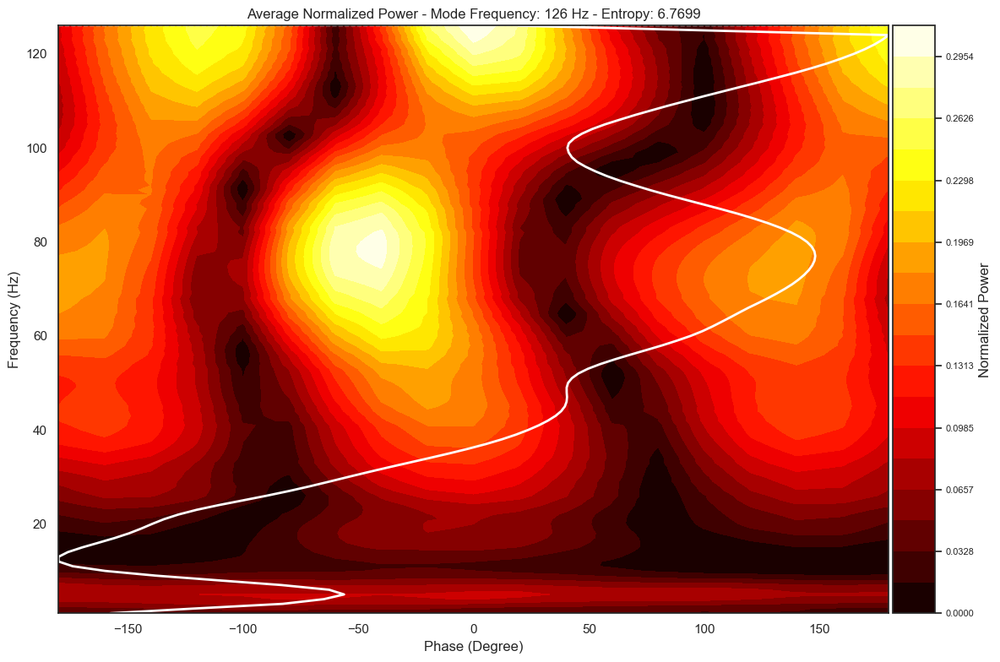

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import entropy
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Define parameters for plot
angles = np.linspace(-180, 180, 19)
frequencies = np.linspace(1, 126, 126)  # Assuming a frequency range from 1 to 126 Hz

# Filter out entries with incorrect shapes (only keep numpy arrays with shape (x, 126, 19))
filtered_FPPs = [
    inner_list for inner_list in combined_phasic_FPPs
    if isinstance(inner_list, np.ndarray) and inner_list.shape[1:] == (126, 19)
]

# Calculate the mean across the filtered list
avg_FPP = np.mean([np.mean(inner_list, axis=0) for inner_list in filtered_FPPs], axis=0)

# Normalize and smooth avg_FPP for plotting
avg_fpp_abs = np.abs(avg_FPP)
normalized_avg_FPP = avg_fpp_abs / np.sum(avg_fpp_abs)
avg_fpp2 = np.sum(avg_fpp_abs, axis=1)

# Smoothing parameters
window_size = 5
smoothed_avg_fpp = np.convolve(avg_fpp2, np.ones(window_size) / window_size, mode='same')
dist_smoothed_avg_fpp = smoothed_avg_fpp / np.sum(smoothed_avg_fpp)

# Normalize smoothed_avg_fpp for entropy calculation and plotting
smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / (np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp))

# Mode frequency and angle
max_index = np.unravel_index(np.argmax(normalized_avg_FPP, axis=None), normalized_avg_FPP.shape)
mode_frequency = frequencies[max_index[0]]
mode_angle = angles[max_index[1]]

# Calculate Shannon entropy
shannon_entropy = entropy(smoothed_avg_fpp_norm.flatten(), base=2)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Create contour plot without vmin and vmax
n_levels = 20
levels = np.linspace(np.min(avg_fpp_abs), np.max(avg_fpp_abs), n_levels)
contour = ax.contourf(angles, frequencies, avg_fpp_abs, levels=levels, cmap='hot')

# Add color bar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(contour, cax=cax)
cbar.set_label('Normalized Power')
cbar.ax.tick_params(labelsize=8)

# Plot scaled smoothed profile
scaled_profile = smoothed_avg_fpp_norm * (angles[-1] - angles[0]) + angles[0]
ax.plot(scaled_profile, frequencies, color='white', linewidth=2)

# Plot mode frequency line
ax.axhline(mode_frequency, color='white', linestyle='--', linewidth=1)

# Set plot labels and title
ax.set_xlabel('Phase (Degree)')
ax.set_ylabel('Frequency (Hz)')
ax.set_xlim(angles[0], angles[-1])
ax.set_ylim(frequencies[0], frequencies[-1])
ax.set_title(f"Average Normalized Power - Mode Frequency: {int(mode_frequency)} Hz - Entropy: {shannon_entropy:.4f}")

# Finalize and show plot
plt.tight_layout()
plt.savefig("average_phasic_FPP_spectrogram_no_limit.svg", format='svg')
plt.show()

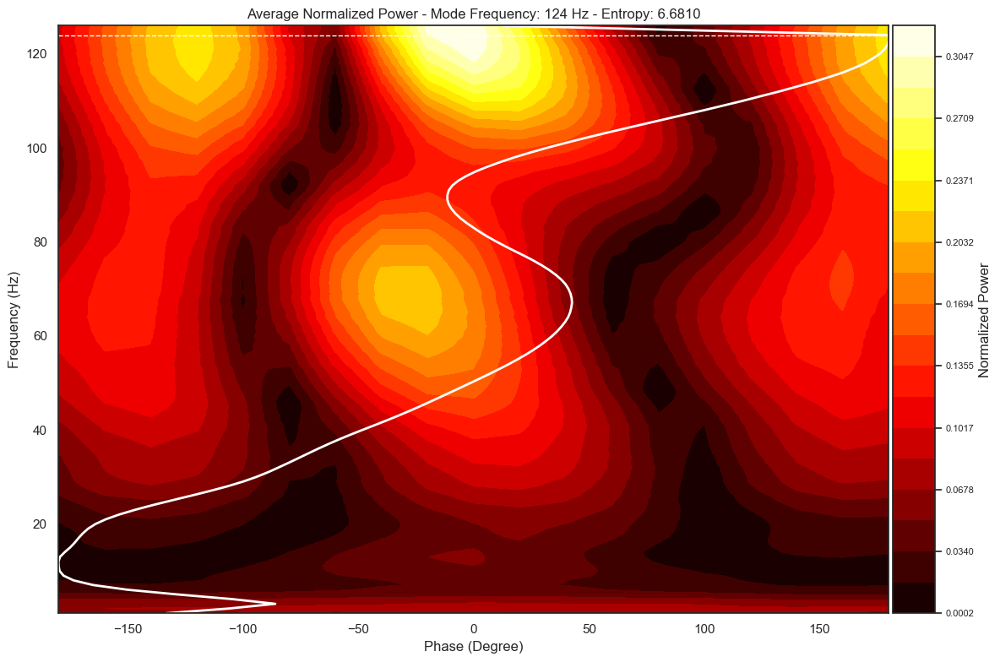

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import entropy
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Define parameters for plot
angles = np.linspace(-180, 180, 19)
frequencies = np.linspace(1, 126, 126)  # Assuming a frequency range from 1 to 126 Hz

# Filter out entries with incorrect shapes (only keep numpy arrays with shape (x, 126, 19))
filtered_FPPs = [
    inner_list for inner_list in combined_tonic_FPPs
    if isinstance(inner_list, np.ndarray) and inner_list.shape[1:] == (126, 19)
]

# Calculate the mean across the filtered list
avg_FPP = np.mean([np.mean(inner_list, axis=0) for inner_list in filtered_FPPs], axis=0)

# Normalize and smooth avg_FPP for plotting
avg_fpp_abs = np.abs(avg_FPP)
normalized_avg_FPP = avg_fpp_abs / np.sum(avg_fpp_abs)
avg_fpp2 = np.sum(avg_fpp_abs, axis=1)

# Smoothing parameters
window_size = 5
smoothed_avg_fpp = np.convolve(avg_fpp2, np.ones(window_size) / window_size, mode='same')
dist_smoothed_avg_fpp = smoothed_avg_fpp / np.sum(smoothed_avg_fpp)

# Normalize smoothed_avg_fpp for entropy calculation and plotting
smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / (np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp))

# Mode frequency and angle
max_index = np.unravel_index(np.argmax(normalized_avg_FPP, axis=None), normalized_avg_FPP.shape)
mode_frequency = frequencies[max_index[0]]
mode_angle = angles[max_index[1]]

# Calculate Shannon entropy
shannon_entropy = entropy(smoothed_avg_fpp_norm.flatten(), base=2)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Create contour plot without vmin and vmax
n_levels = 20
levels = np.linspace(np.min(avg_fpp_abs), np.max(avg_fpp_abs), n_levels)
contour = ax.contourf(angles, frequencies, avg_fpp_abs, levels=levels, cmap='hot')

# Add color bar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(contour, cax=cax)
cbar.set_label('Normalized Power')
cbar.ax.tick_params(labelsize=8)

# Plot scaled smoothed profile
scaled_profile = smoothed_avg_fpp_norm * (angles[-1] - angles[0]) + angles[0]
ax.plot(scaled_profile, frequencies, color='white', linewidth=2)

# Plot mode frequency line
ax.axhline(mode_frequency, color='white', linestyle='--', linewidth=1)

# Set plot labels and title
ax.set_xlabel('Phase (Degree)')
ax.set_ylabel('Frequency (Hz)')
ax.set_xlim(angles[0], angles[-1])
ax.set_ylim(frequencies[0], frequencies[-1])
ax.set_title(f"Average Normalized Power - Mode Frequency: {int(mode_frequency)} Hz - Entropy: {shannon_entropy:.4f}")

# Finalize and show plot
plt.tight_layout()
plt.savefig("average_phasic_FPP_spectrogram_no_limit.svg", format='svg')
plt.show()

# Extract spectoral table

In [14]:
import os
import re
import numpy as np
import h5py
from scipy.stats import entropy

# Initialize a dictionary to collect data
data_dict = {
    'rat_id': [],
    'study_day': [],
    'condition': [],
    'treatment': [],
    'trial_num': [],
    'state': [],
    'mode_frequency': [],
    'mode_angle': [],
    'entropy': [],
    'average_spectrum': []
}

# Define frequencies and angles according to your data
# Replace these with your actual frequency and angle arrays
frequencies = np.arange(15, 141, 5)
angles = np.linspace(-180, 180, 19)

def extract_spectural_signiture(FPP, frequencies, angles):
    """Extracts spectral signatures and computes metrics for each cycle."""
    results = []

    # Process each cycle to extract its normalized smoothed average FPP
    for fpp in FPP:
        fpp = np.abs(fpp)
        fpp_sum = np.sum(fpp)
        normalized_fpp = fpp / fpp_sum if fpp_sum != 0 else fpp
        avg_fpp = np.sum(normalized_fpp, axis=1)

        # Smooth and normalize the avg_fpp
        window_size = 5  # 5 Hz window
        smoothed_avg_fpp = np.convolve(avg_fpp, np.ones(window_size)/window_size, mode='same')
        smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / (np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp))

        # Compute mode frequency and angle
        max_index = np.unravel_index(np.argmax(normalized_fpp, axis=None), normalized_fpp.shape)
        mode_frequency = frequencies[max_index[0]]
        mode_angle = angles[max_index[1]]

        # Compute Shannon entropy
        shannon_entropy = entropy(smoothed_avg_fpp_norm.flatten(), base=2)

        result = {
            'average_spectrum': smoothed_avg_fpp_norm,
            'mode_frequency': mode_frequency,
            'mode_angle': mode_angle,
            'entropy': shannon_entropy
        }
        results.append(result)

    return results

def extract_data_for_rat(rat_id):
    # Define the base path to OS Basic datasets
    base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
    fs = 2500  # Sample frequency

    rat_path = os.path.join(base_path, str(rat_id))

    # Check if the specified rat folder exists
    if not os.path.isdir(rat_path):
        print(f"Rat folder {rat_id} does not exist.")
        return

    # List all recording folders in the rat directory
    recording_folders = [
        f for f in os.listdir(rat_path)
        if os.path.isdir(os.path.join(rat_path, f))
    ]

    if not recording_folders:
        print(f"No recording folders found for Rat {rat_id}.")
        return

    # Loop over each recording folder
    for recording_folder in recording_folders:
        print(f"Processing recording folder: {recording_folder}")
        recording_path = os.path.join(rat_path, recording_folder)

        # Use regular expressions to parse the folder name
        match = re.match(r'^Rat-OS-Ephys_(Rat\d+)_SD(\d+)_(\w+)_([\d-]+)$', recording_folder)
        if not match:
            print(f"Unexpected folder name format: {recording_folder}. Skipping...")
            continue

        rat_id_part = match.group(1)       # e.g., 'Rat6'
        sd_number = match.group(2)         # e.g., '4'
        condition = match.group(3)         # e.g., 'CON'
        date_part = match.group(4)         # e.g., '22-02-2018'

        rat_id_from_folder = ''.join(filter(str.isdigit, rat_id_part))

        # Check if rat_id_from_folder matches rat_id
        if rat_id_from_folder != str(rat_id):
            print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
            continue

        # Detect all trial folders and filter for post_trial2 to post_trial5
        trial_folders = [
            f for f in os.listdir(recording_path)
            if os.path.isdir(os.path.join(recording_path, f)) and
            re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', f)
        ]

        if not trial_folders:
            print(f"No trial folders found in {recording_folder}.")
            continue

        for trial_folder in trial_folders:
            print(f"Processing trial folder: {trial_folder}")
            trial_path = os.path.join(recording_path, trial_folder)

            # Search for LFP and state files in the trial folder
            lfp_file = None
            state_file = None

            for file_name in os.listdir(trial_path):
                if 'HPC' in file_name and file_name.endswith('.mat'):
                    lfp_file = os.path.join(trial_path, file_name)
                elif 'states' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)
                elif 'States' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)

            # Ensure both LFP and state files were found
            if not lfp_file or not state_file:
                print(f"Missing LFP or state file in {trial_path}. Skipping...")
                continue

            # Extract trial number from folder name
            trial_number_match = re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', trial_folder)
            if trial_number_match:
                trial_number = int(trial_number_match.group(1))
            else:
                print(f"Unable to extract trial number from folder name: {trial_folder}. Skipping...")
                continue

            # Load data using custom functions
            try:
                # Replace with your actual data loading functions
                lfpHPC, hypno, _ = get_data(lfp_file, state_file)

                # Extract phasic and tonic intervals
                try:
                    phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
                except ValueError as e:
                    print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
                    phasic_interval, tonic_interval, lfp = [[], [], []]

                # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
                if phasic_interval and tonic_interval:
                    # Assume 'config' is defined elsewhere in your code
                    tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, tonic_interval, config, return_imfs_freqs=True)
                    phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, phasic_interval, config, return_imfs_freqs=True)

                    # Prepare FPPs for both phasic and tonic
                    phasic_FPPs = prepare_data_for_sa(phasic_imfs, phasic_freqs)
                    tonic_FPPs = prepare_data_for_sa(tonic_imfs, tonic_freqs)

                    # Extract spectral signatures and compute metrics
                    phasic_results = extract_spectural_signiture(phasic_FPPs, frequencies, angles)
                    tonic_results = extract_spectural_signiture(tonic_FPPs, frequencies, angles)

                    # Collect data per cycle for phasic intervals
                    for cycle_result in phasic_results:
                        data_dict['rat_id'].append(rat_id)
                        data_dict['study_day'].append(sd_number)
                        data_dict['condition'].append(condition)
                        data_dict['treatment'].append(4)  # Using 4 for all cycles as per your instruction
                        data_dict['trial_num'].append(trial_number)
                        data_dict['state'].append('phasic')
                        data_dict['mode_frequency'].append(cycle_result['mode_frequency'])
                        data_dict['mode_angle'].append(cycle_result['mode_angle'])
                        data_dict['entropy'].append(cycle_result['entropy'])
                        data_dict['average_spectrum'].append(cycle_result['average_spectrum'])

                    # Collect data per cycle for tonic intervals
                    for cycle_result in tonic_results:
                        data_dict['rat_id'].append(rat_id)
                        data_dict['study_day'].append(sd_number)
                        data_dict['condition'].append(condition)
                        data_dict['treatment'].append(4)
                        data_dict['trial_num'].append(trial_number)
                        data_dict['state'].append('tonic')
                        data_dict['mode_frequency'].append(cycle_result['mode_frequency'])
                        data_dict['mode_angle'].append(cycle_result['mode_angle'])
                        data_dict['entropy'].append(cycle_result['entropy'])
                        data_dict['average_spectrum'].append(cycle_result['average_spectrum'])

            except FileNotFoundError:
                print(f"Data not found in {trial_path}. Skipping...")
            except Exception as e:
                print(f"Error processing data in {trial_folder}: {e}")
                continue

In [15]:
# List of rat IDs to process
rat_ids = [3, 4, 6, 9, 11, 13]

# Loop through each rat ID and process their data
for rat_id in rat_ids:
    print(f"Processing data for Rat {rat_id}...")
    extract_data_for_rat(rat_id)


Processing data for Rat 3...
Processing recording folder: Rat-OS-Ephys_Rat3_SD1_OR_08-11-2017
Processing trial folder: post_trial5_2017-11-08_16-18-24
There was 0 in the dataset
Number of detected Tonic intrevals:28
Number of detected Tonic intrevals after threshold:28
 Checking Cycles inputs - trimming singleton from input 'IP'
12995
 Checking Cycles inputs - trimming singleton from input 'IP'
5910
 Checking Cycles inputs - trimming singleton from input 'IP'
3370
 Checking Cycles inputs - trimming singleton from input 'IP'
3070
 Checking Cycles inputs - trimming singleton from input 'IP'
6230
 Checking Cycles inputs - trimming singleton from input 'IP'
3455
 Checking Cycles inputs - trimming singleton from input 'IP'
2350
 Checking Cycles inputs - trimming singleton from input 'IP'
3970
 Checking Cycles inputs - trimming singleton from input 'IP'
3680
 Checking Cycles inputs - trimming singleton from input 'IP'
3660
 Checking Cycles inputs - trimming singleton from input 'IP'
2695
 Ch

In [18]:
if data_dict['average_spectrum']:
    # Proceed to stack the arrays
    pass
else:
    print("No average_spectrum data to save.")
    # Handle the empty case appropriately

No average_spectrum data to save.


In [17]:
# Convert lists to numpy arrays (except 'average_spectrum')
for key in data_dict:
    if key != 'average_spectrum':
        data_dict[key] = np.array(data_dict[key])

# Stack average_spectrum arrays into a 2D array
# Assuming all average_spectrum arrays have the same length
# If they don't, you need to pad them or handle variable-length datasets
average_spectrum_array = np.vstack(data_dict['average_spectrum'])

# Save to HDF5 file
with h5py.File('cycles_data.h5', 'w') as hdf:
    # Save scalar datasets
    hdf.create_dataset('rat_id', data=data_dict['rat_id'])
    hdf.create_dataset('study_day', data=data_dict['study_day'])
    hdf.create_dataset('condition', data=np.string_(data_dict['condition']))  # Convert strings to bytes
    hdf.create_dataset('treatment', data=data_dict['treatment'])
    hdf.create_dataset('trial_num', data=data_dict['trial_num'])
    hdf.create_dataset('state', data=np.string_(data_dict['state']))
    hdf.create_dataset('mode_frequency', data=data_dict['mode_frequency'])
    hdf.create_dataset('mode_angle', data=data_dict['mode_angle'])
    hdf.create_dataset('entropy', data=data_dict['entropy'])
    # Save average_spectrum as a 2D array
    hdf.create_dataset('average_spectrum', data=average_spectrum_array)

print("Data has been saved to 'cycles_data.h5'.")

ValueError: need at least one array to concatenate

# /

In [24]:
# Initialize a dictionary to collect data
data_dict = {
    'rat_id': [],
    'study_day': [],
    'condition': [],
    'treatment': [],
    'trial_num': [],
    'state': [],
    'mode_frequency': [],
    'mode_angle': [],
    'entropy': [],
    'average_spectrum': []
}

In [25]:
frequencies = np.arange(15, 141, 1)
angles = np.linspace(-180, 180, 19)

In [26]:
def extract_spectural_signiture(FPP, frequencies, angles):
    results = []

    # Process each cycle to extract its normalized smoothed average FPP
    for idx, fpp in enumerate(FPP):
        fpp = np.abs(fpp)
        fpp_sum = np.sum(fpp)

        if fpp_sum == 0 or fpp.size == 0:
            print(f"Skipping empty or zero-valued fpp at index {idx}")
            continue  # Skip empty or zero-valued fpp

        normalized_fpp = fpp / fpp_sum
        avg_fpp = np.sum(normalized_fpp, axis=1)

        # Check shapes
        print(f"Cycle {idx}: normalized_fpp shape = {normalized_fpp.shape}")

        # Smooth and normalize the avg_fpp
        window_size = 5  # 5 Hz window
        smoothed_avg_fpp = np.convolve(avg_fpp, np.ones(window_size)/window_size, mode='same')

        # Avoid division by zero
        denom = np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp)
        if denom == 0:
            print(f"Skipping cycle {idx} due to zero denominator in normalization")
            continue

        smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / denom

        # Ensure shapes match
        if normalized_fpp.shape[0] != len(frequencies) or normalized_fpp.shape[1] != len(angles):
            print(f"Shape mismatch in cycle {idx}: normalized_fpp.shape = {normalized_fpp.shape}, frequencies length = {len(frequencies)}, angles length = {len(angles)}")
            continue  # Skip cycles with mismatched shapes

        # Compute mode frequency and angle
        max_index = np.unravel_index(np.argmax(normalized_fpp, axis=None), normalized_fpp.shape)
        mode_frequency = frequencies[max_index[0]]
        mode_angle = angles[max_index[1]]

        # Compute Shannon entropy
        shannon_entropy = entropy(smoothed_avg_fpp_norm.flatten(), base=2)

        result = {
            'average_spectrum': smoothed_avg_fpp_norm,
            'mode_frequency': mode_frequency,
            'mode_angle': mode_angle,
            'entropy': shannon_entropy
        }
        results.append(result)

    return results

In [ ]:

# def extract_data_for_rat(rat_id):
#     # Define the base path to OS Basic datasets
#     base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
#     fs = 2500  # Sample frequency

#     rat_path = os.path.join(base_path, str(rat_id))

#     # Check if the specified rat folder exists
#     if not os.path.isdir(rat_path):
#         print(f"Rat folder {rat_id} does not exist.")
#         return

#     # List all recording folders in the rat directory
#     recording_folders = [
#         f for f in os.listdir(rat_path)
#         if os.path.isdir(os.path.join(rat_path, f))
#     ]

#     if not recording_folders:
#         print(f"No recording folders found for Rat {rat_id}.")
#         return

#     # Loop over each recording folder
#     for recording_folder in recording_folders:
#         print(f"Processing recording folder: {recording_folder}")
#         recording_path = os.path.join(rat_path, recording_folder)

#         # Use regular expressions to parse the folder name
#         match = re.match(r'^Rat-OS-Ephys_(Rat\d+)_SD(\d+)_([\w-]+)_([\d-]+)$', recording_folder)
#         if not match:
#             print(f"Unexpected folder name format: {recording_folder}. Skipping...")
#             continue

#         rat_id_part = match.group(1)       # e.g., 'Rat6'
#         sd_number = match.group(2)         # e.g., '4'
#         condition = match.group(3)         # e.g., 'CON'
#         date_part = match.group(4)         # e.g., '22-02-2018'

#         rat_id_from_folder = ''.join(filter(str.isdigit, rat_id_part))

#         # Check if rat_id_from_folder matches rat_id
#         if rat_id_from_folder != str(rat_id):
#             print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
#             continue

#         # Detect all trial folders and filter for post_trial2 to post_trial5
#         trial_folders = [
#             f for f in os.listdir(recording_path)
#             if os.path.isdir(os.path.join(recording_path, f)) and
#             re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', f)
#         ]

#         if not trial_folders:
#             print(f"No trial folders found in {recording_folder}.")
#             continue

#         for trial_folder in trial_folders:
#             print(f"Processing trial folder: {trial_folder}")
#             trial_path = os.path.join(recording_path, trial_folder)

#             # Search for LFP and state files in the trial folder
#             lfp_file = None
#             state_file = None

#             for file_name in os.listdir(trial_path):
#                 if 'HPC' in file_name and file_name.endswith('.mat'):
#                     lfp_file = os.path.join(trial_path, file_name)
#                 elif 'states' in file_name and file_name.endswith('.mat'):
#                     state_file = os.path.join(trial_path, file_name)
#                 elif 'States' in file_name and file_name.endswith('.mat'):
#                     state_file = os.path.join(trial_path, file_name)

#             # Ensure both LFP and state files were found
#             if not lfp_file or not state_file:
#                 print(f"Missing LFP or state file in {trial_path}. Skipping...")
#                 continue

#             # Extract trial number from folder name
#             trial_number_match = re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', trial_folder)
#             if trial_number_match:
#                 trial_number = int(trial_number_match.group(1))
#             else:
#                 print(f"Unable to extract trial number from folder name: {trial_folder}. Skipping...")
#                 continue

#             # Load data using custom functions
#             try:
#                 # Replace with your actual data loading functions
#                 lfpHPC, hypno, _ = get_data(lfp_file, state_file)

#                 # Extract phasic and tonic intervals
#                 try:
#                     phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
#                 except ValueError as e:
#                     print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
#                     phasic_interval, tonic_interval, lfp = [[], [], []]

#                 # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
#                 if phasic_interval and tonic_interval:
#                     # Assume 'config' is defined elsewhere in your code
#                     tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
#                         lfp, fs, tonic_interval, config, return_imfs_freqs=True)
#                     phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
#                         lfp, fs, phasic_interval, config, return_imfs_freqs=True)

#                     # Prepare FPPs for both phasic and tonic
#                     phasic_FPPs = prepare_data_for_sa(phasic_imfs, phasic_freqs)
#                     tonic_FPPs = prepare_data_for_sa(tonic_imfs, tonic_freqs)

#                     print(f"Number of phasic FPPs: {len(phasic_FPPs)}")
#                     print(f"Number of tonic FPPs: {len(tonic_FPPs)}")
                    
#                     # Extract spectral signatures and compute metrics
#                     phasic_results = extract_spectural_signiture(phasic_FPPs, frequencies, angles)
#                     tonic_results = extract_spectural_signiture(tonic_FPPs, frequencies, angles)

#                     print(f"Number of phasic results: {len(phasic_results)}")
#                     print(f"Number of tonic results: {len(tonic_results)}")

#                     # Collect data per cycle for phasic intervals
#                     for cycle_result in phasic_results:
#                         data_dict['rat_id'].append(rat_id)
#                         data_dict['study_day'].append(sd_number)
#                         data_dict['condition'].append(condition)
#                         data_dict['treatment'].append(4)  # Using 4 for all cycles as per your instruction
#                         data_dict['trial_num'].append(trial_number)
#                         data_dict['state'].append('phasic')
#                         data_dict['mode_frequency'].append(cycle_result['mode_frequency'])
#                         data_dict['mode_angle'].append(cycle_result['mode_angle'])
#                         data_dict['entropy'].append(cycle_result['entropy'])
#                         data_dict['average_spectrum'].append(cycle_result['average_spectrum'])

#                     # Collect data per cycle for tonic intervals
#                     for cycle_result in tonic_results:
#                         data_dict['rat_id'].append(rat_id)
#                         data_dict['study_day'].append(sd_number)
#                         data_dict['condition'].append(condition)
#                         data_dict['treatment'].append(4)
#                         data_dict['trial_num'].append(trial_number)
#                         data_dict['state'].append('tonic')
#                         data_dict['mode_frequency'].append(cycle_result['mode_frequency'])
#                         data_dict['mode_angle'].append(cycle_result['mode_angle'])
#                         data_dict['entropy'].append(cycle_result['entropy'])
#                         data_dict['average_spectrum'].append(cycle_result['average_spectrum'])

#             except FileNotFoundError:
#                 print(f"Data not found in {trial_path}. Skipping...")
#             except Exception as e:
#                 print(f"Error processing data in {trial_folder}: {e}")
#                 continue

In [ ]:
def extract_spectural_signiture(fpp, frequencies, angles):
    """Extracts spectral signatures and computes metrics for a single FPP."""
    fpp = np.abs(fpp)
    fpp_sum = np.sum(fpp)
    if fpp_sum == 0 or fpp.size == 0:
        return None  # Skip empty or zero-valued fpp
    normalized_fpp = fpp / fpp_sum
    avg_fpp = np.sum(normalized_fpp, axis=1)

    # Smooth and normalize the avg_fpp
    window_size = 5  # 5 Hz window
    smoothed_avg_fpp = np.convolve(avg_fpp, np.ones(window_size)/window_size, mode='same')

    # Avoid division by zero
    denom = np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp)
    if denom == 0:
        return None
    smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / denom

    # Compute mode frequency and angle
    max_index = np.unravel_index(np.argmax(normalized_fpp, axis=None), normalized_fpp.shape)
    mode_frequency = frequencies[max_index[0]]
    mode_angle = angles[max_index[1]]

    # Compute Shannon entropy
    shannon_entropy = entropy(smoothed_avg_fpp_norm.flatten(), base=2)

    result = {
        'average_spectrum': smoothed_avg_fpp_norm,
        'mode_frequency': mode_frequency,
        'mode_angle': mode_angle,
        'entropy': shannon_entropy
    }
    return result

def extract_data_for_rat(rat_id):
    # Define the base path to OS Basic datasets
    base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
    fs = 2500  # Sample frequency

    rat_path = os.path.join(base_path, str(rat_id))

    # Check if the specified rat folder exists
    if not os.path.isdir(rat_path):
        print(f"Rat folder {rat_id} does not exist.")
        return []

    # List all recording folders in the rat directory
    recording_folders = [
        f for f in os.listdir(rat_path)
        if os.path.isdir(os.path.join(rat_path, f))
    ]

    if not recording_folders:
        print(f"No recording folders found for Rat {rat_id}.")
        return []

    # Initialize list to collect FPPs with metadata
    fpp_metadata_list = []

    # Loop over each recording folder
    for recording_folder in recording_folders:
        print(f"Processing recording folder: {recording_folder}")
        recording_path = os.path.join(rat_path, recording_folder)

        # Use regular expressions to parse the folder name
        match = re.match(r'^Rat-OS-Ephys_(Rat\d+)_SD(\d+)_([\w-]+)_([\d-]+)$', recording_folder)
        if not match:
            print(f"Unexpected folder name format: {recording_folder}. Skipping...")
            continue

        rat_id_part = match.group(1)       # e.g., 'Rat6'
        sd_number = match.group(2)         # e.g., '4'
        condition = match.group(3)         # e.g., 'CON' or 'OR-N'
        date_part = match.group(4)         # e.g., '22-02-2018'

        rat_id_from_folder = ''.join(filter(str.isdigit, rat_id_part))

        # Check if rat_id_from_folder matches rat_id
        if rat_id_from_folder != str(rat_id):
            print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
            continue

        # Detect all trial folders and filter for post_trial2 to post_trial5
        trial_folders = [
            f for f in os.listdir(recording_path)
            if os.path.isdir(os.path.join(recording_path, f)) and
            re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', f)
        ]

        if not trial_folders:
            print(f"No trial folders found in {recording_folder}.")
            continue

        for trial_folder in trial_folders:
            print(f"Processing trial folder: {trial_folder}")
            trial_path = os.path.join(recording_path, trial_folder)

            # Search for LFP and state files in the trial folder
            lfp_file = None
            state_file = None

            for file_name in os.listdir(trial_path):
                if 'HPC' in file_name and file_name.endswith('.mat'):
                    lfp_file = os.path.join(trial_path, file_name)
                elif 'states' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)
                elif 'States' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)

            # Ensure both LFP and state files were found
            if not lfp_file or not state_file:
                print(f"Missing LFP or state file in {trial_path}. Skipping...")
                continue

            # Extract trial number from folder name
            trial_number_match = re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', trial_folder)
            if trial_number_match:
                trial_number = int(trial_number_match.group(1))
            else:
                print(f"Unable to extract trial number from folder name: {trial_folder}. Skipping...")
                continue

            # Load data using custom functions
            try:
                lfpHPC, hypno, _ = get_data(lfp_file, state_file)

                # Extract phasic and tonic intervals, handling cases with no REM sleep
                try:
                    phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
                except ValueError as e:
                    print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
                    phasic_interval, tonic_interval, lfp = [[], [], []]

                # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
                if phasic_interval or tonic_interval:
                    # Assume 'config' is defined elsewhere in your code
                    if tonic_interval:
                        tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
                            lfp, fs, tonic_interval, config, return_imfs_freqs=True)
                        tonic_FPPs = prepare_data_for_sa(tonic_imfs, tonic_freqs)
                        for fpp in tonic_FPPs:
                            fpp_metadata_list.append({
                                'fpp': fpp,
                                'rat_id': rat_id,
                                'study_day': sd_number,
                                'condition': condition,
                                'treatment': 4,
                                'trial_num': trial_number,
                                'state': 'tonic'
                            })
                    if phasic_interval:
                        phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
                            lfp, fs, phasic_interval, config, return_imfs_freqs=True)
                        phasic_FPPs = prepare_data_for_sa(phasic_imfs, phasic_freqs)
                        for fpp in phasic_FPPs:
                            fpp_metadata_list.append({
                                'fpp': fpp,
                                'rat_id': rat_id,
                                'study_day': sd_number,
                                'condition': condition,
                                'treatment': 4,
                                'trial_num': trial_number,
                                'state': 'phasic'
                            })

            except FileNotFoundError:
                print(f"Data not found in {trial_path}. Skipping...")
            except Exception as e:
                print(f"Error processing data in {trial_folder}: {e}")
                continue

    return fpp_metadata_list


In [39]:
# List of rat IDs to process
rat_ids = [3]

# Collect all FPPs with metadata for all rats
all_fpp_metadata = []

for rat_id in rat_ids:
    print(f"Processing data for Rat {rat_id}...")
    fpp_metadata_list = extract_data_for_rat(rat_id)
    all_fpp_metadata.extend(fpp_metadata_list)



Processing data for Rat 3...
Processing recording folder: Rat-OS-Ephys_Rat3_SD1_OR_08-11-2017
Processing trial folder: post_trial5_2017-11-08_16-18-24
There was 0 in the dataset
Number of detected Tonic intrevals:28
Number of detected Tonic intrevals after threshold:28
 Checking Cycles inputs - trimming singleton from input 'IP'
37500
 Checking Cycles inputs - trimming singleton from input 'IP'
117500
 Checking Cycles inputs - trimming singleton from input 'IP'
45000
 Checking Cycles inputs - trimming singleton from input 'IP'
20000
 Checking Cycles inputs - trimming singleton from input 'IP'
170090
 Checking Cycles inputs - trimming singleton from input 'IP'
71915
 Checking Cycles inputs - trimming singleton from input 'IP'
15000
 Checking Cycles inputs - trimming singleton from input 'IP'
45000
 Checking Cycles inputs - trimming singleton from input 'IP'
25505
 Checking Cycles inputs - trimming singleton from input 'IP'
65644
 Checking Cycles inputs - trimming singleton from input 'I

In [46]:
fs = 2500

In [47]:
# Define frequencies and angles according to your data
# We'll infer the number of bins from the first FPP
if all_fpp_metadata:
    first_fpp = all_fpp_metadata[0]['fpp']
    # Assuming we need the first cycle
    first_fpp_cycle = first_fpp[0]
    print(f"First FPP cycle shape: {first_fpp_cycle.shape}")
    freq_bins, angle_bins = first_fpp_cycle.shape
    frequencies = np.linspace(0, fs/2, freq_bins)
    angles = np.linspace(0, 2 * np.pi, angle_bins)
else:
    print("No FPPs collected. Exiting.")
    exit()

# Process each FPP and collect data
for item in all_fpp_metadata:
    fpp = item['fpp']

    result = extract_spectural_signiture(fpp, frequencies, angles)
    if result is None:
        continue  # Skip if computation failed

    # Collect data
    data_dict['rat_id'].append(item['rat_id'])
    data_dict['study_day'].append(item['study_day'])
    data_dict['condition'].append(item['condition'])
    data_dict['treatment'].append(item['treatment'])
    data_dict['trial_num'].append(item['trial_num'])
    data_dict['state'].append(item['state'])
    data_dict['mode_frequency'].append(result['mode_frequency'])
    data_dict['mode_angle'].append(result['mode_angle'])
    data_dict['entropy'].append(result['entropy'])
    data_dict['average_spectrum'].append(result['average_spectrum'])

# Validate data collection
print("\nData collected:")
for key in data_dict:
    print(f"{key}: {len(data_dict[key])} entries")

# Save data to HDF5 file
import h5py

# Convert lists to numpy arrays (except 'average_spectrum')
for key in data_dict:
    if key != 'average_spectrum':
        data_dict[key] = np.array(data_dict[key])

with h5py.File('cycles_data.h5', 'w') as hdf:
    # Save scalar datasets
    hdf.create_dataset('rat_id', data=data_dict['rat_id'])
    hdf.create_dataset('study_day', data=data_dict['study_day'])
    hdf.create_dataset('condition', data=np.string_(data_dict['condition']))
    hdf.create_dataset('treatment', data=data_dict['treatment'])
    hdf.create_dataset('trial_num', data=data_dict['trial_num'])
    hdf.create_dataset('state', data=np.string_(data_dict['state']))
    hdf.create_dataset('mode_frequency', data=data_dict['mode_frequency'])
    hdf.create_dataset('mode_angle', data=data_dict['mode_angle'])
    hdf.create_dataset('entropy', data=data_dict['entropy'])

    # Check if average_spectrum has data
    if data_dict['average_spectrum']:
        # Handle variable-length datasets
        dt = h5py.vlen_dtype(np.dtype('float64'))
        hdf.create_dataset('average_spectrum', data=data_dict['average_spectrum'], dtype=dt)
    else:
        print("No average_spectrum data to save.")

print("Data has been saved to 'cycles_data.h5'.")

First FPP cycle shape: (126, 19)


ValueError: object too deep for desired array

# my version

In [2]:
frequencies = np.arange(15, 141, 5)
angles = np.linspace(-180, 180, 19)

In [14]:
def extract_and_flatten_signatures(fpps):
    """Extracts and flattens spectral signatures from a list of FPPs."""
    spectral_signatures = [extract_spectural_signiture(fpp) for fpp in fpps]
    # Flatten the nested list of spectral signatures
    flattened_signatures = np.array([ss for sublist in spectral_signatures for ss in sublist])
    return flattened_signatures

In [15]:
def extract_spectral_signature(fpp, frequencies):
    fpp = np.abs(fpp)
    fpp_sum = np.sum(fpp)
    if fpp_sum == 0 or fpp.size == 0:  # Skip empty or zero-valued fpp
        return None

    normalized_fpp = fpp / fpp_sum
    avg_fpp = np.sum(normalized_fpp, axis=1)  # Sum over angles

    # Smooth and normalize the avg_fpp
    window_size = 5  # 5 Hz window
    smoothed_avg_fpp = np.convolve(avg_fpp, np.ones(window_size) / window_size, mode='same')
    if np.max(smoothed_avg_fpp) == np.min(smoothed_avg_fpp):  # Avoid divide by zero
        return None
    smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / (np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp))

    # Compute mode frequency
    max_index = np.argmax(avg_fpp)  # Assuming mode is based on unsmoothed avg_fpp
    if max_index < len(frequencies):
        mode_frequency = frequencies[max_index]
    else:
        mode_frequency = None

    # Compute Shannon entropy
    shannon_entropy = entropy(smoothed_avg_fpp_norm.flatten(), base=2)

    return {
        'average_spectrum': smoothed_avg_fpp_norm,
        'mode_frequency': mode_frequency,
        'entropy': shannon_entropy
    }

In [ ]:
# def extract_spectural_signiture(fpp, frequencies, angles):
#     """Extracts spectral signatures and computes metrics for a single FPP."""
#     fpp = np.abs(fpp)
#     fpp_sum = np.sum(fpp)
#     if fpp_sum == 0 or fpp.size == 0:
#         return None  # Skip empty or zero-valued fpp

#     normalized_fpp = fpp / fpp_sum

#     # Decide which axis to sum over (assuming frequencies are on axis 0 and angles on axis 1)
#     avg_fpp = np.sum(normalized_fpp, axis=1)  # Sum over angles

#     # Ensure avg_fpp is 1D
#     if avg_fpp.ndim != 1:
#         avg_fpp = avg_fpp.flatten()

#     # Smooth and normalize the avg_fpp
#     window_size = 5  # 5 Hz window
#     smoothed_avg_fpp = np.convolve(avg_fpp, np.ones(window_size)/window_size, mode='same')

#     # Avoid division by zero
#     denom = np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp)
#     if denom == 0:
#         return None

#     smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / denom

#     # Compute mode frequency and angle
#     max_index = np.unravel_index(np.argmax(normalized_fpp, axis=None), normalized_fpp.shape)
#     mode_frequency = frequencies[max_index[1]]  # Use max_index[1] for the frequencies

#     # Compute Shannon entropy
#     shannon_entropy = entropy(smoothed_avg_fpp_norm.flatten(), base=2)

#     result = {
#         'average_spectrum': smoothed_avg_fpp_norm,
#         'mode_frequency': mode_frequency,
#         'entropy': shannon_entropy
#     }
#     return result

In [6]:
def extract_data_for_rat(rat_id):
    # Define the base path to OS Basic datasets
    base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
    fs = 2500  # Sample frequency

    # Initialize empty DataFrames for concatenation across all recordings and trials for the specified rat
    fpp_metadata_list = []

    rat_path = os.path.join(base_path, str(rat_id))

    # Check if the specified rat folder exists
    if not os.path.isdir(rat_path):
        print(f"Rat folder {rat_id} does not exist.")
        return None, None

    # List all recording folders in the rat directory
    recording_folders = [
        f for f in os.listdir(rat_path)
        if os.path.isdir(os.path.join(rat_path, f))
    ]

    if not recording_folders:
        print(f"No recording folders found for Rat {rat_id}.")
        return None, None

    # Loop over each recording folder
    for recording_folder in recording_folders:
        print(f"Processing recording folder: {recording_folder}")
        recording_path = os.path.join(rat_path, recording_folder)

        # Use regular expressions to parse the folder name
        match = re.match(r'^Rat-OS-Ephys_(Rat\d+)_SD(\d+)_([\w-]+)_([\d-]+)$', recording_folder)
        if not match:
            print(f"Unexpected folder name format: {recording_folder}. Skipping...")
            continue

        rat_id_part = match.group(1)       # e.g., 'Rat6'
        sd_number = match.group(2)         # e.g., '4'
        condition = match.group(3)         # e.g., 'CON'
        date_part = match.group(4)         # e.g., '22-02-2018'

        rat_id_from_folder = ''.join(filter(str.isdigit, rat_id_part))

        # Check if rat_id_from_folder matches rat_id
        if rat_id_from_folder != str(rat_id):
            print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
            continue

        # Detect all trial folders and filter for post_trial2 to post_trial5, considering various folder name formats
        trial_folders = [
            f for f in os.listdir(recording_path)
            if os.path.isdir(os.path.join(recording_path, f)) and
            re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', f)
        ]

        if not trial_folders:
            print(f"No trial folders found in {recording_folder}.")
            continue

        for trial_folder in trial_folders:
            print(f"Processing trial folder: {trial_folder}")
            trial_path = os.path.join(recording_path, trial_folder)

            # Search for LFP and state files in the trial folder
            lfp_file = None
            state_file = None

            for file_name in os.listdir(trial_path):
                if 'HPC' in file_name and file_name.endswith('.mat'):
                    lfp_file = os.path.join(trial_path, file_name)
                elif 'states' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)
                elif 'States' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)

            # Ensure both LFP and state files were found
            if not lfp_file or not state_file:
                print(f"Missing LFP or state file in {trial_path}. Skipping...")
                continue

            # Extract trial number from folder name
            trial_number_match = re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', trial_folder)
            if trial_number_match:
                trial_number = int(trial_number_match.group(1))
            else:
                print(f"Unable to extract trial number from folder name: {trial_folder}. Skipping...")
                continue

            # Load data using custom functions
            try:
                lfpHPC, hypno, _ = get_data(lfp_file, state_file)

                # Extract phasic and tonic intervals, handling cases with no REM sleep
                try:
                    phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
                except ValueError as e:
                    print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
                    phasic_interval, tonic_interval, lfp = [[], [], []]

                # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
                if phasic_interval and tonic_interval:
                    # Assume 'config' is defined elsewhere in your code
                    tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, tonic_interval, config, return_imfs_freqs=True)
                    phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, phasic_interval, config, return_imfs_freqs=True)

                    # Prepare UMAP data for both phasic and tonic
                    phasic_FPPs = prepare_data_for_sa(phasic_imfs, phasic_freqs)
                    for fpp in phasic_FPPs:
                            fpp_metadata_list.append({
                                'fpp': fpp,
                                'rat_id': rat_id,
                                'study_day': sd_number,
                                'condition': condition,
                                'treatment': 4,
                                'trial_num': trial_number,
                                'state': 'phasic'
                            })
                    tonic_FPPs = prepare_data_for_sa(tonic_imfs, tonic_freqs)
                    for fpp in tonic_FPPs:
                            fpp_metadata_list.append({
                                'fpp': fpp,
                                'rat_id': rat_id,
                                'study_day': sd_number,
                                'condition': condition,
                                'treatment': 4,
                                'trial_num': trial_number,
                                'state': 'tonic'
                            })
            except FileNotFoundError:
                print(f"Data not found in {trial_path}. Skipping...")

    return fpp_metadata_list

In [14]:
# List of rat IDs to process
rat_ids = [1, 3, 4, 6, 9, 11, 13]

# Collect all FPPs with metadata for all rats
all_fpp_metadata = []

for rat_id in rat_ids:
    print(f"Processing data for Rat {rat_id}...")
    fpp_metadata_list = extract_data_for_rat(rat_id)
    all_fpp_metadata.extend(fpp_metadata_list)

Processing data for Rat 1...
Processing recording folder: Rat-OS-Ephys_Rat1_SD1_OD_21-09-2017
Processing trial folder: post_trial3_2017-09-21_12-48-10
There was 0 in the dataset
Number of detected Tonic intrevals:18
Number of detected Tonic intrevals after threshold:18
 Checking Cycles inputs - trimming singleton from input 'IP'
6635
 Checking Cycles inputs - trimming singleton from input 'IP'
4360
 Checking Cycles inputs - trimming singleton from input 'IP'
3735
 Checking Cycles inputs - trimming singleton from input 'IP'
3839
 Checking Cycles inputs - trimming singleton from input 'IP'
4275
 Checking Cycles inputs - trimming singleton from input 'IP'
7665
 Checking Cycles inputs - trimming singleton from input 'IP'
3885
 Checking Cycles inputs - trimming singleton from input 'IP'
3440
 Checking Cycles inputs - trimming singleton from input 'IP'
13529
 Checking Cycles inputs - trimming singleton from input 'IP'
4520
 Checking Cycles inputs - trimming singleton from input 'IP'
3705
 Ch

In [ ]:
# def extract_and_flatten_signatures(fpps, frequencies, angles):
#     """Extracts spectral signatures from a list of FPPs."""
#     results = []
#     for fpp in fpps:
#         result = extract_spectural_signiture(fpp, frequencies, angles)
#         if result is not None:
#             results.append(result)
#     return results

In [123]:
# import numpy as np
# import h5py

# # Initialize data_dict to collect data
# data_dict = {
#     'rat_id': [],
#     'study_day': [],
#     'condition': [],
#     'treatment': [],
#     'trial_num': [],
#     'state': [],
#     'mode_frequency': [],
#     'entropy': [],
#     'average_spectrum': []
# }

# # Process each FPP and collect data
# for item in all_fpp_metadata:
#     fpp = item['fpp']  # This is the 3D array of shape (x, y, z)

#     # Process each inner FPP (along the first dimension)
#     for inner_fpp in fpp:
#         # Extract spectral signatures for the current inner FPP
#         result = extract_spectral_signature(inner_fpp, frequencies)
#         if result is None:
#             continue  # Skip if computation failed

#         # Collect metadata for each inner FPP
#         data_dict['rat_id'].append(item['rat_id'])
#         data_dict['study_day'].append(item['study_day'])
#         data_dict['condition'].append(item['condition'])
#         data_dict['treatment'].append(item['treatment'])
#         data_dict['trial_num'].append(item['trial_num'])
#         data_dict['state'].append(item['state'])

#         # Collect spectral signature results
#         data_dict['mode_frequency'].append(result['mode_frequency'])
#         data_dict['entropy'].append(result['entropy'])

#         # Normalize average_spectrum to ensure it's always an array
#         avg_spec = result['average_spectrum']
#         if isinstance(avg_spec, float):
#             avg_spec = np.array([avg_spec])  # Wrap single floats into arrays
#         elif not isinstance(avg_spec, (np.ndarray, list)):
#             raise ValueError(f"Unexpected type for average_spectrum: {type(avg_spec)}")
#         data_dict['average_spectrum'].append(np.array(avg_spec))

# # Validate data collection
# print("\nData collected:")
# for key in data_dict:
#     print(f"{key}: {len(data_dict[key])} entries")

# # Convert string fields to byte strings for HDF5 compatibility
# data_dict['study_day'] = np.array([str(x).encode('utf-8') for x in data_dict['study_day']], dtype='S')
# data_dict['condition'] = np.array([str(x).encode('utf-8') for x in data_dict['condition']], dtype='S')
# data_dict['state'] = np.array([str(x).encode('utf-8') for x in data_dict['state']], dtype='S')

# # Save data to HDF5 file
# with h5py.File('cycles_data.h5', 'w') as hdf:
#     # Save scalar datasets
#     hdf.create_dataset('rat_id', data=np.array(data_dict['rat_id'], dtype='int'))
#     hdf.create_dataset('study_day', data=data_dict['study_day'])
#     hdf.create_dataset('condition', data=data_dict['condition'])
#     hdf.create_dataset('treatment', data=np.array(data_dict['treatment'], dtype='int'))
#     hdf.create_dataset('trial_num', data=np.array(data_dict['trial_num'], dtype='int'))
#     hdf.create_dataset('state', data=data_dict['state'])
#     hdf.create_dataset('mode_frequency', data=np.array(data_dict['mode_frequency'], dtype='float'))
#     hdf.create_dataset('entropy', data=np.array(data_dict['entropy'], dtype='float'))

#     # Handle variable-length datasets for average_spectrum
#     if data_dict['average_spectrum']:
#         dt = h5py.vlen_dtype(np.dtype('float64'))  # Variable-length float arrays
#         hdf.create_dataset('average_spectrum', data=np.array(data_dict['average_spectrum'], dtype=object), dtype=dt)
#     else:
#         print("No average_spectrum data to save.")

# print("Data has been saved to 'cycles_data.h5'.")

In [15]:
import pandas as pd
import numpy as np

# Initialize data list to collect rows
data_rows = []

# Process each FPP and collect data
for item in all_fpp_metadata:
    fpp = item['fpp']  # This is the 3D array of shape (x, y, z)

    # Process each inner FPP (along the first dimension)
    for inner_fpp in fpp:
        # Extract spectral signatures for the current inner FPP
        result = extract_spectral_signature(inner_fpp, frequencies)
        if result is None:
            continue  # Skip if computation failed

        # Flatten or serialize `average_spectrum` for CSV
        avg_spectrum_serialized = ','.join(map(str, result['average_spectrum']))

        # Collect a single row of data
        row = {
            'rat_id': item['rat_id'],
            'study_day': item['study_day'],
            'condition': item['condition'],
            'treatment': item['treatment'],
            'trial_num': item['trial_num'],
            'state': item['state'],
            'mode_frequency': result['mode_frequency'],
            'entropy': result['entropy'],
            'average_spectrum': avg_spectrum_serialized
        }

        # Append the row to the data list
        data_rows.append(row)

# Convert collected data to a Pandas DataFrame
df = pd.DataFrame(data_rows)

# Save the DataFrame to a CSV file
csv_filename = 'cycles_data_5hz.csv'
df.to_csv(csv_filename, index=False)

print(f"Data has been saved to '{csv_filename}'")

Data has been saved to 'cycles_data_5hz.csv'


In [16]:
import pandas as pd
import numpy as np

# Initialize data list to collect rows
data_rows = []

# Process each FPP and collect data
for item in all_fpp_metadata:
    fpp = item['fpp']  # This is the 3D array of shape (x, y, z)

    # Process each inner FPP (along the first dimension)
    for inner_fpp in fpp:
        # Extract spectral signatures for the current inner FPP
        result = extract_spectral_signature(inner_fpp, frequencies)
        if result is None:
            continue  # Skip if computation failed

        # Flatten or serialize `average_spectrum` for CSV
        avg_spectrum_serialized = ','.join(map(str, result['average_spectrum']))

        # Collect a single row of data
        row = {
            'rat_id': item['rat_id'],
            'study_day': item['study_day'],
            'condition': item['condition'],
            'treatment': item['treatment'],
            'trial_num': item['trial_num'],
            'state': item['state'],
            'mode_frequency': result['mode_frequency'],
            'entropy': result['entropy'],
            'average_spectrum': avg_spectrum_serialized
        }

        # Append the row to the data list
        data_rows.append(row)

# Convert collected data to a Pandas DataFrame
df = pd.DataFrame(data_rows)

# Filter DataFrame for phasic and tonic states
df_phasic = df[df['state'] == 'phasic']
df_tonic = df[df['state'] == 'tonic']

# Save each filtered DataFrame to a separate CSV file
df_phasic.to_csv('phasic_data_5hz.csv', index=False)
df_tonic.to_csv('tonic_data_5hz.csv', index=False)

print("Phasic data has been saved to 'phasic_data.csv'")
print("Tonic data has been saved to 'tonic_data.csv'")

Phasic data has been saved to 'phasic_data.csv'
Tonic data has been saved to 'tonic_data.csv'


In [20]:
import pandas as pd
import numpy as np

# Initialize data list to collect rows
data_rows = []

# Process each FPP and collect data
for item in all_fpp_metadata:
    try:
        # Attempt to access the 'fpp' key in the item
        fpp = item['fpp']  # This is the 3D array of shape (x, y, z)

        # Process each inner FPP (along the first dimension)
        for inner_fpp in fpp:
            # Extract spectral signatures for the current inner FPP
            result = extract_spectral_signature(inner_fpp, frequencies)
            if result is None:
                continue  # Skip if computation failed

            # Collect a single row of data
            row = {
                'rat_id': item['rat_id'],
                'study_day': item['study_day'],
                'condition': item['condition'],
                'treatment': item['treatment'],
                'trial_num': item['trial_num'],
                'state': item['state'],
                'mode_frequency': result['mode_frequency'],
                'entropy': result['entropy'],
                'average_spectrum': result['average_spectrum'],  # Use raw list for clarity
            }

            # Append the row to the data list
            data_rows.append(row)
    except (TypeError, KeyError) as e:
        # Log the error and continue with the next item
        print(f"Skipping item due to error: {e}")
        continue

# Convert collected data to a Pandas DataFrame
df = pd.DataFrame(data_rows)

# Filter DataFrame for phasic and tonic states
df_phasic = df[df['state'] == 'phasic']
df_tonic = df[df['state'] == 'tonic']

# Save each filtered DataFrame to a separate CSV file
df_phasic.to_csv('phasic_data.csv', index=False)
df_tonic.to_csv('tonic_data.csv', index=False)

print("Phasic data has been saved to 'phasic_data.csv'")
print("Tonic data has been saved to 'tonic_data.csv'")

Phasic data has been saved to 'phasic_data.csv'
Tonic data has been saved to 'tonic_data.csv'
